# Import Libraries

In [1]:
#==============================
# IMPORT LIBRARIES
#==============================

# Data Collection
#==============================
import yfinance as yf   #Download historical cryptocurrency data
import pandas as pd   #Data manipulation and analysis
import numpy as np   #Numerical computing
from datetime import date   #Handle dates
from tqdm import tqdm   #Progress bar for loops

# Data Scaling
#==============================
from sklearn.preprocessing import StandardScaler   #Standardize features by removing the mean and scaling to unit variance
from sklearn.preprocessing import MinMaxScaler   #Scale features to a fixed range

#Technical Indicators
#==============================
from ta.momentum import (
    RSIIndicator,
    ROCIndicator,
    StochasticOscillator
)

from ta.trend import (
    CCIIndicator,
    MACD,
    EMAIndicator,
    SMAIndicator
)

from ta.volatility import (
    AverageTrueRange
)

from ta.volume import (
    OnBalanceVolumeIndicator
)

#Statistical Analysis
#==============================
from scipy import stats
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

# Data Visualization
#==============================
import matplotlib.pyplot as plt
import seaborn as sns

#Warning Settings
#==============================
import warnings
warnings.filterwarnings("ignore")

In [2]:
#==============================
# SETTINGS
#==============================
#pandas. (2026a). Options and settings. [online] Available at: https://pandas.pydata.org/docs/user_guide/options.html.

'''Adjust the width of column for model performance display later'''

pd.set_option('display.max_colwidth', None)

# 1. Data Collection

In [3]:
#==============================
# DOWNLOAD CRYPTOCURRENCY DATA
#==============================

'''Collect data of Top 30 cryptocurrencies by market capitalization 
on 3/1/2021 on Coinmarketcap due to historical data availability'''

# Top 30 chosen cryptocurrencies
#==============================

crypto_tickers = [

    "BTC-USD",
    "ETH-USD",
    "LTC-USD",
    "XRP-USD",
    "DOT-USD",
    "ADA-USD",
    "BNB-USD",
    "LINK-USD",
    "XLM-USD",
    "EOS-USD",
    "XMR-USD",
    "THETA-USD",
    "TRX-USD",
    "XEM-USD",
    "VET-USD",
    "XTZ-USD",
    "UNI-USD",
    "LEO-USD",
    "CRO-USD",
    "DOGE-USD",
    "ATOM-USD",
    "NEO-USD",
    "AAVE-USD",
    "SNX-USD",
    "HT-USD",
    "FIL-USD",
    "DASH-USD",
    "IOTA-USD"   
]

In [4]:
# Download Time-frame
#==============================
#pandas. (2026b). pandas.MultiIndex.get_level_values. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.MultiIndex.get_level_values.html.
#PyQuantLab (2025). How to Download Market Data from Yahoo Finance and Backtest a Trend‑Following Strategy with…. [online] Medium. Available at: https://pyquantlab.medium.com/how-to-download-market-data-from-yahoo-finance-and-backtest-a-trend-following-strategy-with-458425077ac4.

# Define the download period
start_date = "2020-01-01"
end_date = "2026-08-16"

# Create empty containers
all_data = []
all_data_summary = []

# Loop through each ticker and download data
for ticker in tqdm(crypto_tickers):   #tqdm: a progress bar library for loops

    try:

        df = yf.download(

            ticker,

            start=start_date,
            end=end_date,

            auto_adjust=False,

            progress=False   #suppress the progress bar of Yahoo Finance

        )

        if df.empty:   #check if the DataFrame is empty (no data downloaded)

            all_data_summary.append([

                ticker,
                "FAILED",

                0,

                None,
                None

            ])

            continue

        # Flatten multi-index
        if isinstance(
            df.columns,
            pd.MultiIndex
        ):

            df.columns = (
                df.columns
                .get_level_values(0)   #keep only the first level of the MultiIndex
            )
        
            df.columns.name = None   #remove the column index name
        
        # Reset index
            df = df.reset_index()
        
        
        # Add ticker
        df["Ticker"] = ticker
        
        # Store dataframe

        all_data.append(
            df
        )

        all_data_summary.append([

            ticker,

            "SUCCESS",

            len(df),

            df["Date"].min(),

            df["Date"].max()

        ])

    except Exception as e:

        all_data_summary.append([   #store summary of failed downloads

            ticker,

            f"ERROR: {e}",   #actual error message

            0,

            None,

            None

        ])

        print(
            f"{ticker}: {e}"
        )


# Combine All Assets
#==============================

master_df = pd.concat(
    all_data,
    ignore_index=True
)


# Sort Final Dataset
#==============================

master_df = master_df.sort_values(
    ["Ticker","Date"]
).reset_index(
    drop=True
)


# Summary Table
#==============================

all_data_summary_df = pd.DataFrame(

    all_data_summary,

    columns=[

        "Ticker",
        "Status",
        "Rows",
        "Start Date",
        "End Date"

    ]

)


# Print Diagnostics
#==============================

print("\n" + "="*30)
print("DOWNLOAD SUMMARY")
print("="*30)

print(all_data_summary_df)

print("\nNumber of Tickers:")
print(master_df["Ticker"].nunique())

 57%|█████▋    | 16/28 [00:09<00:06,  1.81it/s]$UNI-USD: possibly delisted; no price data found  (1d 2020-01-01 -> 2026-08-16) (Yahoo error = "No data found, symbol may be delisted")

1 Failed download:
['UNI-USD']: possibly delisted; no price data found  (1d 2020-01-01 -> 2026-08-16) (Yahoo error = "No data found, symbol may be delisted")
100%|██████████| 28/28 [00:15<00:00,  1.76it/s]


DOWNLOAD SUMMARY
       Ticker   Status  Rows Start Date   End Date
0     BTC-USD  SUCCESS  2419 2020-01-01 2026-08-15
1     ETH-USD  SUCCESS  2419 2020-01-01 2026-08-15
2     LTC-USD  SUCCESS  2419 2020-01-01 2026-08-15
3     XRP-USD  SUCCESS  2419 2020-01-01 2026-08-15
4     DOT-USD  SUCCESS  2187 2020-08-20 2026-08-15
5     ADA-USD  SUCCESS  2419 2020-01-01 2026-08-15
6     BNB-USD  SUCCESS  2419 2020-01-01 2026-08-15
7    LINK-USD  SUCCESS  2419 2020-01-01 2026-08-15
8     XLM-USD  SUCCESS  2419 2020-01-01 2026-08-15
9     EOS-USD  SUCCESS  2419 2020-01-01 2026-08-15
10    XMR-USD  SUCCESS  2419 2020-01-01 2026-08-15
11  THETA-USD  SUCCESS  2419 2020-01-01 2026-08-15
12    TRX-USD  SUCCESS  2419 2020-01-01 2026-08-15
13    XEM-USD  SUCCESS  2419 2020-01-01 2026-08-15
14    VET-USD  SUCCESS  2419 2020-01-01 2026-08-15
15    XTZ-USD  SUCCESS  2419 2020-01-01 2026-08-15
16    UNI-USD   FAILED     0        NaT        NaT
17    LEO-USD  SUCCESS  2419 2020-01-01 2026-08-15
18    CRO-USD

In [5]:
#==============================
# REMOVE UNUSED COLUMNS - ADJ CLOSE
#==============================

master_df = master_df.drop(
    columns=["Adj Close"],
    errors="ignore"
)

print(list(master_df.columns))

['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker']


-> Fail to download 2 out of 30 cryptocurrencies

In [6]:
# Print First 5 Rows of Each Ticker
#==============================
print("\nFIRST 5 ROWS OF EACH TICKER:")
print("="*30)

for ticker in sorted(master_df["Ticker"].unique()):

    print(f"\n{ticker}")
    print("=" * len(ticker))

    print(
        master_df[
            master_df["Ticker"] == ticker
        ].head(5)
    )


FIRST 5 ROWS OF EACH TICKER:

AAVE-USD
        Date      Close       High        Low       Open  Volume    Ticker
0 2020-10-02   0.516571   0.516571   0.000000   0.000000       0  AAVE-USD
1 2020-10-03  53.151489  65.305939   0.523801   0.523836       0  AAVE-USD
2 2020-10-04  52.675034  55.070354  50.688992  53.179859       0  AAVE-USD
3 2020-10-05  53.219242  55.112358  49.787899  52.675034       0  AAVE-USD
4 2020-10-06  42.401600  53.402271  40.734577  53.291969  583091  AAVE-USD

ADA-USD
           Date     Close      High       Low      Open    Volume   Ticker
2144 2020-01-01  0.033458  0.033813  0.032704  0.032832  22948374  ADA-USD
2145 2020-01-02  0.032751  0.033507  0.032448  0.033474  20843934  ADA-USD
2146 2020-01-03  0.034180  0.034427  0.032491  0.032748  30162644  ADA-USD
2147 2020-01-04  0.034595  0.034685  0.033872  0.034191  29535781  ADA-USD
2148 2020-01-05  0.034721  0.035356  0.034545  0.034574  21479178  ADA-USD

ATOM-USD
           Date     Close      High      

In [7]:
#==============================
# BASIC OVERVIEW OF THE DATASET
#==============================

print("BASIC OVERVIEW:")
print("="*30)

# Dataset dimensions
#==============================
print(f"Dataset Shape        : {master_df.shape}")
print(f"Number of Rows       : {master_df.shape[0]:,}")
print(f"Number of Columns    : {master_df.shape[1]}")

# Column Names
#==============================
print("\nColumns:", list(master_df.columns))

# Date types
#==============================
print("\nDataframe Information:")
print(master_df.info())

BASIC OVERVIEW:
Dataset Shape        : (63438, 7)
Number of Rows       : 63,438
Number of Columns    : 7

Columns: ['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker']

Dataframe Information:
<class 'pandas.DataFrame'>
RangeIndex: 63438 entries, 0 to 63437
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype        
---  ------  --------------  -----        
 0   Date    63438 non-null  datetime64[s]
 1   Close   63438 non-null  float64      
 2   High    63438 non-null  float64      
 3   Low     63438 non-null  float64      
 4   Open    63438 non-null  float64      
 5   Volume  63438 non-null  int64        
 6   Ticker  63438 non-null  str          
dtypes: datetime64[s](1), float64(4), int64(1), str(1)
memory usage: 3.4 MB
None


# 2. Data Cleaning

In [8]:
#==============================
# CHECK DATE COLUMN TYPE
#==============================

master_df["Date"] = pd.to_datetime(master_df["Date"])

print(master_df["Date"].dtype)

datetime64[s]


In [9]:
#==============================
# MISSING VALUES
#==============================

print("MISSING VALUES:")
print("="*30)

# Count Total Missing Entries Per Column and Sort Descending
#==============================

missing_values = master_df.isnull().sum().sort_values(ascending=False)


# Display
#==============================

print(missing_values)

MISSING VALUES:
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
Ticker    0
dtype: int64


-> No missing data during the download process

In [10]:
#==============================
# FORWARD FILL MISSING VALUES
#=============================

''' Forward fill missing values in case of short gaps (maximum 3 days), 
remove observations with long gaps.'''

# Sort Observations Chronologically by Ticker and Date
#=============================

master_df = master_df.sort_values(["Ticker", "Date"]).copy()

# Price Related Columns
#=============================

price_cols = [
    "Close",
    "High",
    "Low",
    "Open",
    "Volume",
]

# Forward-fill Short Gaps (<= 3 days)
#=============================

master_df[price_cols] = (
    master_df
    .groupby("Ticker")[price_cols]
    .transform(lambda x: x.ffill(limit=3))
)

# Remove Remaining Missing Observations
#=============================

master_df = (
    master_df
    .dropna()
    .reset_index(drop=True)
)

# Verify Preprocessing
#=============================

print("\nMISSING VALUES AFTER CLEANING")
print("=" * 30)
print(master_df.isna().sum())

print(f"\nRemaining observations: {len(master_df):,}")
print(f"Remaining cryptocurrencies: {master_df['Ticker'].nunique()}")


MISSING VALUES AFTER CLEANING
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
Ticker    0
dtype: int64

Remaining observations: 63,438
Remaining cryptocurrencies: 27


In [11]:
#==============================
# CHECK DATA COVERAGE
#==============================

"""
Retain only cryptocurrencies with at least 95% data coverage.
"""

# Count Observations For Each Ticker
#=============================

ticker_counts = (
    master_df
    .groupby("Ticker")
    .size()
)

# Maximum Number of Observations
#=============================

max_rows = ticker_counts.max()

# Coverage Ratio
#=============================

coverage = (ticker_counts/ max_rows).sort_values(ascending=True)

# Display Coverage Table
#=============================

coverage_df = (
    coverage
    .rename("Coverage")
    .to_frame()
)

coverage_df["Coverage (%)"] = (
    coverage_df["Coverage"] * 100
).round(2)

coverage_df["Observations"] = ticker_counts

print("\nDATA COVERAGE by CRYPTOCURRENCY")
print("=" * 30)
print(coverage_df)

# Keep Cryptocurrencies With At Least 95% Coverage
#=============================

valid_tickers = coverage[
    coverage >= 0.95
].index

master_df = (
    master_df[
        master_df["Ticker"].isin(valid_tickers)
    ]
    .reset_index(drop=True)
)

# Summary
#=============================

print("\nDATA COVERAGE SUMMARY")
print("=" * 30)

print(f"Coverage Threshold      : 95%")
print(f"Maximum Observations    : {max_rows:,}")
print(f"Valid Cryptocurrencies  : {len(valid_tickers)}")
print(f"Remaining Observations  : {len(master_df):,}")

print("\nSelected Tickers:", len(valid_tickers))
print(sorted(valid_tickers.tolist()))


DATA COVERAGE by CRYPTOCURRENCY
           Coverage  Coverage (%)  Observations
Ticker                                         
IOTA-USD   0.434477         43.45          1051
AAVE-USD   0.886317         88.63          2144
DOT-USD    0.904093         90.41          2187
ADA-USD    1.000000        100.00          2419
BTC-USD    1.000000        100.00          2419
CRO-USD    1.000000        100.00          2419
ATOM-USD   1.000000        100.00          2419
BNB-USD    1.000000        100.00          2419
DOGE-USD   1.000000        100.00          2419
DASH-USD   1.000000        100.00          2419
ETH-USD    1.000000        100.00          2419
EOS-USD    1.000000        100.00          2419
FIL-USD    1.000000        100.00          2419
HT-USD     1.000000        100.00          2419
LEO-USD    1.000000        100.00          2419
LINK-USD   1.000000        100.00          2419
LTC-USD    1.000000        100.00          2419
NEO-USD    1.000000        100.00          2419
SNX-USD

In [12]:
#==============================
# CHECK DUPLICATE ROWS
#==============================
print("DUPLICATE ROWS:")
print("="*30)

print("Number of repeated rows:", master_df.duplicated().sum())

DUPLICATE ROWS:
Number of repeated rows: 0


3. Exploratory Data Analysis

In [13]:
#===========================================
# COLOR SETTINGS FOR CRYPTOCURRENCIES
#===========================================

colors = {

    "ADA-USD":    "#1f77b4",  
    "ATOM-USD":   "#ff7f0e",  
    "BNB-USD":    "#1e671e",  
    "BTC-USD":    "#d62728",  
    "FIL-USD":    "#9467bd",  
    "CRO-USD":    "#8c564b",  
    "DOGE-USD":   "#fd00b5", 
    "DASH-USD":   "#093E43", 
    "EOS-USD":    "#7f7f7f", 
    "ETH-USD":    "#bcbd22",  
    "HT-USD":     "#17becf",  
    "LEO-USD":    "#393b79",  
    "LINK-USD":   "#637939",  
    "LTC-USD":    "#8c6d31",  
    "NEO-USD":    "#843c39",  
    "SNX-USD":    "#7b4173",  
    "THETA-USD":  "#024c82", 
    "TRX-USD":    "#31a354",  
    "VET-USD":    "#756bb1",  
    "XEM-USD":    "#636363",  
    "XLM-USD":    "#e6550d",  
    "XMR-USD":    "#6baed6",  
    "XRP-USD":    "#ffae74",  
    "XTZ-USD":    "#f781bf", 
}

**Volatility**

In [14]:
#Bui, C. (2021). Bitcoin’s Realized Volatility Forecasting with GARCH and Multivariate LSTM. [online] GitHub. Available at: https://github.com/chibui191/bitcoin_volatility_forecasting/blob/main/Notebooks/Reports/report_notebook.ipynb.

In [15]:
#==============================
# CALCULATE PRICE RETURNS AND LOG RETURNS
#==============================

'''Turn raw prices into return/ log returns to make them stationary 
for time-series modeling later on'''

# Sort Data by Ticker and Date
#==============================

master_df = master_df.sort_values(
    ["Ticker","Date"]
)

# Calculate Simple Returns
#==============================

master_df["Return"] = (
    master_df.groupby("Ticker")["Close"]   #calculate returns separately for each ticker
    .pct_change()
)

# Calculate Log Returns
#==============================

master_df["Log Return"] = (
    master_df.groupby("Ticker")["Close"]
    .transform(                  #transform applies the function to each group and returns a series with the same index as the original dataFrame
        lambda x:
        np.log(x / x.shift(1))   #shift(1) moves prices down one row
    )
)

# Remove Missing Values Created by Return and Log Return Calculations
#==============================

master_df = master_df.dropna(
    subset=["Return","Log Return"]
)

In [16]:
#==============================
# DROP THE FIRST ROW OF DATA
#==============================

''' Because the first row is shifted forward to calculate returns/ log returns'''

master_df.dropna(inplace=True)
print("SAMPLE DATASET:")
print("="*30)
print("Rows and columns:", master_df.shape)

print("\nDataset:\n")

print(master_df.head(10))

SAMPLE DATASET:
Rows and columns: (58032, 9)

Dataset:

         Date     Close      High       Low      Open    Volume   Ticker  \
1  2020-01-02  0.032751  0.033507  0.032448  0.033474  20843934  ADA-USD   
2  2020-01-03  0.034180  0.034427  0.032491  0.032748  30162644  ADA-USD   
3  2020-01-04  0.034595  0.034685  0.033872  0.034191  29535781  ADA-USD   
4  2020-01-05  0.034721  0.035356  0.034545  0.034574  21479178  ADA-USD   
5  2020-01-06  0.037272  0.037299  0.034674  0.034751  37988444  ADA-USD   
6  2020-01-07  0.037047  0.037807  0.036653  0.037291  51562680  ADA-USD   
7  2020-01-08  0.036435  0.038551  0.036015  0.037055  49193345  ADA-USD   
8  2020-01-09  0.036359  0.036445  0.035673  0.036445  26562776  ADA-USD   
9  2020-01-10  0.036874  0.036980  0.034807  0.036335  47483943  ADA-USD   
10 2020-01-11  0.036825  0.037579  0.036522  0.036854  63485488  ADA-USD   

      Return  Log Return  
1  -0.021131   -0.021357  
2   0.043632    0.042707  
3   0.012142    0.012069  

-> Across all 23 cryptocurrencies, the return and log-return series exhibit the key stylized facts of financial time series, including volatility clustering, near-zero mean returns, and time-varying variance. The return distributions are consistently more peaked and possess heavier tails than the fitted normal distribution, indicating excess kurtosis and frequent extreme price movements. While log returns improve symmetry and reduce the influence of large price changes, they remain non-Gaussian. These empirical characteristics provide strong justification for modeling conditional volatility using a GARCH(1,1) model with Student's t-distributed innovations, which is better suited to capture the heavy-tailed nature of cryptocurrency returns than a standard Gaussian specification.

In [17]:
#==============================
# DESCRIBE RETURN
#==============================

print("RETURN DESCRIPTIVE STATISTICS:\nIN-SAMPLE PERIOD")
print("="*30)
master_df.Return.describe()

RETURN DESCRIPTIVE STATISTICS:
IN-SAMPLE PERIOD


count     58032.000000
mean          5.131399
std        1103.630519
min          -0.999996
25%          -0.021559
50%           0.000386
75%           0.021685
max      263682.498571
Name: Return, dtype: float64

In [18]:
#==============================
# DESCRIBE LOG RETURN
#==============================
print("LOG RETURN DESCRIPTIVE STATISTICS:\nIN-SAMPLE PERIOD")
print("="*30)
master_df["Log Return"].describe()

LOG RETURN DESCRIPTIVE STATISTICS:
IN-SAMPLE PERIOD


count    58032.000000
mean         0.000121
std          0.113638
min        -12.482505
25%         -0.021795
50%          0.000386
75%          0.021453
max         12.482505
Name: Log Return, dtype: float64

**Realized Volatility**

In [19]:
#====================================================
# REALIZED VOLATILITY FUNCTION
#====================================================

def realized_volatility(log_returns):
    """
    Calculate realized volatility.

    RV = sqrt(sum(r²)/(n-1))
    """
    n = len(log_returns)

    if n < 2:
        return np.nan

    return np.sqrt(
        np.sum(log_returns ** 2) / (n - 1)
    )

In [20]:
#====================================================
# CALCULATE REALIZED VOLATILITY OVER DIFFERENT ROLLING WINDOWS
# IN-SAMPLE DATA
#====================================================

'''
Calculate realized volatility over multiple rolling windows
including 1 week, 1 month, 2 months, 6 months, and 1 year.
'''

windows = [7, 30, 60, 180, 365]

for window in windows:

    master_df[f"RV_{window}"] = (

        master_df

        .groupby("Ticker")["Log Return"]

        .rolling(window)

        .apply(
            realized_volatility,
            raw=True
        )

        .reset_index(level=0, drop=True)

    )

In [21]:
#====================================================
# SUMMARY TABLE OF REALIZED VOLATILITY
# IN-SAMPLE DATA
#====================================================

summary_RV_table = (

    master_df[
        [
            "RV_7",
            "RV_30",
            "RV_60",
            "RV_180",
            "RV_365"
        ]
    ]

    .describe()

    .T

)

summary_RV_table = summary_RV_table.rename(

    columns={

        "count":"Count",

        "mean":"Mean",

        "std":"Std Dev",

        "min":"Minimum",

        "25%":"Q1",

        "50%":"Median",

        "75%":"Q3",

        "max":"Maximum"

    }

)

summary_RV_table = summary_RV_table.round(4)
print("REALIZED VOLATILITY SUMMARY TABLE\nIN-SAMPLE DATA")
print("="*30)
print(summary_RV_table)

REALIZED VOLATILITY SUMMARY TABLE
IN-SAMPLE DATA
          Count    Mean  Std Dev  Minimum      Q1  Median      Q3  Maximum
RV_7    57888.0  0.0492   0.1125   0.0010  0.0248  0.0376  0.0562   7.3452
RV_30   57336.0  0.0511   0.1042   0.0029  0.0290  0.0410  0.0572   3.9468
RV_60   56616.0  0.0528   0.1029   0.0039  0.0314  0.0430  0.0585   3.0826
RV_180  53736.0  0.0560   0.1026   0.0105  0.0357  0.0465  0.0582   1.7800
RV_365  49296.0  0.0594   0.1046   0.0133  0.0384  0.0474  0.0588   1.2510


-> Using 30 day interval window to smooth the volatility down and avoid wasting too many datapoints

Correlation

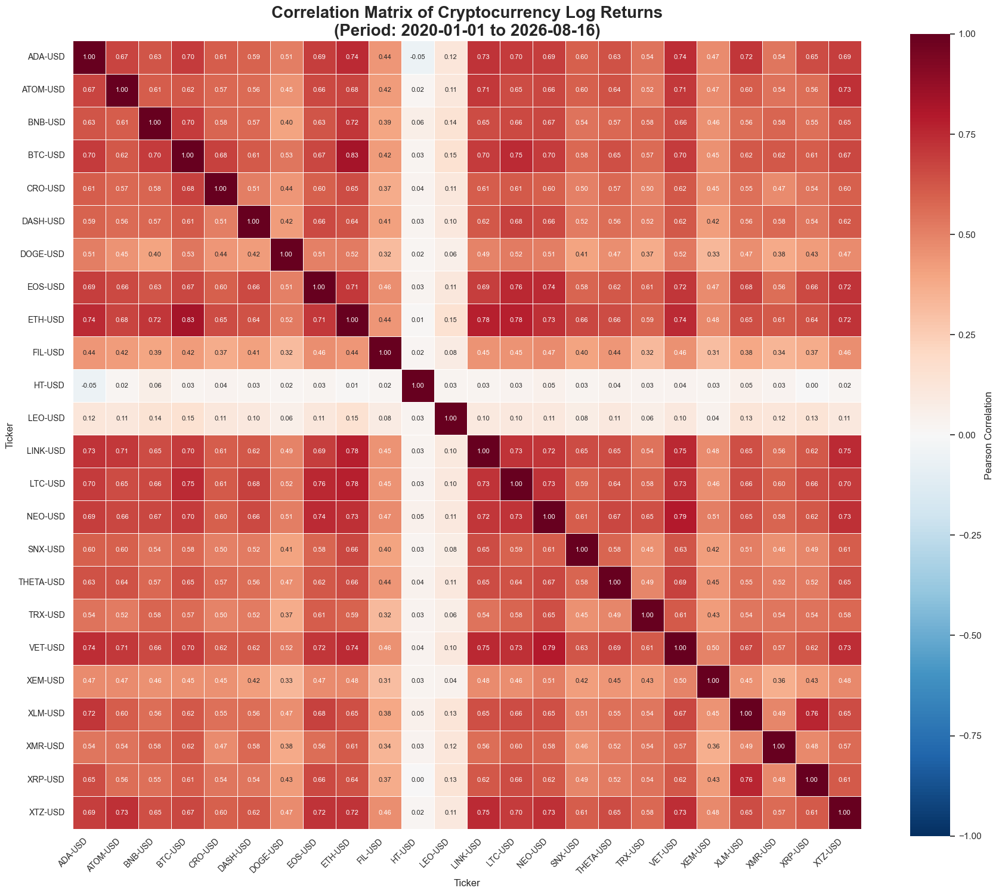

In [22]:
#====================================================
# CORRELATION HEATMAP
#====================================================

#----------------------------------------------------
# Create return matrix
#----------------------------------------------------

returns_df = (

    master_df

    .pivot(

        index="Date",

        columns="Ticker",

        values="Log Return"

    )

)

#----------------------------------------------------
# Correlation matrix
#----------------------------------------------------

corr_matrix = returns_df.corr()

#----------------------------------------------------
# Plot heatmap
#----------------------------------------------------

plt.figure(figsize=(18,15))

sns.set_theme(style="white")

sns.heatmap(

    corr_matrix,

    cmap="RdBu_r",

    center=0,

    vmin=-1,

    vmax=1,

    square=True,

    linewidths=0.5,

    annot=True,

    fmt=".2f",

    annot_kws={"size":8},

    cbar_kws={

        "label":"Pearson Correlation"

    }

)

plt.title(

    "Correlation Matrix of Cryptocurrency Log Returns\n"
    "(Period: {} to {})".format(start_date, end_date),

    fontsize=20,

    weight="bold"

)

plt.xticks(

    rotation=45,

    ha="right",

    fontsize=10

)

plt.yticks(

    rotation=0,

    fontsize=10

)

plt.tight_layout()

plt.show()

# 3. Baseline - GARCH (1,1) Model: Capture Volatility Clustering

In [23]:
#====================================================
# LOAD BEST WINDOW GARCH FORECAST AND METRIC EVALUATION
# 173 DAYS
#====================================================

garch_forecast_df = pd.read_csv(
    "garch_forecast_window_173.csv"
)

garch_forecast_df["Date"] = pd.to_datetime(
    garch_forecast_df["Date"]
)

print(garch_forecast_df.head(200))

      Ticker       Date  Window  GARCH_Vol
0    ADA-USD 2020-01-31     173        NaN
1    ADA-USD 2020-02-01     173        NaN
2    ADA-USD 2020-02-02     173        NaN
3    ADA-USD 2020-02-03     173        NaN
4    ADA-USD 2020-02-04     173        NaN
..       ...        ...     ...        ...
195  ADA-USD 2020-08-13     173   0.057867
196  ADA-USD 2020-08-14     173   0.055917
197  ADA-USD 2020-08-15     173   0.056085
198  ADA-USD 2020-08-16     173   0.055421
199  ADA-USD 2020-08-17     173   0.055052

[200 rows x 4 columns]


In [24]:
#====================================================
# REMOVE OLD GARCH COLUMNS
#====================================================
'''
cols_to_drop = [

    col

    for col in in_sample_df.columns

    if col.startswith("GARCH")

]

if len(cols_to_drop) > 0:

    print("Removing:")

    print(cols_to_drop)

    in_sample_df = in_sample_df.drop(
        columns=cols_to_drop
    )
    '''

'\ncols_to_drop = [\n\n    col\n\n    for col in in_sample_df.columns\n\n    if col.startswith("GARCH")\n\n]\n\nif len(cols_to_drop) > 0:\n\n    print("Removing:")\n\n    print(cols_to_drop)\n\n    in_sample_df = in_sample_df.drop(\n        columns=cols_to_drop\n    )\n    '

In [25]:
#====================================================
# MERGE GARCH FORECAST INTO IN-SAMPLE DATA
#====================================================

garch_df = (

    master_df

    .merge(

        garch_forecast_df,

        on=[
            "Ticker",
            "Date"
        ],

        how="left"

    )

)

print(garch_df.head(50))

         Date     Close      High       Low      Open     Volume   Ticker  \
0  2020-01-02  0.032751  0.033507  0.032448  0.033474   20843934  ADA-USD   
1  2020-01-03  0.034180  0.034427  0.032491  0.032748   30162644  ADA-USD   
2  2020-01-04  0.034595  0.034685  0.033872  0.034191   29535781  ADA-USD   
3  2020-01-05  0.034721  0.035356  0.034545  0.034574   21479178  ADA-USD   
4  2020-01-06  0.037272  0.037299  0.034674  0.034751   37988444  ADA-USD   
5  2020-01-07  0.037047  0.037807  0.036653  0.037291   51562680  ADA-USD   
6  2020-01-08  0.036435  0.038551  0.036015  0.037055   49193345  ADA-USD   
7  2020-01-09  0.036359  0.036445  0.035673  0.036445   26562776  ADA-USD   
8  2020-01-10  0.036874  0.036980  0.034807  0.036335   47483943  ADA-USD   
9  2020-01-11  0.036825  0.037579  0.036522  0.036854   63485488  ADA-USD   
10 2020-01-12  0.037690  0.037748  0.036580  0.036821   56546260  ADA-USD   
11 2020-01-13  0.036966  0.037944  0.036776  0.037696   56296775  ADA-USD   

In [26]:
#====================================================
# CHECK MERGE
#====================================================

print("=" * 30)
print("MERGE SUMMARY (GARCH MODEL)")
print("=" * 30)

print(f"Dataset Shape : {garch_df.shape}")

print(f"Number of Tickers : {garch_df['Ticker'].nunique()}")

print(f"Date Range : {garch_df['Date'].min().date()}  to  {garch_df['Date'].max().date()}")

print()

print("Columns:")

print(garch_df.columns.tolist())

print()

print("Missing GARCH Values:")

print(garch_df["GARCH_Vol"].isna().sum())

print(
    f"({100 * garch_df['GARCH_Vol'].isna().mean():.2f}%)"
)

print()

print("Missing RV_30 Values:")

print(garch_df["RV_30"].isna().sum())

print(
    f"({100 * garch_df['RV_30'].isna().mean():.2f}%)"
)

print()

print("First 40 Rows:")

print(

    garch_df[
        [
            "Ticker",
            "Date",
            "RV_30",
            "GARCH_Vol"
        ]
    ]

    .head(40)

)

MERGE SUMMARY (GARCH MODEL)
Dataset Shape : (58032, 16)
Number of Tickers : 24
Date Range : 2020-01-02  to  2026-08-15

Columns:
['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker', 'Return', 'Log Return', 'RV_7', 'RV_30', 'RV_60', 'RV_180', 'RV_365', 'Window', 'GARCH_Vol']

Missing GARCH Values:
5016
(8.64%)

Missing RV_30 Values:
696
(1.20%)

First 40 Rows:
     Ticker       Date     RV_30  GARCH_Vol
0   ADA-USD 2020-01-02       NaN        NaN
1   ADA-USD 2020-01-03       NaN        NaN
2   ADA-USD 2020-01-04       NaN        NaN
3   ADA-USD 2020-01-05       NaN        NaN
4   ADA-USD 2020-01-06       NaN        NaN
5   ADA-USD 2020-01-07       NaN        NaN
6   ADA-USD 2020-01-08       NaN        NaN
7   ADA-USD 2020-01-09       NaN        NaN
8   ADA-USD 2020-01-10       NaN        NaN
9   ADA-USD 2020-01-11       NaN        NaN
10  ADA-USD 2020-01-12       NaN        NaN
11  ADA-USD 2020-01-13       NaN        NaN
12  ADA-USD 2020-01-14       NaN        NaN
13  ADA-USD 20

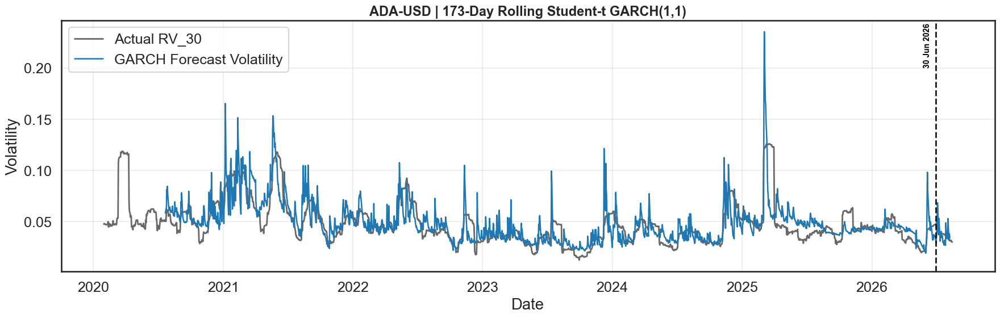

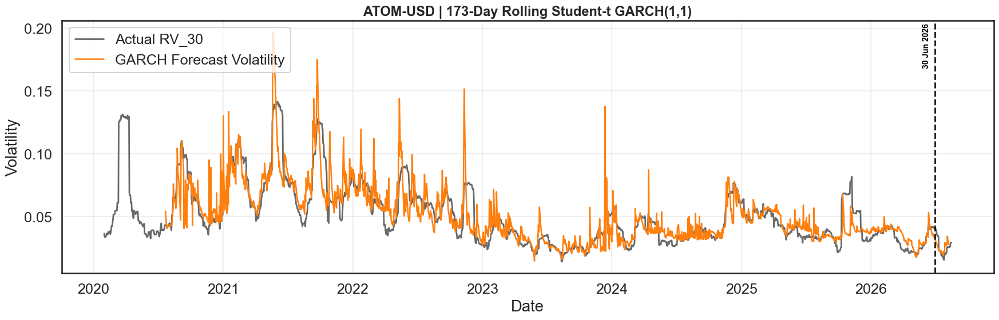

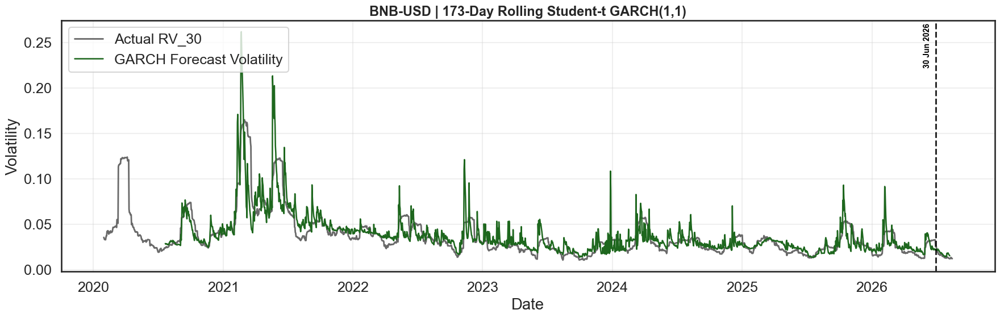

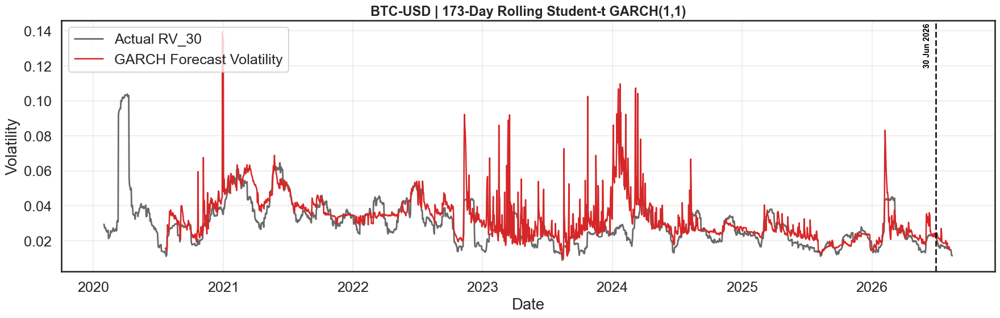

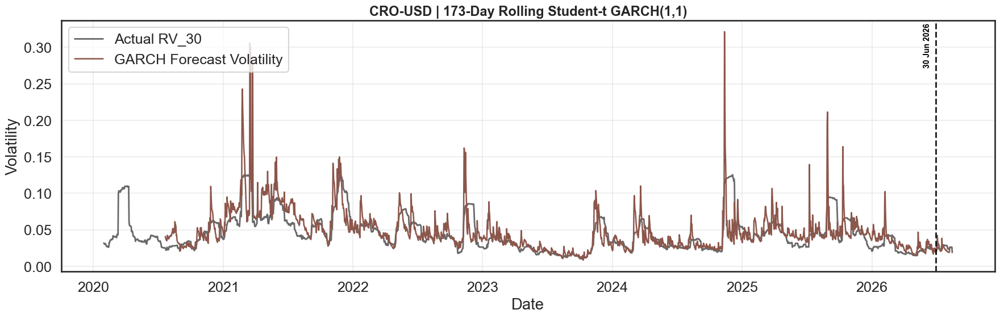

...

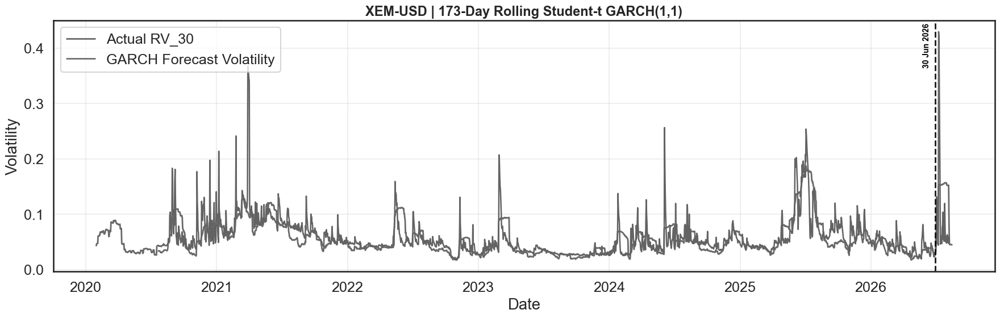

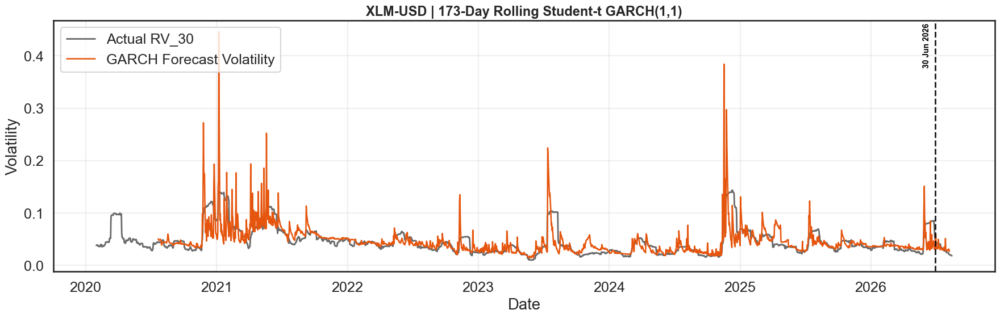

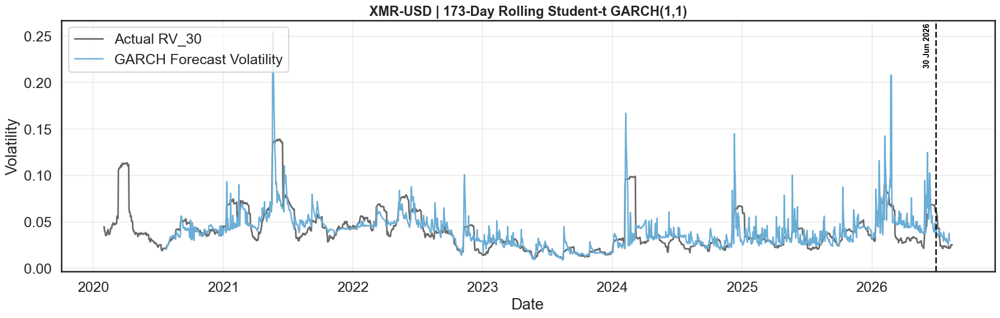

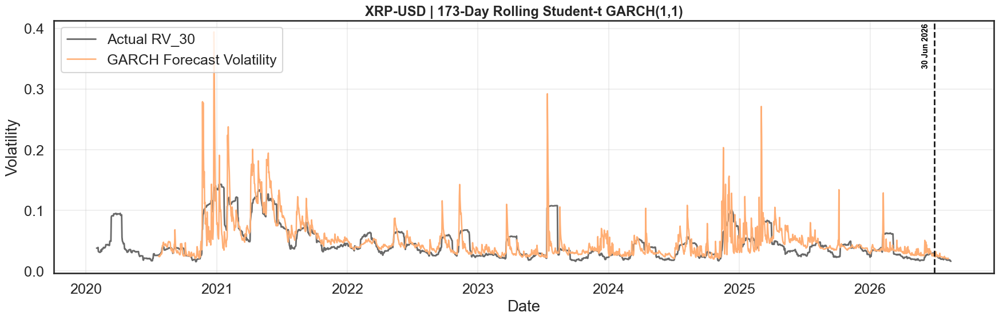

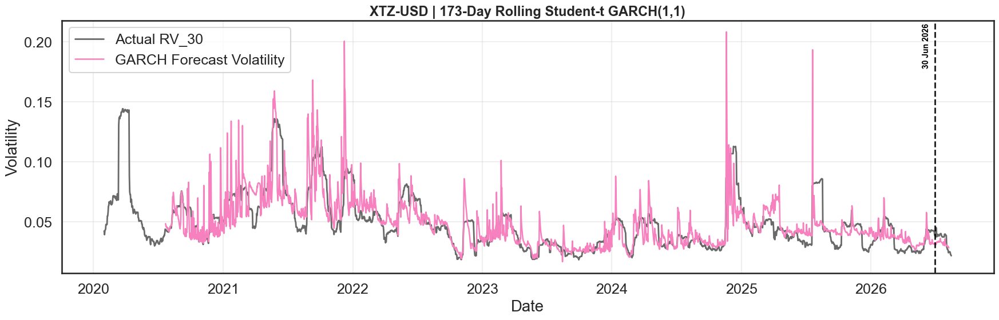

In [27]:
#====================================================
# VISUALIZE GARCH FORECAST VOLATILITY VS ACTUAL VOLATILITY
#====================================================

sns.set_context(
    "talk",
    font_scale=1.1
)

# Boundary Date
#====================================================

boundary_date = pd.Timestamp("2026-06-30")

for ticker in sorted(garch_df["Ticker"].unique()):

    coin = (
        garch_df[
            garch_df["Ticker"] == ticker
        ]
        .sort_values("Date")
    )

    # Create Figure
    #====================================================

    fig, ax = plt.subplots(
        figsize=(18, 6)
    )

    # Actual Volatility
    #====================================================

    ax.plot(
        coin["Date"],
        coin["RV_30"],
        color="dimgray",
        linewidth=2,
        label="Actual RV_30"
    )

    # GARCH Forecast Volatility
    #====================================================

    ax.plot(
        coin["Date"],
        coin["GARCH_Vol"],
        color=colors[ticker],
        linewidth=1.8,
        label="GARCH Forecast Volatility"
    )

    # Boundary Line at 30 June 2026
    #====================================================

    ax.axvline(
        x=boundary_date,
        color="black",
        linestyle="--",
        linewidth=2.0,
        alpha=0.9
    )

    # Boundary Annotation
    #====================================================
    # x = actual date
    # y = 90% of plot height

    ax.annotate(
        "30 Jun 2026",
        xy=(boundary_date, 0.90),
        xycoords=(
            "data",
            "axes fraction"
        ),
        xytext=(-6, 0),
        textcoords="offset points",
        rotation=90,
        verticalalignment="center",
        horizontalalignment="right",
        fontsize=10,
        fontweight="bold",
        color="black"
    )

    # Title
    #====================================================

    ax.set_title(
        f"{ticker} | "
        "173-Day Rolling Student-t GARCH(1,1)",
        fontsize=17,
        fontweight="bold"
    )

    # Axis Labels
    #====================================================

    ax.set_xlabel("Date")

    ax.set_ylabel("Volatility")

    # Grid
    #====================================================

    ax.grid(
        alpha=0.3
    )

    # Legend
    #====================================================

    ax.legend(
        loc="upper left"
    )

    # Layout
    #====================================================

    plt.tight_layout()

    plt.show()

In [28]:
#====================================================
# LOAD GARCH METRIC EVALUATION
#====================================================

garch_evaluation_df = pd.read_csv(
    "garch_173day_evaluation.csv"
)

garch_ranking_df = (

    garch_evaluation_df

    .sort_values("RMSE")

    .reset_index(drop=True)

)

garch_ranking_df.insert(

    0,

    "Rank",

    range(1, len(garch_ranking_df)+1)

)

print(garch_ranking_df)

    Rank     Ticker  Window       MAE      RMSE       MAPE     QLIKE        R2
0      1   LINK-USD     173  0.008411  0.011459  17.231392 -5.041904  0.669308
1      2    BTC-USD     173  0.007245  0.011625  28.950422 -6.080771 -0.204498
2      3    ETH-USD     173  0.008629  0.012046  25.443617 -5.513540  0.330423
3      4    VET-USD     173  0.009225  0.012782  18.878143 -5.041298  0.677621
4      5    LTC-USD     173  0.009175  0.012970  24.681118 -5.379309  0.455628
5      6  THETA-USD     173  0.009340  0.013010  17.347383 -4.840492  0.584585
6      7    BNB-USD     173  0.008448  0.013091  24.901450 -5.807249  0.662884
7      8   ATOM-USD     173  0.008989  0.013172  18.024602 -5.067663  0.686809
8      9    LEO-USD     173  0.008979  0.014517  40.383712 -5.781457  0.327971
9     10    ADA-USD     173  0.010206  0.014523  22.526016 -5.137563  0.465024
10    11    XTZ-USD     173  0.010474  0.015322  21.615430 -5.109095  0.488035
11    12    XMR-USD     173  0.009852  0.016113  24.

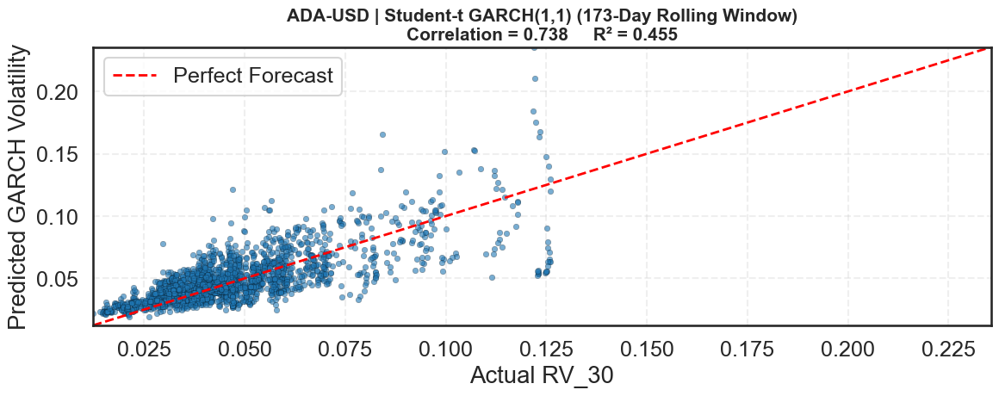

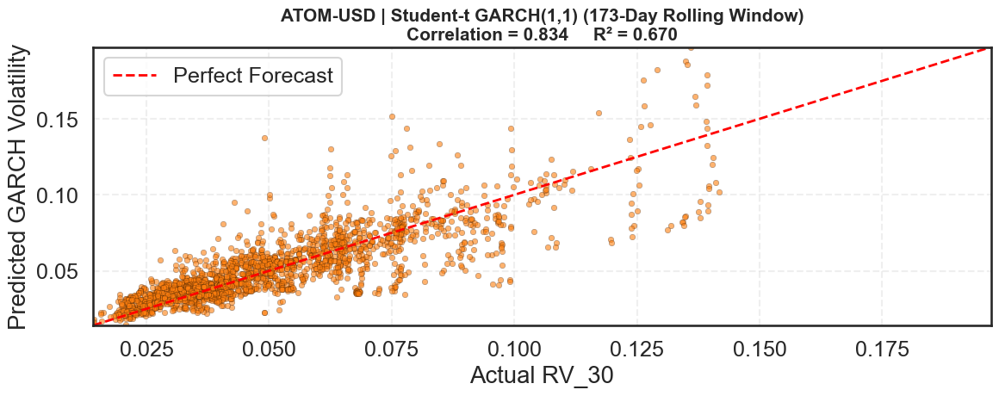

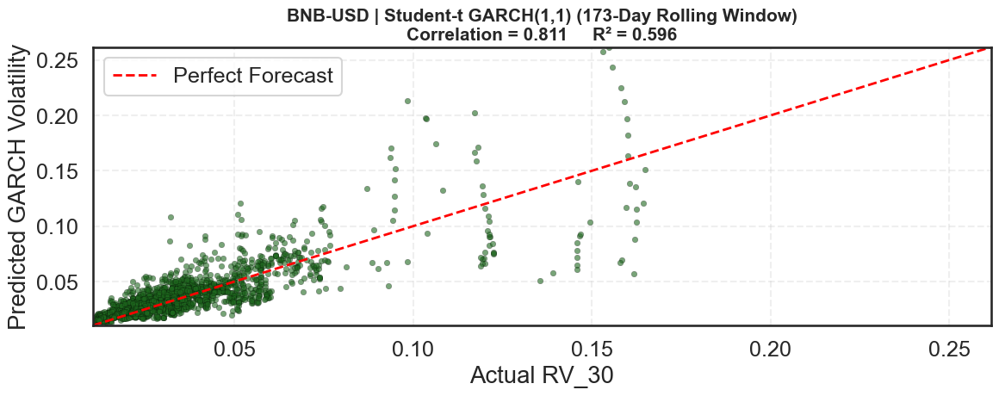

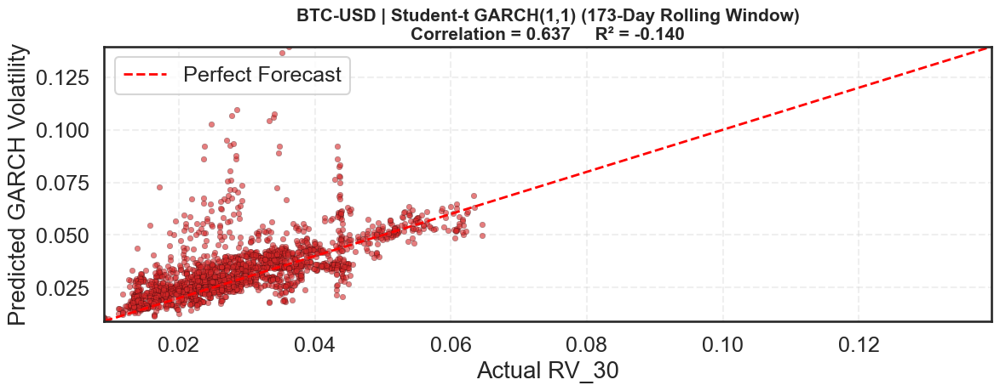

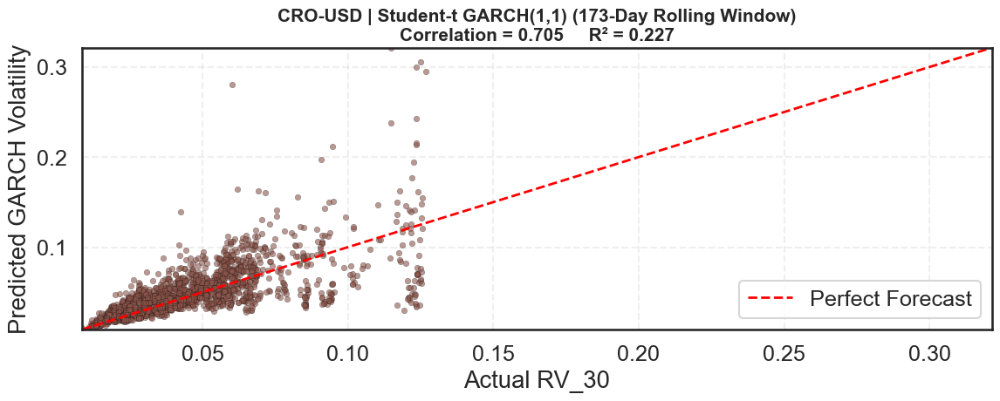

...

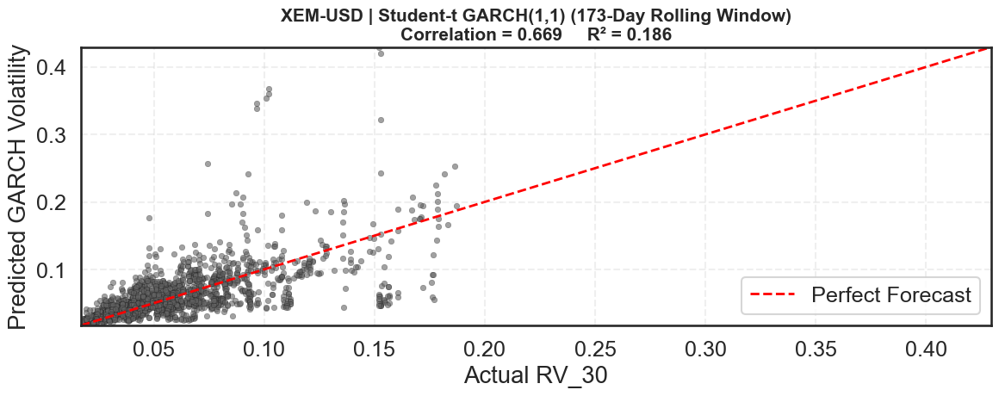

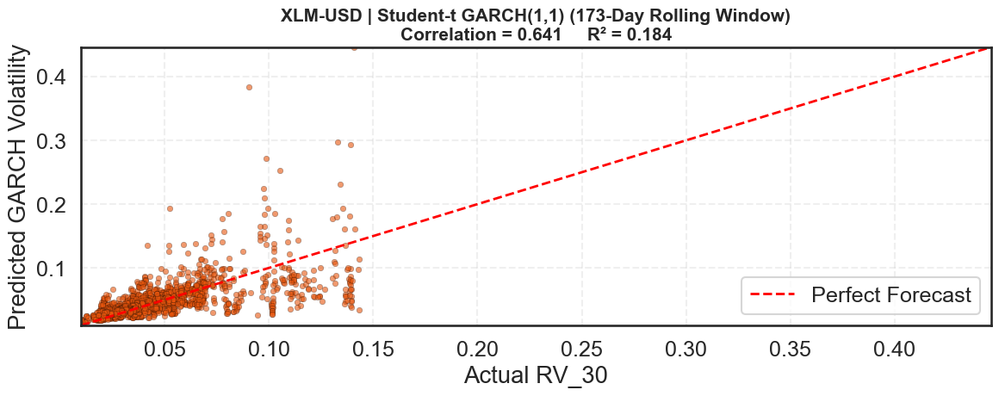

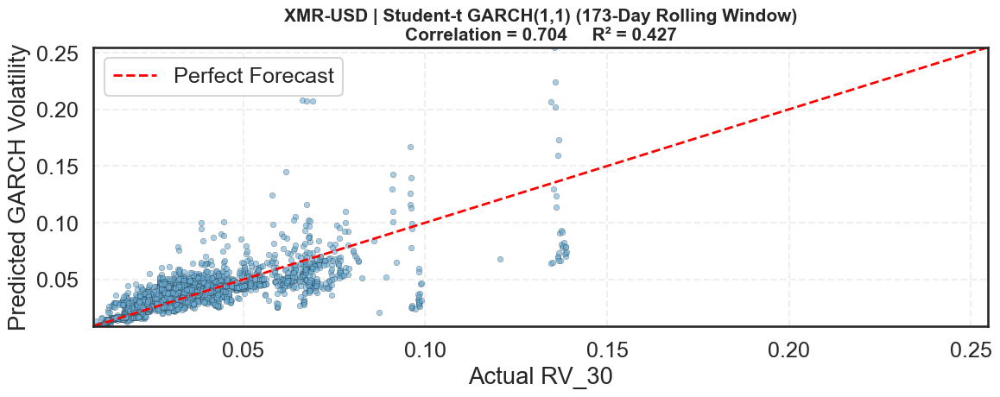

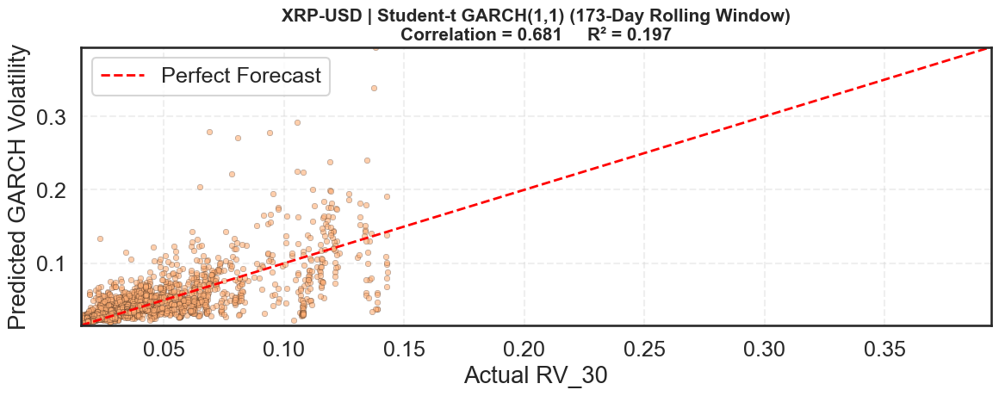

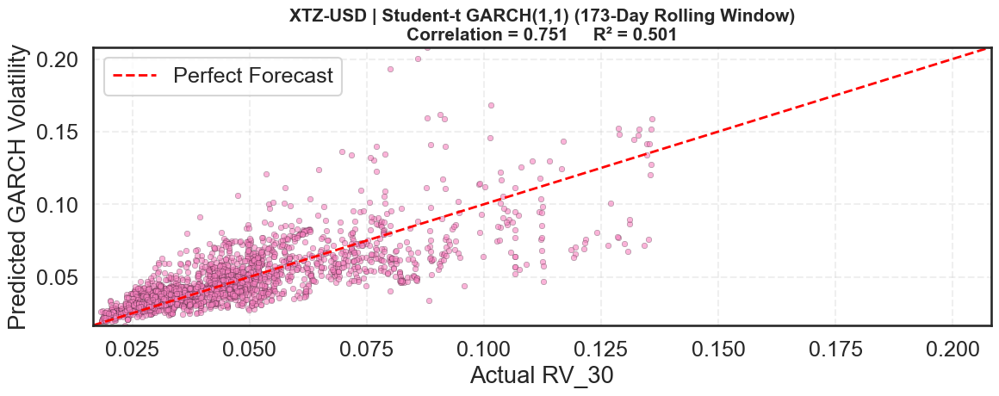

In [29]:
#====================================================
# SCATTER PLOT GARCH FORCAST VOLATILITY VS ACTUAL RV_30
#====================================================

sns.set_context(
    "talk",
    font_scale=1.1
)

# Loop Through Each Cryptocurrency
#====================================================

for ticker in sorted(garch_df["Ticker"].unique()):

    coin = (

        garch_df[
            garch_df["Ticker"] == ticker
        ]

        .dropna(
            subset=[
                "RV_30",
                "GARCH_Vol"
            ]
        )

        .copy()

    )

    plt.figure(
        figsize=(12,5)
    )

    # Scatter

    plt.scatter(

        coin["RV_30"],

        coin["GARCH_Vol"],

        color=colors[ticker],

        alpha=0.60,

        s=22,

        edgecolor="black",

        linewidth=0.25

    )

    # Perfect Forecast Line
    
    min_val = min(

        coin["RV_30"].min(),

        coin["GARCH_Vol"].min()

    )

    max_val = max(

        coin["RV_30"].max(),

        coin["GARCH_Vol"].max()

    )

    plt.plot(

        [min_val, max_val],

        [min_val, max_val],

        color="red",

        linestyle="--",

        linewidth=2,

        label="Perfect Forecast"

    )

    # Correlation and R_Squared
    #================================================

    corr = coin["RV_30"].corr(
        coin["GARCH_Vol"]
    )

    r2 = r2_score(

        coin["RV_30"],

        coin["GARCH_Vol"]

    )

    # Labels

    plt.title(

        f"{ticker} | "
        "Student-t GARCH(1,1) (173-Day Rolling Window)\n"
        f"Correlation = {corr:.3f}     R² = {r2:.3f}",

        fontsize=15,

        fontweight="bold"

    )

    plt.xlabel(
        "Actual RV_30"
    )

    plt.ylabel(
        "Predicted GARCH Volatility"
    )

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.legend()

    # Keep Same Scale
    #================================================

    plt.xlim(min_val, max_val)

    plt.ylim(min_val, max_val)


    plt.tight_layout()

    plt.show()

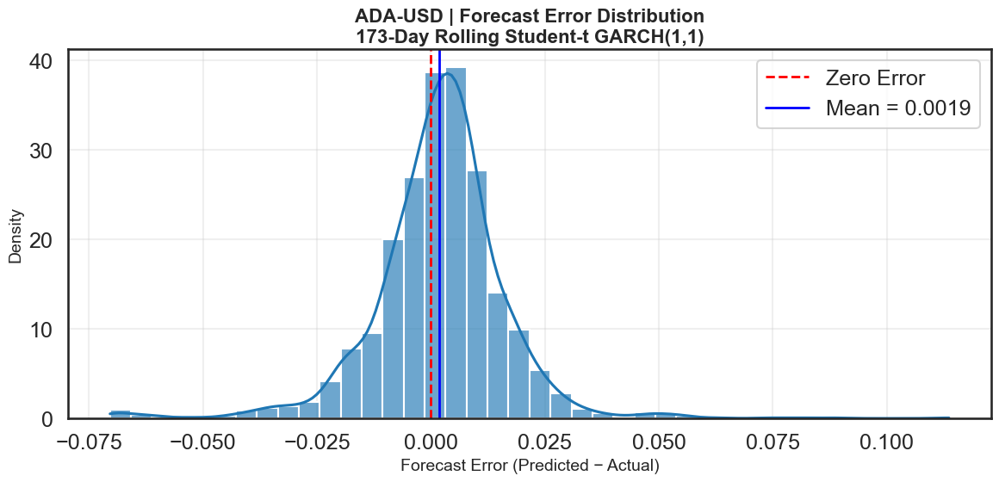

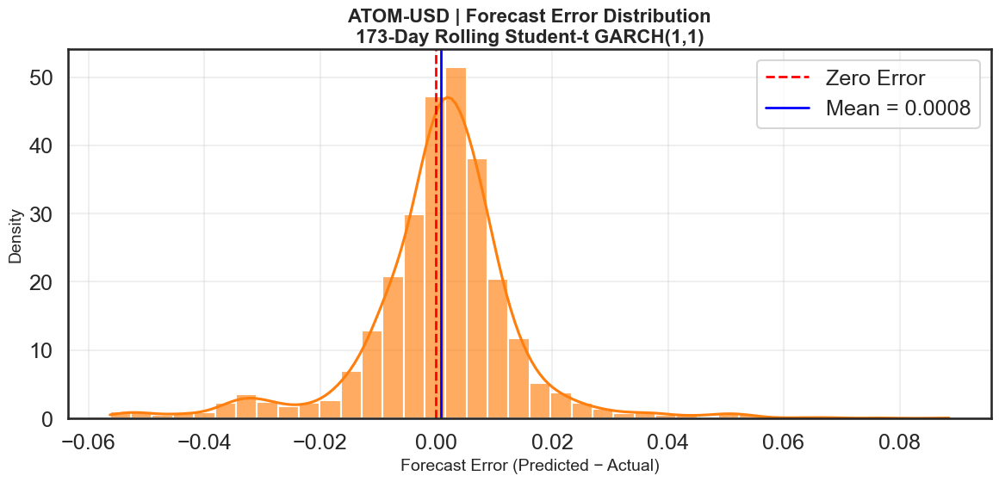

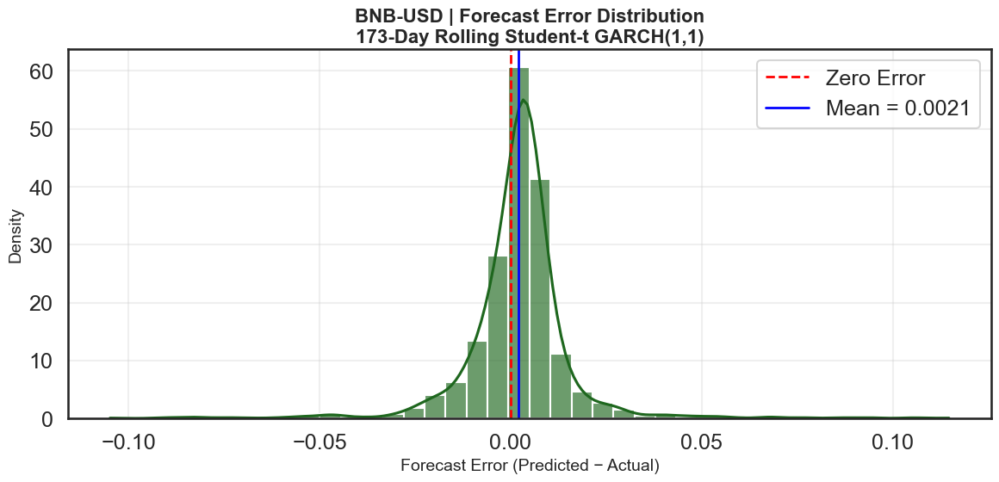

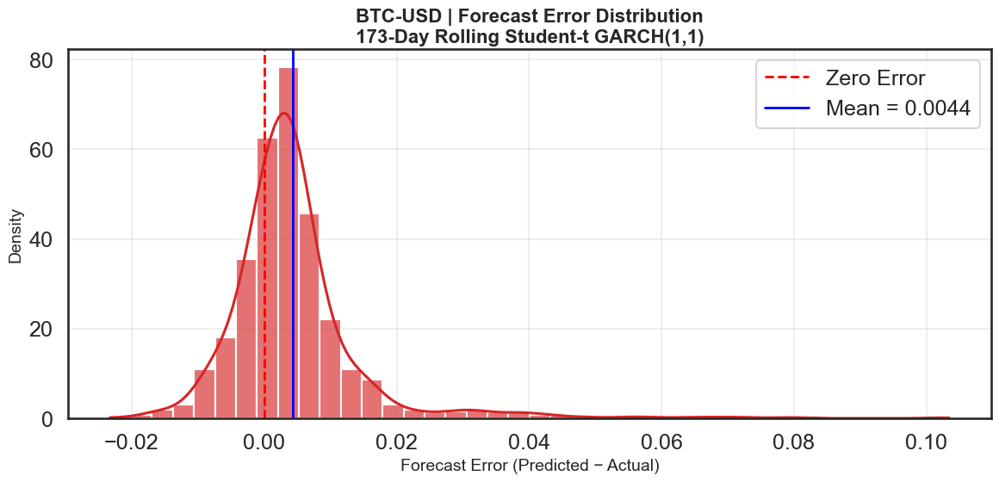

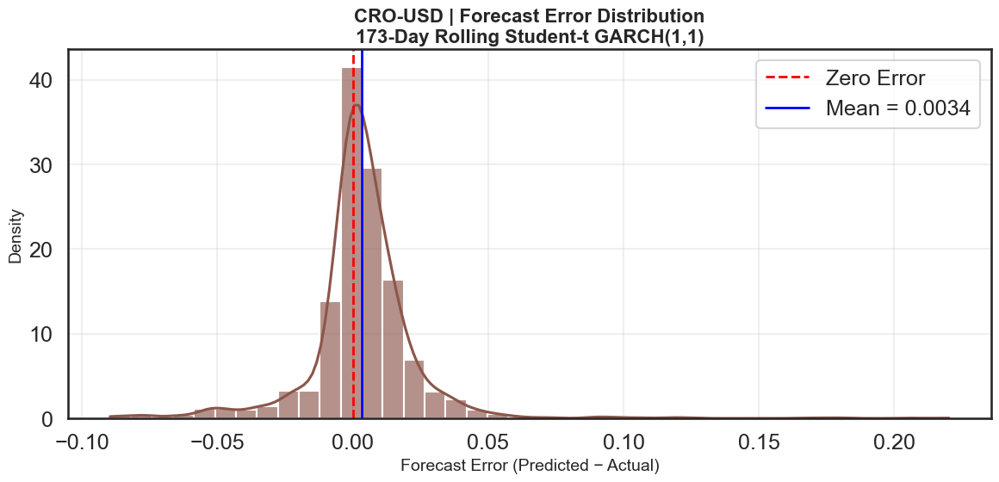

...

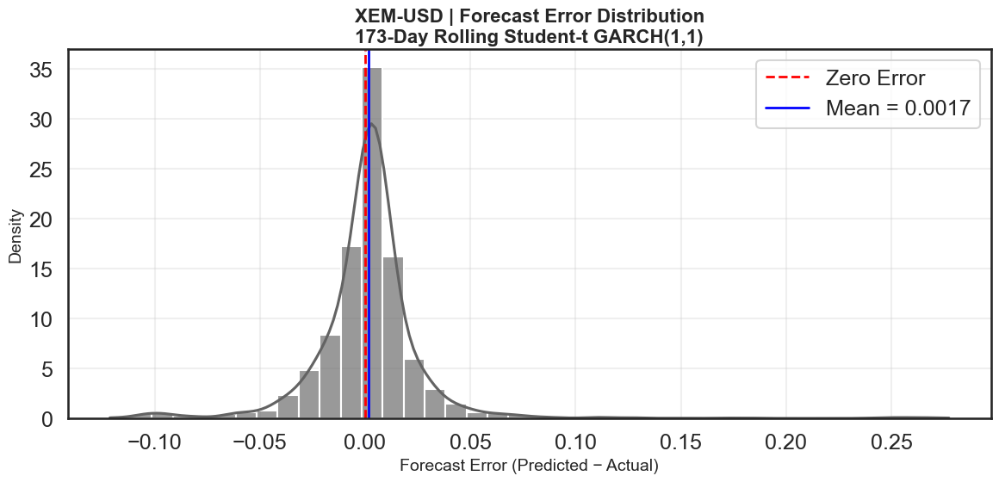

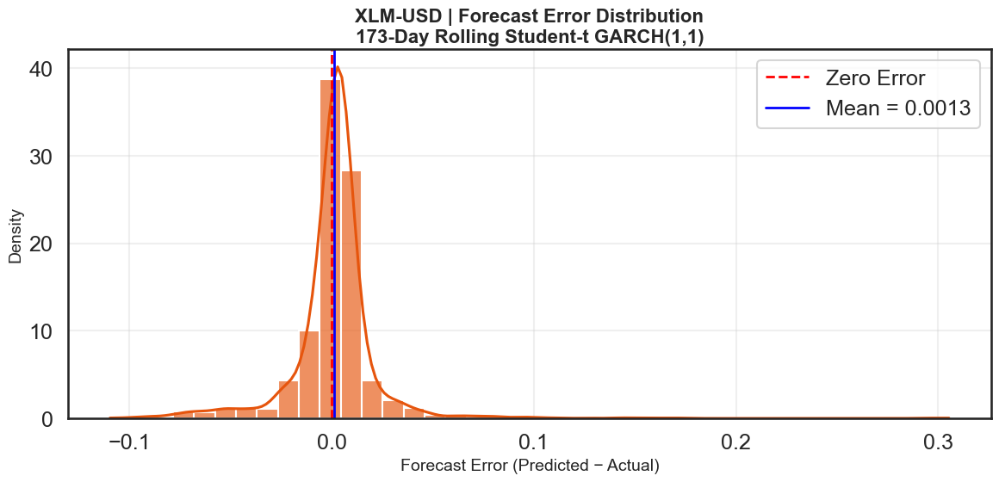

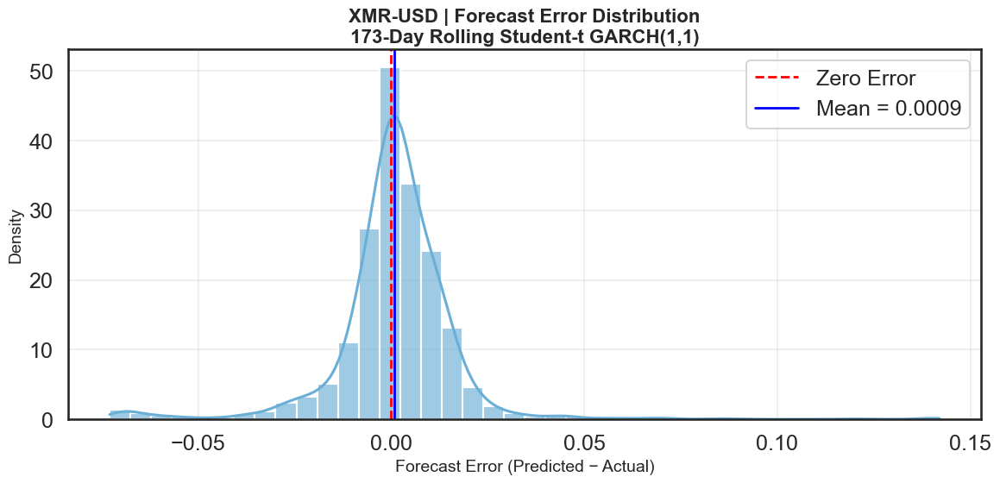

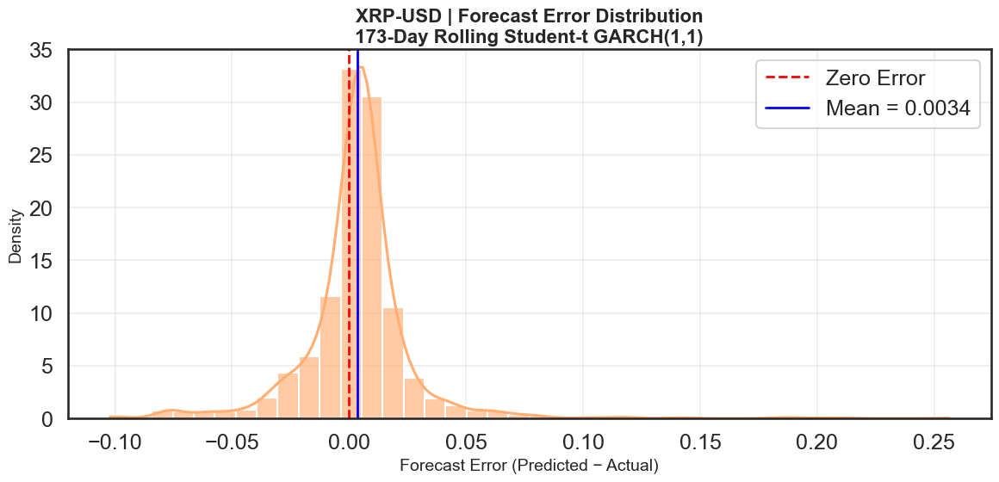

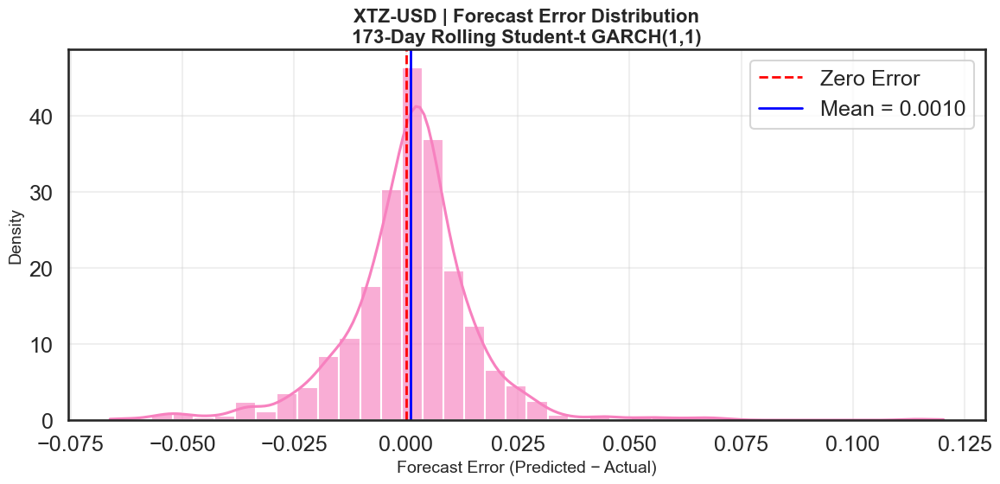

In [30]:
#====================================================
# VISUALIZE FORECAST ERROR DISTRIBUTION
# HISTOGRAM + KDE
#====================================================

sns.set_context(
    "talk",
    font_scale=1.1
)

# Loop Through Each Cryptocurrency
#====================================================

for ticker in sorted(garch_df["Ticker"].unique()):

    coin = (

        garch_df[
            garch_df["Ticker"] == ticker
        ]

        .dropna(
            subset=[
                "RV_30",
                "GARCH_Vol"
            ]
        )

        .copy()

    )

    # Calculate Forecast Error
    #================================================

    coin["Forecast_Error"] = (

        coin["GARCH_Vol"]

        -

        coin["RV_30"]

    )

    error_mean = coin["Forecast_Error"].mean()

    error_std = coin["Forecast_Error"].std()

    # Plot

    plt.figure(
        figsize=(12,6)
    )

    sns.histplot(

        coin["Forecast_Error"],

        bins=40,

        stat="density",

        kde=True,

        color=colors[ticker],

        alpha=0.65

    )

    #================================================
    # ZERO ERROR LINE
    #================================================

    plt.axvline(

        0,

        color="red",

        linestyle="--",

        linewidth=2,

        label="Zero Error"

    )

    # Mean Error

    plt.axvline(

        error_mean,

        color="blue",

        linestyle="-",

        linewidth=2,

        label=f"Mean = {error_mean:.4f}"

    )

    
    # Labels

    plt.title(

        f"{ticker} | "
        "Forecast Error Distribution\n"
        "173-Day Rolling Student-t GARCH(1,1)",

        fontsize=16,

        fontweight="bold"

    )

    plt.xlabel(

        "Forecast Error (Predicted − Actual)",
        fontsize=14

    )

    plt.ylabel(
        "Density",
        fontsize=14
    )

    plt.grid(
        alpha=0.3
    )

    plt.legend()

    plt.tight_layout()

    plt.show()

**4. Feature Engineering:**

4.1 Technical Indicators:

In [31]:
#====================================================
# TECHNICAL INDICATORS
#====================================================


# Sort Data
#====================================================
garch_df = (

    garch_df.sort_values(["Ticker","Date"])

    .reset_index(

        drop=True

    )

)


feature_frames = []

for ticker in sorted(garch_df["Ticker"].unique()):

    print(f"Processing {ticker}")

    coin = (

        garch_df[
            garch_df["Ticker"] == ticker
        ]

        .copy()

    )
    
    #================================================
    # RSI (14, 30, 200)
    #================================================

    coin["RSI(14)"] = RSIIndicator(
        close=coin["Close"],
        window=14
    ).rsi()

    coin["RSI(30)"] = RSIIndicator(
        close=coin["Close"],
        window=30
    ).rsi()

    coin["RSI(200)"] = RSIIndicator(
        close=coin["Close"],
        window=200
    ).rsi()

    
    #================================================
    # CCI (20)
    #================================================

    coin["CCI(20)"] = CCIIndicator(

        high=coin["High"],
        low=coin["Low"],
        close=coin["Close"],
        window=20

    ).cci()
    
    
    #================================================
    # MACD (6,20)
    #================================================

    macd = MACD(

    close=coin["Close"],

    window_fast=6,   #fast EMA

    window_slow=20,   #slow EMA

    window_sign=9   #signal EMA

    )

    coin["MACD_6_20"] = macd.macd()   #fast EMA - slow EMA

    coin["MACD_6_20_Signal"] = macd.macd_signal()   #signal EMA

    coin["MACD_6_20_Hist"] = macd.macd_diff()   #histogram (MACD - signal)
    
    
    
    
    #================================================
    # ATR (14)
    #================================================

    coin["ATR(14)"] = AverageTrueRange(

        high=coin["High"],
        low=coin["Low"],
        close=coin["Close"],
        window=14

    ).average_true_range()
    
    
    #================================================
    # OBV
    #================================================

    coin["OBV"] = OnBalanceVolumeIndicator(

        close=coin["Close"],
        volume=coin["Volume"]

    ).on_balance_volume()

    
    #================================================
    # TEMA (14, 30, 200)
    #================================================
    for period in [14,30,200]:

        ema1 = coin["Close"].ewm(

            span=period,

            adjust=False

        ).mean()
        

        ema2 = ema1.ewm(

            span=period,

            adjust=False

        ).mean()
        

        ema3 = ema2.ewm(

            span=period,

            adjust=False

        ).mean()
        

        coin[f"TEMA({period})"] = (

            3*ema1

            -3*ema2

            +ema3

        )
        
    #================================================
    # SLOW STOCHASTIC (5,3,3)
    #================================================

    stoch = StochasticOscillator(

    high=coin["High"],

    low=coin["Low"],

    close=coin["Close"],

    window=5,

    smooth_window=3

    )
    

    coin["SlowK_5_3_3"] = stoch.stoch().rolling(3).mean()   #smooth %K line

    coin["SlowD_5_3_3"] = (coin["SlowK_5_3_3"].rolling(3).mean())   #moving avg of SlowK line

    
    
    #================================================
    # PROC (14)
    #================================================

    coin["PROC(14)"] = (

        coin["Close"]

        .pct_change(14)

        * 100

    )

    #================================================
    # MOMENTUM (10, 30)
    #================================================

    coin["MOM(10)"] = (

        coin["Close"]

        - coin["Close"].shift(10)

    )

    coin["MOM(30)"] = (

        coin["Close"]

        - coin["Close"].shift(30)

    )

    feature_frames.append(coin)

Processing ADA-USD
Processing ATOM-USD
Processing BNB-USD
Processing BTC-USD
Processing CRO-USD
Processing DASH-USD
Processing DOGE-USD
Processing EOS-USD
Processing ETH-USD
Processing FIL-USD
Processing HT-USD
Processing LEO-USD
Processing LINK-USD
Processing LTC-USD
Processing NEO-USD
Processing SNX-USD
Processing THETA-USD
Processing TRX-USD
Processing VET-USD
Processing XEM-USD
Processing XLM-USD
Processing XMR-USD
Processing XRP-USD
Processing XTZ-USD


In [32]:
#====================================================
# MERGE ALL COINS
#====================================================

garch_df = pd.concat(

    feature_frames,

    ignore_index=True

)

print(garch_df.shape)

(58032, 33)


In [33]:
#====================================================
# TECHNICAL FEATURES
#====================================================

technical_features = [

    "RSI(14)",
    "RSI(30)",
    "RSI(200)",


    "CCI(20)",

    "MACD_6_20",
    "MACD_6_20_Signal",
    "MACD_6_20_Hist",

    "ATR(14)",

    "OBV",


    "TEMA(14)",
    "TEMA(30)",
    "TEMA(200)",

    "SlowK_5_3_3",
    "SlowD_5_3_3",

    "PROC(14)",

    "MOM(10)",
    "MOM(30)"

]

print(

    "Number of technical indicators:",

    len(technical_features)

)

print("="*30)

print(

    garch_df[
        technical_features
    ].describe()

)

Number of technical indicators: 17
            RSI(14)       RSI(30)      RSI(200)       CCI(20)     MACD_6_20  \
count  57720.000000  57336.000000  53256.000000  57576.000000  57576.000000   
mean      49.818638     49.806482     50.377752     -1.153789      7.113288   
std       12.317780      8.802578      3.956776    114.659495    429.536640   
min       10.317106     21.343454     42.451462   -576.170468  -8639.231321   
25%       41.179049     43.692342     47.553734    -83.899772     -0.084756   
50%       48.590951     48.722360     49.399771    -12.526243     -0.000844   
75%       57.312838     54.755804     52.224835     83.074065      0.057657   
max       97.689033     92.528941     83.237847    666.666667   8426.364163   

       MACD_6_20_Signal  MACD_6_20_Hist       ATR(14)           OBV  \
count      57384.000000    57384.000000  58032.000000  5.803200e+04   
mean           7.123515       -0.031717     87.952089  1.607122e+11   
std          392.382422      157.852606 

In [34]:
print(garch_df)

            Date     Close      High       Low      Open    Volume   Ticker  \
0     2020-01-02  0.032751  0.033507  0.032448  0.033474  20843934  ADA-USD   
1     2020-01-03  0.034180  0.034427  0.032491  0.032748  30162644  ADA-USD   
2     2020-01-04  0.034595  0.034685  0.033872  0.034191  29535781  ADA-USD   
3     2020-01-05  0.034721  0.035356  0.034545  0.034574  21479178  ADA-USD   
4     2020-01-06  0.037272  0.037299  0.034674  0.034751  37988444  ADA-USD   
...          ...       ...       ...       ...       ...       ...      ...   
58027 2026-08-11  0.194510  0.200569  0.193335  0.198460   4944779  XTZ-USD   
58028 2026-08-12  0.194279  0.197716  0.191834  0.194504   4918531  XTZ-USD   
58029 2026-08-13  0.196638  0.197525  0.193583  0.194243   4189952  XTZ-USD   
58030 2026-08-14  0.196234  0.197657  0.192020  0.196638   4312824  XTZ-USD   
58031 2026-08-15  0.197837  0.202577  0.195550  0.196241   4715471  XTZ-USD   

         Return  Log Return      RV_7  ...   ATR(14

4.2 Macro-economic Variables:

In [35]:
#====================================================
# MACRO TICKERS
#====================================================

macro_tickers = {

    "^GSPC":"SP500",

    "^DJI":"DowJones",

    "DX-Y.NYB":"USD_Index",

    "^VIX":"VIX"

}

In [36]:
#====================================================
# DOWNLOAD MACROECONOMIC VARIABLES
#====================================================

START_DATE = "2020-01-01"
END_DATE = "2026-08-16"


macro_frames = []

#====================================================
# DOWNLOAD EACH INDEX
#====================================================

for ticker, name in macro_tickers.items():

    print(f"Downloading {name}...")

    df = yf.download(

        ticker,

        start=START_DATE,

        end=END_DATE,

        progress=False,

        auto_adjust=False

    )
    
    if df.empty:

        print(f"{name} FAILED")

        continue

    df = df.reset_index()
    

    # Flatten MutiIndex if needed

    if isinstance(df.columns, pd.MultiIndex):

        df.columns = df.columns.get_level_values(0)


    df = df[["Date","Close"]]

    df = df.rename(

        columns={

            "Close":name

        }

    )

    macro_frames.append(df)
    
print(macro_frames)

[Price       Date        SP500
0     2020-01-02  3257.850098
1     2020-01-03  3234.850098
2     2020-01-06  3246.280029
3     2020-01-07  3237.179932
4     2020-01-08  3253.050049
...          ...          ...
1658  2026-08-10  7753.109863
1659  2026-08-11  7728.200195
1660  2026-08-12  7748.500000
1661  2026-08-13  7798.990234
1662  2026-08-14  7785.759766

[1663 rows x 2 columns], Price       Date      DowJones
0     2020-01-02  28868.800781
1     2020-01-03  28634.880859
2     2020-01-06  28703.380859
3     2020-01-07  28583.679688
4     2020-01-08  28745.089844
...          ...           ...
1658  2026-08-10  53975.980469
1659  2026-08-11  53791.851562
1660  2026-08-12  53770.269531
1661  2026-08-13  53839.988281
1662  2026-08-14  53732.410156

[1663 rows x 2 columns], Price       Date   USD_Index
0     2020-01-02   96.849998
1     2020-01-03   96.839996
2     2020-01-06   96.669998
3     2020-01-07   96.980003
4     2020-01-08   97.300003
...          ...         ...
1660  2026-0

In [37]:
#====================================================
# MERGE MACRO VARIABLES INTO SINGLE DATAFRAME
#====================================================

macro_df = macro_frames[0]

for df in macro_frames[1:]:

    macro_df = macro_df.merge(

        df,

        on="Date",

        how="outer"

    )

macro_df = (

    macro_df

    .sort_values("Date")

)

In [38]:
#====================================================
# MERGE MACRO VARIABLES INTO GARCH DATAFRAME
#====================================================

garch_df = garch_df.merge(
    macro_df,
    on="Date",
    how="left"
)

In [39]:
#====================================================
# FILL WEEKENDS
#====================================================

macro_columns = [

    "SP500",
    "DowJones",
    "USD_Index",
    "VIX"

]

garch_df = garch_df.sort_values("Date")

garch_df[macro_columns] = (

    garch_df[macro_columns]

    .ffill()

)

garch_df[macro_columns] = (

    garch_df[macro_columns]

    .bfill()

)

In [40]:
#====================================================
# CHECK MISSING VALUES IN MACRO VARIABLES
#====================================================

print("="*30)
print("MACRO VARIABLES")
print("="*30)

print(

    garch_df[
        macro_columns
    ]

    .isna()

    .sum()

)

MACRO VARIABLES
SP500        0
DowJones     0
USD_Index    0
VIX          0
dtype: int64


In [41]:
#====================================================
# CALCULATE MACRO RETURNS, MOVING AVERAGES, AND VOLATILITY
#====================================================

macro_columns = [

    "SP500",

    "DowJones",

    "USD_Index",

    "VIX"

]

for col in macro_columns:

    garch_df[f"{col}_Return"] = (

        garch_df

        .groupby("Ticker")[col]

        .pct_change()

    )


    garch_df[f"{col}_MA30"] = (

        garch_df

        .groupby("Ticker")[col]

        .transform(

            lambda x: x.rolling(30).mean()

        )

    )

    garch_df[f"{col}_Volatility30"] = (

        garch_df

        .groupby("Ticker")[f"{col}_Return"]

        .transform(

            lambda x: x.rolling(30).std()

        )

    )

In [42]:
#====================================================
# FILL WEEKENDS
#====================================================

macro_df = (

    macro_df

    .set_index("Date")

    .asfreq("D")

)

macro_df = (

    macro_df

    .ffill()

    .reset_index()

)

In [43]:
#====================================================
# CHECK FEATURES
#====================================================

macro_features = [

    "SP500",

    "DowJones",

    "USD_Index",

    "VIX",

    "SP500_Return",

    "DowJones_Return",

    "USD_Index_Return",

    "VIX_Return",

    "SP500_MA30",

    "DowJones_MA30",

    "USD_Index_MA30",

    "VIX_MA30",

    "SP500_Volatility30",

    "DowJones_Volatility30",

    "USD_Index_Volatility30",

    "VIX_Volatility30"

]

print(

    garch_df[

        macro_features

    ].describe()

)

print()

print(

    "Number of macro features:",

    len(macro_features)

)

              SP500      DowJones     USD_Index           VIX  SP500_Return  \
count  58032.000000  58032.000000  58032.000000  58032.000000  58008.000000   
mean    4826.052317  36789.961747    100.041989     20.682696      0.000417   
std     1234.600245   7051.501308      5.231844      7.527434      0.010637   
min     2237.399902  18591.929688     89.440002     11.860000     -0.119841   
25%     3948.719971  32656.699219     96.650002     15.930000     -0.001823   
50%     4463.120117  34837.710938     99.959999     18.709999      0.000000   
75%     5776.649902  42175.109375    104.070000     23.530001      0.003799   
max     7798.990234  54349.121094    114.110001     82.690002      0.095154   

       DowJones_Return  USD_Index_Return    VIX_Return    SP500_MA30  \
count     58008.000000      58008.000000  58008.000000  57336.000000   
mean          0.000310          0.000018      0.002293   4818.330122   
std           0.010258          0.003638      0.069826   1212.838895   


In [44]:
print(garch_df)

            Date     Close      High       Low      Open     Volume  \
0     2020-01-02  0.032751  0.033507  0.032448  0.033474   20843934   
38688 2020-01-02  0.085025  0.090543  0.083753  0.086999    1669286   
45942 2020-01-02  0.031912  0.033163  0.031370  0.032690    5253256   
36270 2020-01-02  1.119915  1.225753  1.105411  1.225655     131145   
33852 2020-01-02  8.493940  8.853414  8.442027  8.847202  327241775   
...          ...       ...       ...       ...       ...        ...   
45941 2026-08-15  0.004491  0.004544  0.004483  0.004483    4904905   
48359 2026-08-15  0.000486  0.000501  0.000453  0.000484     187885   
50777 2026-08-15  0.157878  0.159494  0.157587  0.157889   53284084   
26597 2026-08-15  0.103084  0.111693  0.099084  0.100034      15218   
58031 2026-08-15  0.197837  0.202577  0.195550  0.196241    4715471   

          Ticker    Return  Log Return      RV_7  ...  SP500_Volatility30  \
0        ADA-USD -0.021131   -0.021357       NaN  ...                 

4.3 Market Regime Features:

In [45]:
#====================================================
# 4.3 MARKET REGIME FEATURES
#====================================================

import requests

In [46]:
# Download Fear and Greed Index Data using API
#====================================================

url = "https://api.alternative.me/fng/?limit=0"

response = requests.get(url)

fear_json = response.json()

fear_df = pd.DataFrame(

    fear_json["data"]

)

fear_df["Date"] = pd.to_datetime(

    fear_df["timestamp"].astype(int),

    unit="s"

)

fear_df["Fear_Greed_Index"] = (

    fear_df["value"]

    .astype(float)

)

fear_df = fear_df[

    [

        "Date",

        "Fear_Greed_Index"

    ]

]

fear_df = fear_df.sort_values("Date")

In [47]:
# Sample Period
#====================================================

fear_df = fear_df[

    (

        fear_df["Date"] >= "2021-01-01"

    )

    &

    (

        fear_df["Date"] <= "2026-08-16"

    )

]

In [48]:
# Bitcoin Market Regime
#====================================================

btc = (

    garch_df

    [

        garch_df["Ticker"]=="BTC-USD"

    ]

    [

        [

            "Date",

            "Close"

        ]

    ]

    .copy()

)

btc = btc.sort_values("Date")

# Calculate 200-Day Moving Average
btc["MA200"] = (

    btc["Close"]

    .rolling(

        200,

        min_periods=200

    )

    .mean()

)

In [49]:
# Create Regime
#====================================================

btc["Bull_Regime"] = (

    btc["Close"]

    >

    btc["MA200"]

).astype(int)

btc["Bear_Regime"] = (

    btc["Close"]

    <=

    btc["MA200"]

).astype(int)



btc = btc[

    [

        "Date",

        "Bull_Regime",

        "Bear_Regime"

    ]

]

In [50]:
#====================================================
# MERGE MARKET REGIME
#====================================================

garch_df = garch_df.merge(

    fear_df,

    on="Date",

    how="left"

)

garch_df = garch_df.merge(

    btc,

    on="Date",

    how="left"

)

In [51]:
#====================================================
# FILL MISSING VALUES
#====================================================

market_columns = [

    "Fear_Greed_Index",

    "Bull_Regime",

    "Bear_Regime"

]

garch_df[market_columns] = (

    garch_df

    .groupby("Ticker")[market_columns]

    .ffill()

    .bfill()

)

In [52]:
#====================================================
# CHECK MARKET FEATURES
#====================================================

print(

    garch_df[

        [

            "Date",

            "Ticker",

            "Fear_Greed_Index",

            "Bull_Regime",

            "Bear_Regime"

        ]

    ].head(20)

)

print()

print(

    garch_df[

        market_columns

    ].describe()

)

         Date     Ticker  Fear_Greed_Index  Bull_Regime  Bear_Regime
0  2020-01-02    ADA-USD              94.0            0            0
1  2020-01-02  THETA-USD              94.0            0            0
2  2020-01-02    XEM-USD              94.0            0            0
3  2020-01-02    SNX-USD              94.0            0            0
4  2020-01-02    NEO-USD              94.0            0            0
5  2020-01-02    LTC-USD              94.0            0            0
6  2020-01-02    XLM-USD              94.0            0            0
7  2020-01-02   LINK-USD              94.0            0            0
8  2020-01-02    LEO-USD              94.0            0            0
9  2020-01-02    XMR-USD              94.0            0            0
10 2020-01-02    FIL-USD              94.0            0            0
11 2020-01-02    ETH-USD              94.0            0            0
12 2020-01-02    EOS-USD              94.0            0            0
13 2020-01-02    XRP-USD          

4.4 Lagged Features:

In [53]:
#====================================================
# LAGGED FEATURES
#====================================================

lags = [

    1,

    4,

    7
]

In [54]:
#====================================================
# VARIABLES TO LAG
#====================================================

lag_variables = [

    #----------------------------------------
    # Price Information
    #----------------------------------------

    "Return",

    "Log Return",

    "Volume",

    #----------------------------------------
    # Volatility
    #----------------------------------------

    "RV_30",

    "GARCH_Vol",

    #----------------------------------------
    # Technical Indicators
    #----------------------------------------
    
    #ROC and Momentum measure similar concepts, EMA/SMA/TEMA are highly correlated.
    #Too many correlated features can lead to multicollinearity.
    
    
    "RSI(14)",   
    
    "MACD_6_20",

    "ATR(14)",
    
    "TEMA(14)",
    
    "MOM(10)",

    #----------------------------------------
    # Macro Variables
    #----------------------------------------

    "SP500_Return",

    "DowJones_Return",

    "USD_Index_Return",

    "VIX_Return",

    #----------------------------------------
    # Market Sentiment
    #----------------------------------------

    "Fear_Greed_Index",
    
    "Bull_Regime",
    
    "Bear_Regime"

]

In [55]:
#====================================================
# CREATE LAGGED FEATURES
#====================================================

for feature in lag_variables:

    print(f"Creating lags for {feature}")

    for lag in lags:

        garch_df[

            f"{feature}_Lag{lag}"

        ] = (

            garch_df

            .groupby("Ticker")[feature]

            .shift(lag)

        )

Creating lags for Return
Creating lags for Log Return
Creating lags for Volume
Creating lags for RV_30
Creating lags for GARCH_Vol
Creating lags for RSI(14)
Creating lags for MACD_6_20
Creating lags for ATR(14)
Creating lags for TEMA(14)
Creating lags for MOM(10)
Creating lags for SP500_Return
Creating lags for DowJones_Return
Creating lags for USD_Index_Return
Creating lags for VIX_Return
Creating lags for Fear_Greed_Index
Creating lags for Bull_Regime
Creating lags for Bear_Regime


In [56]:
#====================================================
# CHECK MISSING VALUES
#====================================================

lag_features = [

    col

    for col in garch_df.columns

    if "_Lag" in col

]

print(

    garch_df[

        lag_features

    ]

    .isna()

    .sum()

)

Return_Lag1                24
Return_Lag4                96
Return_Lag7               168
Log Return_Lag1            24
Log Return_Lag4            96
Log Return_Lag7           168
Volume_Lag1                24
Volume_Lag4                96
Volume_Lag7               168
RV_30_Lag1                720
RV_30_Lag4                792
RV_30_Lag7                864
GARCH_Vol_Lag1           5016
GARCH_Vol_Lag4           5016
GARCH_Vol_Lag7           5016
RSI(14)_Lag1              336
RSI(14)_Lag4              408
RSI(14)_Lag7              480
MACD_6_20_Lag1            480
MACD_6_20_Lag4            552
MACD_6_20_Lag7            624
ATR(14)_Lag1               24
ATR(14)_Lag4               96
ATR(14)_Lag7              168
TEMA(14)_Lag1              24
TEMA(14)_Lag4              96
TEMA(14)_Lag7             168
MOM(10)_Lag1              264
MOM(10)_Lag4              336
MOM(10)_Lag7              408
SP500_Return_Lag1          48
SP500_Return_Lag4         120
SP500_Return_Lag7         192
DowJones_R

In [57]:
#====================================================
# CHECK RESULTS
#====================================================

print(

    garch_df[

        [

            "Ticker",

            "Date",

            "RV_30",

            "RV_30_Lag1",

            "RV_30_Lag7",

            "GARCH_Vol",

            "GARCH_Vol_Lag7",

            "RSI(14)",

            "RSI(14)_Lag7"

        ]

    ].head(20)

)

       Ticker       Date  RV_30  RV_30_Lag1  RV_30_Lag7  GARCH_Vol  \
0     ADA-USD 2020-01-02    NaN         NaN         NaN        NaN   
1   THETA-USD 2020-01-02    NaN         NaN         NaN        NaN   
2     XEM-USD 2020-01-02    NaN         NaN         NaN        NaN   
3     SNX-USD 2020-01-02    NaN         NaN         NaN        NaN   
4     NEO-USD 2020-01-02    NaN         NaN         NaN        NaN   
5     LTC-USD 2020-01-02    NaN         NaN         NaN        NaN   
6     XLM-USD 2020-01-02    NaN         NaN         NaN        NaN   
7    LINK-USD 2020-01-02    NaN         NaN         NaN        NaN   
8     LEO-USD 2020-01-02    NaN         NaN         NaN        NaN   
9     XMR-USD 2020-01-02    NaN         NaN         NaN        NaN   
10    FIL-USD 2020-01-02    NaN         NaN         NaN        NaN   
11    ETH-USD 2020-01-02    NaN         NaN         NaN        NaN   
12    EOS-USD 2020-01-02    NaN         NaN         NaN        NaN   
13    XRP-USD 2020-0

In [58]:
#====================================================
# SUMMARY
#====================================================


print("="*30)
print("LAGGED FEATURES SUMMARY")
print("="*30)

print(

    "Number of lagged variables:",

    len(lag_variables)

)

print(

    "Lag periods:",

    lags

)

print(

    "Total lag features:",

    len(lag_features)

)



LAGGED FEATURES SUMMARY
Number of lagged variables: 17
Lag periods: [1, 4, 7]
Total lag features: 51


4.5 Calendar Features:

In [59]:
#====================================================
# CALENDAR FEATURES
#====================================================

garch_df["Date"] = pd.to_datetime(garch_df["Date"])

garch_df["Year"] = garch_df["Date"].dt.year

garch_df["Quarter"] = garch_df["Date"].dt.quarter

garch_df["Month"] = garch_df["Date"].dt.month

garch_df["Week"] = (

    garch_df["Date"]

    .dt.isocalendar()

    .week

    .astype(int)

)

garch_df["Day"] = garch_df["Date"].dt.day

garch_df["DayOfWeek"] = garch_df["Date"].dt.dayofweek

garch_df["DayOfYear"] = garch_df["Date"].dt.dayofyear

In [60]:
#====================================================
# WEEKEND
#====================================================

garch_df["Weekend"] = (

    garch_df["DayOfWeek"]

    >= 5

).astype(int)

In [61]:
#====================================================
# MONTH / QUARTER END
#====================================================

garch_df["MonthEnd"] = (

    garch_df["Date"]

    .dt.is_month_end

).astype(int)

garch_df["QuarterEnd"] = (

    garch_df["Date"]

    .dt.is_quarter_end

).astype(int)

In [62]:
#====================================================
# MONTH / QUARTER START
#====================================================

garch_df["MonthStart"] = (

    garch_df["Date"]

    .dt.is_month_start

).astype(int)

garch_df["QuarterStart"] = (

    garch_df["Date"]

    .dt.is_quarter_start

).astype(int)

In [63]:
#====================================================
# CYCLICAL ENCODING
#====================================================
'''
Cyclical encoding is a technique used to represent cyclical features, 
such as time of day, day of the week, or month of the year, 
in a way that captures their cyclical nature. 
Instead of using a linear representation (e.g., 1-12 for months), 
we use sine and cosine transformations to map these features onto a 
circular space. This allows machine learning models to better understand 
the relationships between cyclical values.
'''


# Month

garch_df["Month_sin"] = np.sin(

    2*np.pi*

    garch_df["Month"]/12

)

garch_df["Month_cos"] = np.cos(

    2*np.pi*

    garch_df["Month"]/12

)

# Day of week

garch_df["DayOfWeek_sin"] = np.sin(

    2*np.pi*

    garch_df["DayOfWeek"]/7

)

garch_df["DayOfWeek_cos"] = np.cos(

    2*np.pi*

    garch_df["DayOfWeek"]/7

)

# Day of year

garch_df["DayOfYear_sin"] = np.sin(

    2*np.pi*

    garch_df["DayOfYear"]/365

)

garch_df["DayOfYear_cos"] = np.cos(

    2*np.pi*

    garch_df["DayOfYear"]/365

)

In [64]:
#====================================================
# CALENDAR FEATURES
#====================================================

calendar_features = [

    "Year",

    "Quarter",

    "Month",

    "Week",

    "Day",

    "DayOfWeek",

    "DayOfYear",

    "Weekend",

    "MonthStart",

    "MonthEnd",

    "QuarterStart",

    "QuarterEnd",

    "Month_sin",

    "Month_cos",

    "DayOfWeek_sin",

    "DayOfWeek_cos",

    "DayOfYear_sin",

    "DayOfYear_cos"

]

print(

    garch_df[

        calendar_features

    ].describe()

)

print()

print(

    "Number of calendar features:",

    len(calendar_features)

)

               Year       Quarter         Month          Week           Day  \
count  58032.000000  58032.000000  58032.000000  58032.000000  58032.000000   
mean    2022.829198      2.442928      6.313896     25.698098     15.684450   
std        1.919450      1.106914      3.412212     14.876314      8.795429   
min     2020.000000      1.000000      1.000000      1.000000      1.000000   
25%     2021.000000      1.000000      3.000000     13.000000      8.000000   
50%     2023.000000      2.000000      6.000000     25.000000     16.000000   
75%     2024.000000      3.000000      9.000000     38.000000     23.000000   
max     2026.000000      4.000000     12.000000     53.000000     31.000000   

          DayOfWeek     DayOfYear       Weekend    MonthStart      MonthEnd  \
count  58032.000000  58032.000000  58032.000000  58032.000000  58032.000000   
mean       3.001241    176.748966      0.285773      0.032672      0.032672   
std        1.999293    104.308920      0.451786    

In [65]:
print(garch_df)

            Date     Close      High       Low      Open     Volume  \
0     2020-01-02  0.032751  0.033507  0.032448  0.033474   20843934   
1     2020-01-02  0.085025  0.090543  0.083753  0.086999    1669286   
2     2020-01-02  0.031912  0.033163  0.031370  0.032690    5253256   
3     2020-01-02  1.119915  1.225753  1.105411  1.225655     131145   
4     2020-01-02  8.493940  8.853414  8.442027  8.847202  327241775   
...          ...       ...       ...       ...       ...        ...   
58027 2026-08-15  0.004491  0.004544  0.004483  0.004483    4904905   
58028 2026-08-15  0.000486  0.000501  0.000453  0.000484     187885   
58029 2026-08-15  0.157878  0.159494  0.157587  0.157889   53284084   
58030 2026-08-15  0.103084  0.111693  0.099084  0.100034      15218   
58031 2026-08-15  0.197837  0.202577  0.195550  0.196241    4715471   

          Ticker    Return  Log Return      RV_7  ...  MonthEnd  QuarterEnd  \
0        ADA-USD -0.021131   -0.021357       NaN  ...         0     

Coin and Market-specific Events

In [66]:
#====================================================
# CALENDAR FEATURES (2021)
#====================================================

garch_df["Date"] = pd.to_datetime(
    garch_df["Date"]
)

event_columns_2021 = [

    # Global Events
    #================================================

    "BTC_40K",
    "Tesla_Event",
    "NFT_DeFi_Boom",
    "BTC_61K",
    "Coinbase_IPO",
    "China_Ban",
    "NFT_Summer",
    "Poly_Hack",
    "El_Salvador",
    "First_BTC_ETF",
    "BTC_67K",
    "Meta_Rebrand",
    "BTC_69K",
    "Omicron_Covid",
    "Fed_Tapering",
    "Layer1_Boom",
    "Turkey_Libra",
    "India_Ban",

    # Coin Events
    #================================================

    "ETH_Payment",
    "THETA_Peak",
    "XRP_1_96",
    "BNB_690",
    "LINK_Peak",
    "ATOM_Osmosis",
    "ETH_EIP1559",
    "ADA_Peak",
    "ADA_Alonzo",
    "LTC_Walmart",
    "ATOM_Peak",
    "HT_Ban_China",
    "MoneyGram_USDC",
    "Staples_Rename",
    "BNB_BEP95",
    "EOS_Governance",
    "ETH_Layer2",
    "BNB_Regulatory_Scrutiny"

]

for col in event_columns_2021:

    garch_df[col] = 0


# Global Events
#====================================================

# BTC_40K
# 7 January 2021

garch_df.loc[
    garch_df["Date"] >= "2021-01-07",
    "BTC_40K"
] = 1

# Tesla buys Bitcoin
# 8 February 2021

garch_df.loc[
    garch_df["Date"] >= "2021-02-08",
    "Tesla_Event"
] = 1


# NFT & DeFi Boom
# 11 March 2021

garch_df.loc[
    garch_df["Date"] >= "2021-03-11",
    "NFT_DeFi_Boom"
] = 1

# BTC reached 61K
# 13 March 2021

garch_df.loc[
    garch_df["Date"] >= "2021-03-13",
    "BTC_61K"
] = 1

# Coinbase IPO
# 14 April 2021

garch_df.loc[
    garch_df["Date"] >= "2021-04-14",
    "Coinbase_IPO"
] = 1


# China Mining Ban
# 18 May 2021

garch_df.loc[
    garch_df["Date"] >= "2021-05-18",
    "China_Ban"
] = 1


# NFT Summer
# July-August 2021

garch_df.loc[
    (
        (garch_df["Date"] >= "2021-07-01")
        &
        (garch_df["Date"] <= "2021-08-31")
    ),
    "NFT_Summer"
] = 1

# Poly Network Hack
# 10 August 2021

garch_df.loc[
    garch_df["Date"] >= "2021-08-10",
    "Poly_Hack"
] = 1

# El Salvador adopts Bitcoin
# 7 September 2021

garch_df.loc[
    garch_df["Date"] >= "2021-09-07",
    "El_Salvador"
] = 1

# First US Bitcoin Futures ETF
# 19 October 2021

garch_df.loc[
    garch_df["Date"] >= "2021-10-19",
    "First_BTC_ETF"
] = 1

# BTC hit approximately $67,000
# 20 October 2021

garch_df.loc[
    garch_df["Date"] >= "2021-10-20",
    "BTC_67K"
] = 1

# Meta Rebrand
# 28 October 2021

garch_df.loc[
    garch_df["Date"] >= "2021-10-28",
    "Meta_Rebrand"
] = 1

# BTC hit approximately $69,000
# 10 November 2021

garch_df.loc[
    garch_df["Date"] >= "2021-11-10",
    "BTC_69K"
] = 1

# Omicron COVID Variant
# 24 November 2021

garch_df.loc[
    garch_df["Date"] >= "2021-11-24",
    "Omicron_Covid"
] = 1

# FED Tapering Announcement
# November-December 2021

garch_df.loc[
    (
        (garch_df["Date"] >= "2021-11-01")
        &
        (garch_df["Date"] <= "2021-12-31")
    ),
    "Fed_Tapering"
] = 1

# Layer-1 Ecosystem Expansion
# December 2021

garch_df.loc[
    garch_df["Date"] >= "2021-12-01",
    "Layer1_Boom"
] = 1

# Turkey Libra Crisis
# December 2021

garch_df.loc[
    garch_df["Date"] >= "2021-12-01",
    "Turkey_Libra"
] = 1

# India Cryptocurrency Ban
# December 2021

garch_df.loc[
    garch_df["Date"] >= "2021-12-01",
    "India_Ban"
] = 1

#====================================================
# COIN-SPECIFIC EVENTS
#====================================================

# Ethereum payment adoption
# AWS, Visa and other institutions
# 2 March 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2021-03-02")
    ),
    "ETH_Payment"
] = 1

# XRP peaked at $1.96
# 14 April 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "XRP-USD")
        &
        (garch_df["Date"] >= "2021-04-14")
    ),
    "XRP_1_96"
] = 1

# Theta peaked at $15.90
# 16 April 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "THETA-USD")
        &
        (garch_df["Date"] >= "2021-04-16")
    ),
    "THETA_Peak"
] = 1

# BNB peaked at $690
# 10 May 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "BNB-USD")
        &
        (garch_df["Date"] >= "2021-05-10")
    ),
    "BNB_690"
] = 1

# LINK peaked at $52.88
# 10 May 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "LINK-USD")
        &
        (garch_df["Date"] >= "2021-05-10")
    ),
    "LINK_Peak"
] = 1

# ATOM launched Osmosis DEX
# 19 June 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ATOM-USD")
        &
        (garch_df["Date"] >= "2021-06-19")
    ),
    "ATOM_Osmosis"
] = 1

# Ethereum EIP-1559
# 4 August 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2021-08-04")
    ),
    "ETH_EIP1559"
] = 1

# ADA peaked at $3.09
# 2 September 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ADA-USD")
        &
        (garch_df["Date"] >= "2021-09-02")
    ),
    "ADA_Peak"
] = 1

# Cardano Alonzo
# 12 September 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ADA-USD")
        &
        (garch_df["Date"] >= "2021-09-12")
    ),
    "ADA_Alonzo"
] = 1

# LTC Fake Walmart Partnership
# 13 September 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "LTC-USD")
        &
        (garch_df["Date"] >= "2021-09-13")
    ),
    "LTC_Walmart"
] = 1

# ATOM peaked at $44.70
# 19 September 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ATOM-USD")
        &
        (garch_df["Date"] >= "2021-09-19")
    ),
    "ATOM_Peak"
] = 1

# HT banned users in China
# 27 September 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "HT-USD")
        &
        (garch_df["Date"] >= "2021-09-27")
    ),
    "HT_Ban_China"
] = 1

# MoneyGram partners with USDC
# 6 October 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "XLM-USD")
        &
        (garch_df["Date"] >= "2021-10-06")
    ),
    "MoneyGram_USDC"
] = 1

# Staples Center renamed to Crypto.com
# 17 November 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "CRO-USD")
        &
        (garch_df["Date"] >= "2021-11-17")
    ),
    "Staples_Rename"
] = 1

# BNB BEP-95
# 30 November 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "BNB-USD")
        &
        (garch_df["Date"] >= "2021-11-30")
    ),
    "BNB_BEP95"
] = 1

# EOS faced governance issues 
# 8 December 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "EOS-USD")
        &
        (garch_df["Date"] >= "2021-12-08")
    ),
    "EOS_Governance"
] = 1

# Ethereum Layer-2 Expansion
# Optimism & Arbitrum
# December 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2021-12-01")
    ),
    "ETH_Layer2"
] = 1

# BNB faced regulatory scrutiny
# UK FCA, Japan, Thailand, and Cayman Islands
# Throughout 2021

garch_df.loc[
    (
        (garch_df["Ticker"] == "BNB-USD")
        &
        (garch_df["Date"] >= "2021-01-01")
    ),
    "BNB_Regulatory_Scrutiny"
] = 1


#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2021 EVENT FEATURES")
print("="*30)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ]
        + event_columns_2021
    ].head(20)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2021.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2021.csv")

2021 EVENT FEATURES
         Date     Ticker  BTC_40K  Tesla_Event  NFT_DeFi_Boom  BTC_61K  \
0  2020-01-02    ADA-USD        0            0              0        0   
1  2020-01-02  THETA-USD        0            0              0        0   
2  2020-01-02    XEM-USD        0            0              0        0   
3  2020-01-02    SNX-USD        0            0              0        0   
4  2020-01-02    NEO-USD        0            0              0        0   
5  2020-01-02    LTC-USD        0            0              0        0   
6  2020-01-02    XLM-USD        0            0              0        0   
7  2020-01-02   LINK-USD        0            0              0        0   
8  2020-01-02    LEO-USD        0            0              0        0   
9  2020-01-02    XMR-USD        0            0              0        0   
10 2020-01-02    FIL-USD        0            0              0        0   
11 2020-01-02    ETH-USD        0            0              0        0   
12 2020-01-02    E

In [67]:
#====================================================
# CALENDAR FEATURES (2022)
#====================================================

event_columns_2022 = [

    # Global Events
    "Wormhole_Hack",
    "Ronin_Hack",
    "LUNA_Surge",
    "UST_Depeg",
    "LUNA_Collapse",
    "LUNA_2",
    "Celsius_3AC_Crisis",
    "Tornado_Cash",
    "BNB_Bridge_Hack",
    "FTX_Collapse",
    "FTX_Founder_Arrested",

    # Coin-specific Events

    "TRX_USDD",
    "ETH_Merge",
    "ADA_Vasil",
    "ATOM_2",
    "HT_Justin_Sun",
    "DOGE_Twitter",
    "BNB_Recovery_Fund",
    "LINK_Staking"

]

for col in event_columns_2022:

    garch_df[col] = 0


#====================================================
# GLOBAL EVENTS
#====================================================

# Wormhole Hack
# 2 February 2022

garch_df.loc[
    garch_df["Date"] >= "2022-02-02",
    "Wormhole_Hack"
] = 1

# Ronin Hack
# 23 March 2022

garch_df.loc[
    garch_df["Date"] >= "2022-03-23",
    "Ronin_Hack"
] = 1

# LUNA surge to over $90
# 19 Aril 2022

garch_df.loc[
    garch_df["Date"] >= "2022-04-19",
    "LUNA_Surge"
] = 1

# LUNA UST Depeg
# 7 May 2022

garch_df.loc[
    garch_df["Date"] >= "2022-05-07",
    "UST_Depeg"
] = 1

# Terra-LUNA Collapse
# 12 May 2022

garch_df.loc[
    garch_df["Date"] >= "2022-05-12",
    "LUNA_Collapse"
] = 1

# LUNA 2 Launch
# 27 May 2022

garch_df.loc[
    garch_df["Date"] >= "2022-05-27",
    "LUNA_2"
] = 1

# Celsius & Three Arrows Capital Crisis
# 27 June - 14 July 2022

garch_df.loc[
    (
        (garch_df["Date"] >= "2022-06-27")
        &
        (garch_df["Date"] <= "2022-07-14")
    ),
    "Celsius_3AC_Crisis"
] = 1


# Tornado Cash Sanction
# 8 August 2022

garch_df.loc[
    garch_df["Date"] >= "2022-08-08",
    "Tornado_Cash"
] = 1

# BNB Bridge Hack
# 4 October 2022

garch_df.loc[
    garch_df["Date"] >= "2022-10-04",
    "BNB_Bridge_Hack"
] = 1

# FTX Collapse
# 2 - 28 November 2022

garch_df.loc[
    (
        (garch_df["Date"] >= "2022-11-02")
        &
        (garch_df["Date"] <= "2022-11-28")
    ),
    "FTX_Collapse"
] = 1


# FTX Founder was arrested
# 12 December 2022

garch_df.loc[
    garch_df["Date"] >= "2022-12-12",
    "FTX_Founder_Arrested"
] = 1



#====================================================
# COIN-SPECIFIC EVENTS
#====================================================

# TRON USDD Stablecoin
# 5 May 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "TRX-USD")
        &
        (garch_df["Date"] >= "2022-05-05")
    ),
    "TRX_USDD"
] = 1



# Ethereum Merge
# 15 September 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2022-09-15")
    ),
    "ETH_Merge"
] = 1


# Cardano Vasil Hard Fork
# 22 September 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "ADA-USD")
        &
        (garch_df["Date"] >= "2022-09-22")
    ),
    "ADA_Vasil"
] = 1


# Cosmos ATOM 2.0
# 26 September 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "ATOM-USD")
        &
        (garch_df["Date"] >= "2022-09-26")
    ),
    "ATOM_2"
] = 1



# Justin Sun became adviser for Huobi Global
# 13 - 20 October 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "HT-USD")
        &
        (garch_df["Date"] >= "2022-10-13")
        &
        (garch_df["Date"] <= "2022-10-20")
    ),
    "HT_Justin_Sun"
] = 1


# Elon Musk acquires Twitter
# 27 October 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "DOGE-USD")
        &
        (garch_df["Date"] >= "2022-10-27")
    ),
    "DOGE_Twitter"
] = 1


# Binance Industry Recovery Fund
# 24 November 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "BNB-USD")
        &
        (garch_df["Date"] >= "2022-11-24")
    ),
    "BNB_Recovery_Fund"
] = 1


# Chainlink Staking v0.1
# 6 December 2022

garch_df.loc[
    (
        (garch_df["Ticker"] == "LINK-USD")
        &
        (garch_df["Date"] >= "2022-12-06")
    ),
    "LINK_Staking"
] = 1


#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2022 EVENT FEATURES")
print("="*30)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ]
        + event_columns_2022
    ].head(30)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2022.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2022.csv")

2022 EVENT FEATURES
         Date     Ticker  Wormhole_Hack  Ronin_Hack  LUNA_Surge  UST_Depeg  \
0  2020-01-02    ADA-USD              0           0           0          0   
1  2020-01-02  THETA-USD              0           0           0          0   
2  2020-01-02    XEM-USD              0           0           0          0   
3  2020-01-02    SNX-USD              0           0           0          0   
4  2020-01-02    NEO-USD              0           0           0          0   
5  2020-01-02    LTC-USD              0           0           0          0   
6  2020-01-02    XLM-USD              0           0           0          0   
7  2020-01-02   LINK-USD              0           0           0          0   
8  2020-01-02    LEO-USD              0           0           0          0   
9  2020-01-02    XMR-USD              0           0           0          0   
10 2020-01-02    FIL-USD              0           0           0          0   
11 2020-01-02    ETH-USD              0     

In [68]:
#====================================================
# CALENDAR FEATURES (2023)
#====================================================

event_columns_2023 = [

    # Global Events

    "Silvergate_Collapse",
    "SVB_Collapse",
    "Signature_Bank_Closure",
    "CZ_Coinbase_SEC",
    "US_Spot_BTC_ETF",
    "Ripple_Ruling",
    "Grayscale_Wins",
    "SBF_Trial",
    "CEL_Restructuring",
    "Binance_DOJ_Settlement",
    "BTC_ETFs_Expectation",

    # Coin-specific Events

    "Ve_World_Wallet",
    "FVM_Eco",
    "XTZ_Mumbai",
    "ETH_Shapella",
    "EOS_EVM",
    "LINK_CCIP",
    "X_DOGE",
    "LTC_Halving",
    "HT_Rebrand",
    "BlackRock_ETH_ETF",

]

for col in event_columns_2023:

    garch_df[col] = 0


#====================================================
# GLOBAL EVENTS
#====================================================

# Silvergate Bank Collapse
# 8 March 2023

garch_df.loc[
    garch_df["Date"] >= "2023-03-08",
    "Silvergate_Collapse"
] = 1

# Silicon Valley Bank Collapse
# 10 March 2023

garch_df.loc[
    garch_df["Date"] >= "2023-03-10",
    "SVB_Collapse"
] = 1

# Signature Bank Collapse
# 12 March 2023

garch_df.loc[
    garch_df["Date"] >= "2023-03-12",
    "Signature_Bank_Closure"
] = 1

# SEC Crackdown
# Coinbase & Binance lawsuits
# 5 June 2023

garch_df.loc[
    garch_df["Date"] >= "2023-06-05",
    "CZ_Coinbase_SEC"
] = 1

# US Spot BTC ETF Application
# BlackRock, Fidelity, Wisdom Tree, VanEck
# Mid - late June 2023

garch_df.loc[
    (
        (garch_df["Date"] >= "2023-06-15")
        &
        (garch_df["Date"] <= "2023-06-30")
    ),
    "US_Spot_BTC_ETF"
] = 1

# Ripple was not identified as a security
# 13 July 2023

garch_df.loc[
    garch_df["Date"] >= "2023-07-13",
    "Ripple_Ruling"
] = 1

# Grayscale won
# 29 August 2023

garch_df.loc[
    garch_df["Date"] >= "2023-08-29",
    "Grayscale_Wins"
] = 1

# Sam Bankman - Fried trial
# 3 October - 2 November 2023

garch_df.loc[
    (
        (garch_df["Date"] >= "2023-10-03")
        &
        (garch_df["Date"] <= "2023-11-02")
    ),
    "SBF_Trial"
] = 1

# CEL Restructuring into mining enterprise
# 13 November 2023

garch_df.loc[
    garch_df["Date"] >= "2023-11-13",
    "CEL_Restructuring"
] = 1

# CZ Resigns from Binance
# 21 November 2023

garch_df.loc[
    garch_df["Date"] >= "2023-11-21",
    "Binance_DOJ_Settlement"
] = 1

# Expectations of potential BTC ETF approval
# Throughout 2023

garch_df.loc[
    (
    (garch_df["Date"] >= "2023-01-01")
    &
    (garch_df["Date"] <= "2023-12-31")
    ),
    "BTC_ETFs_Expectation"
] = 1


#====================================================
# COIN-SPECIFIC EVENTS
#====================================================

# VeChain VeWorld Wallet
# 20 February 2023

garch_df.loc[
    (
    (garch_df["Ticker"] == "VET-USD")
    &
    (garch_df["Date"] >= "2023-02-20")
    ),
    "Ve_World_Wallet"
] = 1


# Filecoin Virtual Machine
# 14 March 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "FIL-USD")
        &
        (garch_df["Date"] >= "2023-03-14")
    ),
    "FVM_Eco"
] = 1


# Tezos Upgrade
# 29 March 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "XTZ-USD")
        &
        (garch_df["Date"] >= "2023-03-29")
    ),
    "XTZ_Mumbai"
] = 1


# Ethereum Shanghai Upgrade
# 12 April 2023


garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2023-04-12")
    ),
    "ETH_Shapella"
] = 1


# EOS EVM Launch
# 14 April 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "EOS-USD")
        &
        (garch_df["Date"] >= "2023-04-14")
    ),
    "EOS_EVM"
] = 1

# Chainlink CCIP Launch
# 17 July 2023


garch_df.loc[
    (
        (garch_df["Ticker"] == "LINK-USD")
        &
        (garch_df["Date"] >= "2023-07-17")
    ),
    "LINK_CCIP"
] = 1

# Twitter becomes X and renewed speculation over DOGE
# 24 July 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "DOGE-USD") 
        &
        (garch_df["Date"] >= "2023-07-24")
    ),
    "X_DOGE"
] = 1

# Litecoin Halving
# 2 August 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "LTC-USD")
        &
        (garch_df["Date"] >= "2023-08-02")
    ),
    "LTC_Halving"
] = 1

# Huobi rebrands to HTX
# 13 September 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "HT-USD")
        &
        (garch_df["Date"] >= "2023-09-13")
    ),
    "HT_Rebrand"
] = 1

# BlackRock filed a spot ETH ETF
# 16 November 2023

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2023-11-16")
    ),
    "BlackRock_ETH_ETF"
] = 1

#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2023 EVENT FEATURES")
print("="*0)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ]
        + event_columns_2023
    ].head(30)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2023.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2023.csv")

2023 EVENT FEATURES

         Date     Ticker  Silvergate_Collapse  SVB_Collapse  \
0  2020-01-02    ADA-USD                    0             0   
1  2020-01-02  THETA-USD                    0             0   
2  2020-01-02    XEM-USD                    0             0   
3  2020-01-02    SNX-USD                    0             0   
4  2020-01-02    NEO-USD                    0             0   
5  2020-01-02    LTC-USD                    0             0   
6  2020-01-02    XLM-USD                    0             0   
7  2020-01-02   LINK-USD                    0             0   
8  2020-01-02    LEO-USD                    0             0   
9  2020-01-02    XMR-USD                    0             0   
10 2020-01-02    FIL-USD                    0             0   
11 2020-01-02    ETH-USD                    0             0   
12 2020-01-02    EOS-USD                    0             0   
13 2020-01-02    XRP-USD                    0             0   
14 2020-01-02   DOGE-USD          

In [69]:
#====================================================
# CALENDAR FEATURES (2024)
#====================================================

event_columns_2024 = [

    # Global Events

    "BTC_Spot_ETF",
    "BTC_73K",
    "SBF_Sentencing",
    "BTC_Halving",
    "CZ_Sentencing",
    "ETH_ETF_Approval",
    "DMM_BTC_Hack",
    "Rate_Cut_Expectation",
    "MiCA_EU",
    "Mt_Gox_Repayment",
    "WazirX_Hack",
    "Ripple_Penalty",
    "Trump_Election_Win",
    "DOGE_Department_Announced",
    "BTC_100K",
    "Institutional_Adoption",

    # Coin-specific Events

    "SNX_Andromeda",
    "XTZ_Oxford_2",
    "ETH_Dencun",
    "XLM_Soroban",
    "VET_VeBetterDAO",
    "THETA_EdgeCloud_AI",
    "XTZ_Paris",
    "ADA_Chang_1",
    "XMR_Kraken",
    "DOGE_Musk",
    "Quarterly_BNB_AutoBurn",
    "FIL_Expansion",
    "LINK_DeFi_Expansion"

]

for col in event_columns_2024:

    garch_df[col] = 0


#====================================================
# GLOBAL EVENTS
#====================================================

# Spot Bitcoin ETF Approval
# 10 January 2024

garch_df.loc[
    garch_df["Date"] >= "2024-01-10",
    "BTC_Spot_ETF"
] = 1


# Bitcoin reaches new ATH
# 1 -15  March 2024

garch_df.loc[
    (
        (garch_df["Date"] >= "2024-03-01")
        &
        (garch_df["Date"] <= "2024-03-15")
    ),
    "BTC_73K"
] = 1

# Sam Bankman-Fried Sentencing
# 28 March 2024

garch_df.loc[
    garch_df["Date"] >= "2024-03-28",
    "SBF_Sentencing"
] = 1

# Bitcoin Halving
# 19 April 2024

garch_df.loc[
    garch_df["Date"] >= "2024-04-19",
    "BTC_Halving"
] = 1

# CZ Sentencing
# 30 April 2024

garch_df.loc[
    garch_df["Date"] >= "2024-04-30",
    "CZ_Sentencing"
] = 1

# SEC approves 19b-4 filings for Spot ETH ETFs
# 23 May 2024

garch_df.loc[
    garch_df["Date"] >= "2024-05-23",
    "ETH_ETF_Approval"
] = 1

# DMM BTC Hack
# 31 May 2024

garch_df.loc[
    garch_df["Date"] >= "2024-05-31",
    "DMM_BTC_Hack"
] = 1

# Fed expected rate cuts
# June - August 2024

garch_df.loc[
    (
        (garch_df["Date"] >= "2024-06-01")
        &
        (garch_df["Date"] <= "2024-08-31")
    ),
    "Rate_Cut_Expectation"
] = 1


# MiCA regulation
# 30 June - 30 December 2024

garch_df.loc[
    (
        (garch_df["Date"] >= "2024-06-30")
        &
        (garch_df["Date"] <= "2024-12-30")
    ),
    "MiCA_EU"
] = 1


# Mt. Gox repayment
# 5 July 2024

garch_df.loc[
    garch_df["Date"] >= "2024-07-05",
    "Mt_Gox_Repayment"
] = 1

# WazirX Hack
# 18 July 2024

garch_df.loc[
    garch_df["Date"] >= "2024-07-18",
    "WazirX_Hack"
] = 1

# Ripple penalty
# 8 August 2024

garch_df.loc[
    garch_df["Date"] >= "2024-08-08",
    "Ripple_Penalty"
] = 1

# Trump Election Victory
# 5 November 2024

garch_df.loc[
    garch_df["Date"] >= "2024-11-05",
    "Trump_Election_Win"
] = 1


# DOGE - Department of Defense Announcement
# 12 November 2024

garch_df.loc[
    garch_df["Date"] >= "2024-11-12",
    "DOGE_Department_Announced"
] = 1

# BTC 100K
# 5 December 2024

garch_df.loc[
    garch_df["Date"] >= "2024-12-05",
    "BTC_100K"
] = 1

# Institutional Adoption
# Throughout 2024

garch_df.loc[
    (
        (garch_df["Date"] >= "2024-01-01")
        &
        (garch_df["Date"] <= "2024-12-31")
    ),
    "Institutional_Adoption"
] = 1


#====================================================
# COIN-SPECIFIC EVENTS
#====================================================

# SNX Andromeda Upgrade
# January 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "SNX-USD")
        &
        (garch_df["Date"] >= "2024-01-01")
    ),
    "SNX_Andromeda"
] = 1

# XTZ Oxford 2 Upgrade
# 9 February 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "XTZ-USD")
        &
        (garch_df["Date"] >= "2024-02-09")
    ),
    "XTZ_Oxford_2"
] = 1

# ETH Dencun Upgrade
# 13 March 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "ETH-USD")
        &
        (garch_df["Date"] >= "2024-03-13")
    ),
    "ETH_Dencun"
] = 1

# Stellar Soroban
# 19 March 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "XLM-USD")
        &
        (garch_df["Date"] >= "2024-03-19")
    ),
    "XLM_Soroban"
] = 1

# VET VeBetterDAO
# 23 April 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "VET-USD")
        &
        (garch_df["Date"] >= "2024-04-23")
    ),
    "VET_VeBetterDAO"
] = 1


# Theta EdgeCloud
# 1 May 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "THETA-USD")
        &
        (garch_df["Date"] >= "2024-05-01")
    ),
    "THETA_EdgeCloud_AI"
] = 1


# Tezos Paris Upgrade
# 20 June 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "XTZ-USD")
        &
        (garch_df["Date"] >= "2024-06-20")
    ),
    "XTZ_Paris"
] = 1


# Cardano Chang Hard Fork
# 1 September 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "ADA-USD")
        &
        (garch_df["Date"] >= "2024-09-01")
    ),
    "ADA_Chang_1"
] = 1

# Kraken halted XMR trading
# 31 October 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "XMR-USD")
        &
        (garch_df["Date"] >= "2024-10-31")
    ),
    "XMR_Kraken"
] = 1

# DOGE rallied according to Musk's incoming role in DOGE department
# 5-22 November 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "DOGE-USD")
        &
        (garch_df["Date"] >= "2024-11-05")
    ),
    "DOGE_Musk"
] = 1

# BNB Auto Burn
# Throughout 2024

garch_df.loc[
    (
    (garch_df["Ticker"] == "BNB-USD")
    &
    (garch_df["Date"] >= "2024-01-01")
    ),
    "Quarterly_BNB_AutoBurn"
] = 1


# Filecoin Expansion
# Throughout 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "FIL-USD")
        &
        (garch_df["Date"] >= "2024-01-01")
    ),
    "FIL_Expansion"
] = 1


# Chainlink CCIP Expansion
# Throughout 2024

garch_df.loc[
    (
        (garch_df["Ticker"] == "LINK-USD")
        &
        (garch_df["Date"] >= "2024-01-01")
    ),
    "LINK_DeFi_Expansion"
] = 1


#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2024 EVENT FEATURES")
print("="*30)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ] + event_columns_2024
    ].head(30)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2024.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2024.csv")

2024 EVENT FEATURES
         Date     Ticker  BTC_Spot_ETF  BTC_73K  SBF_Sentencing  BTC_Halving  \
0  2020-01-02    ADA-USD             0        0               0            0   
1  2020-01-02  THETA-USD             0        0               0            0   
2  2020-01-02    XEM-USD             0        0               0            0   
3  2020-01-02    SNX-USD             0        0               0            0   
4  2020-01-02    NEO-USD             0        0               0            0   
5  2020-01-02    LTC-USD             0        0               0            0   
6  2020-01-02    XLM-USD             0        0               0            0   
7  2020-01-02   LINK-USD             0        0               0            0   
8  2020-01-02    LEO-USD             0        0               0            0   
9  2020-01-02    XMR-USD             0        0               0            0   
10 2020-01-02    FIL-USD             0        0               0            0   
11 2020-01-02    ETH

In [70]:
#====================================================
# CALENDAR FEATURES (2025)
#====================================================

event_columns_2025 = [

    # Global Events

    "TRUMP_Memecoin",
    "MELANIA_Memecoin",
    "Trump_Inauguration",
    "Trump_CBDC_Ban",
    "Musk_DOGE_Department",
    "Bybit_Hack",
    "Crypto_Reserve_Announcement",
    "US_China_20_Import",
    "Strategic_BTC_Reserve",
    "Crypto_Summit",
    "WLFI_USD1",
    "US_China_54_Goods",
    "US_China_145_Goods",
    "TRUMP_Dinner_Contest",
    "US_China_Geneva",
    "Private_Dinner_With_Trump",
    "CLARITY_Act",
    "TRUMP_Interest_Conflict",
    "Musk_Criticise_Trump",
    "Musk_Trump_Arguement",
    "US_China_Agreement",
    "BTC_123K",
    "GENIUS_Act",
    "SEC_Drop_Ripple_Case",
    "BTC_126K",
    "US_China_100_Tariff",
    "CZ_Pardon",
    "First_LTC_ETF",
    "Digital_Commodity_CFTC_Act",
    "Ukrain_Russia_Trump",
    

    # Coin-specific Events

    "ETH_Pectra",
    "XLM_PayPal",
    "TRX_Nasdaq_Listing",
    "VET_Franklin_Templeton",
    "XMR_Qubic_Attack",
    "ETH_Peak",
    "CRO_Trump_Media",
    "DOGE_ETF",
    "Market_Stress",
    "ETH_Fusaka",
    "ADA_Fall"

]

for col in event_columns_2025:

    garch_df[col] = 0


#====================================================
# GLOBAL EVENTS
#====================================================

# TRUMP Memecoin Launch
# 17 January 2025

garch_df.loc[
    garch_df["Date"] >= "2025-01-17",
    "TRUMP_Memecoin"
] = 1

# MELANIA Memecoin
# 19 January 2025


garch_df.loc[
    garch_df["Date"] >= "2025-01-19",
    "MELANIA_Memecoin"
] = 1

# Trump Inauguration
# 20 January 2025

garch_df.loc[
    garch_df["Date"] >= "2025-01-20",
    "Trump_Inauguration"
] = 1


# Executive Order 14178 - CBDC Ban
# 23 January 2025

garch_df.loc[
    garch_df["Date"] >= "2025-01-23",
    "Trump_CBDC_Ban"
] = 1


# Department of Government Efficiency
# January - May 2025

garch_df.loc[
    (
        (garch_df["Date"] >= "2025-01-01")
        &
        (garch_df["Date"] >= "2025-05-31")
    ),
    "Musk_DOGE_Department"
] = 1

# Bybit Hack
# 23 February 2025

garch_df.loc[
    garch_df["Date"] >= "2025-02-23",
    "Bybit_Hack"
] = 1


# Trump Crypto Reserve Proposal
# 2 March 2025

garch_df.loc[
    garch_df["Date"] >= "2025-03-02",
    "Crypto_Reserve_Announcement"
] = 1


# US-China Tariff Escalation (20%)
# 3 March 2025

garch_df.loc[
    garch_df["Date"] >= "2025-03-03",
    "US_China_20_Import"
] = 1


# Strategic Bitcoin Reserve
# 6 March 2025

garch_df.loc[
    garch_df["Date"] >= "2025-03-06",
    "Strategic_BTC_Reserve"
] = 1

# Crypto Summit
# 7 March 2025

garch_df.loc[
    garch_df["Date"] >= "2025-03-07",
    "Crypto_Summit"
] = 1

# World Liberty Financial
# 25 March 2025
garch_df.loc[
    garch_df["Date"] >= "2025-03-25",
    "WLFI_USD1"
] = 1


# Liberation Day Tariffs
# 2 April 2025

garch_df.loc[
    garch_df["Date"] >= "2025-04-02",
    "US_China_54_Goods"
] = 1

# US  145% tariff on Chinese goods
# 4 April 2025

garch_df.loc[
    garch_df["Date"] >= "2025-04-04",
    "US_China_145_Goods"
] = 1

# TRUMP Dinner
# 24 April 2025

garch_df.loc[
    garch_df["Date"] >= "2025-04-24",
    "TRUMP_Dinner_Contest"
] = 1


# Geneva Trade Truce
# 12 May 2025

garch_df.loc[
    garch_df["Date"] >= "2025-05-12",
    "US_China_Geneva"
] = 1

# Private dinner with Trump
# 22 May 2025

garch_df.loc[
    garch_df["Date"] >= "2025-05-22",
    "Private_Dinner_With_Trump"
] = 1

# Introduce CLARITY Act
# 29 May 2025

garch_df.loc[
    garch_df["Date"] >= "2025-05-29",
    "CLARITY_Act"
] = 1


# Interest Conflict (TRUMP, WLFI)
# May - June 2025

garch_df.loc[
    (
        (garch_df["Date"] >= "2025-05-01")
        &
        (garch_df["Date"] >= "2025-06-30")
    ),
    "TRUMP_Interest_Conflict"
] = 1

# Musk criticised Trump's "One Big Beautiful Bill"
# 3 June 2025

garch_df.loc[
    garch_df["Date"] >= "2025-06-03",
    "Musk_Criticise_Trump"
] = 1

# Trump-Musk Feud
# 5 June

garch_df.loc[
    garch_df["Date"] >= "2025-06-05",
    "Musk_Trump_Arguement"
] = 1


# US-China Framework Agreement
# 11 June 2025

garch_df.loc[
    garch_df["Date"] >= "2025-06-11",
    "US_China_Agreement"
] = 1

# BTC hit $123K
# 14 July 2025

garch_df.loc[
    garch_df["Date"] >= "2025-07-14",
    "BTC_123K"
] = 1


# GENIUS Act
# 18 July 2025

garch_df.loc[
    garch_df["Date"] >= "2025-07-18",
    "GENIUS_Act"
] = 1

# SEC dropped Ripple case
# 7 August 2025

garch_df.loc[
    garch_df["Date"] >= "2025-08-07",
    "SEC_Drop_Ripple_Case"
] = 1

# BTC hit $125,689
# 5 October 2025

garch_df.loc[
    garch_df["Date"] >= "2025-10-05",
    "BTC_126K"
] = 1


# Trump announces 100% China tariffs
# 12 October 2025

garch_df.loc[
    garch_df["Date"] >= "2025-10-12",
    "US_China_100_Tariff"
] = 1

# Trump pardoned CZ
# 23 October 2025

garch_df.loc[
    garch_df["Date"] >= "2025-10-23",
    "CZ_Pardon"
] = 1

# First US Spot LTC ETF
# 27 October 2025

garch_df.loc[
    garch_df["Date"] >= "2025-10-27",
    "First_LTC_ETF"
] = 1

# Digital Commodity CFTC Act
# 10 November 2025

garch_df.loc[
    garch_df["Date"] >= "2025-11-10",
    "Digital_Commodity_CFTC_Act"
] = 1


# Trump Russia-Ukraine Negotiation
# Throughout 2025

garch_df.loc[
    (
        (garch_df["Date"] >= "2025-01-01")
        &
        (garch_df["Date"] <= "2025-12-31")
    ),
    "Ukrain_Russia_Trump"
] = 1


#====================================================
# COIN SPECIFIC EVENTS
#====================================================

# ETH Pectra Upgrade
# 7 May 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="ETH-USD")
        &
        (garch_df["Date"]>="2025-05-07")
    ),
    "ETH_Pectra"
] = 1


# PayPal launched PYUSD on XLM
# 11 June 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="XLM-USD")
        &
        (garch_df["Date"]>="2025-06-11")
    ),
    "XLM_PayPal"
] = 1


# SMR Entertainment - TRON listed on Nasdaq
# 24 July 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="TRX-USD")
        &
        (garch_df["Date"]>="2025-07-24")
    ),
    "TRX_Nasdaq_Listing"
] = 1


# Franklin Templeton added VeChain
# 24 July 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="VET-USD")
        &
        (garch_df["Date"]>="2025-07-24")
    ),
    "VET_Franklin_Templeton"
] = 1


# XMR Qubic 51% Hack
# 11 August

garch_df.loc[
    (
        (garch_df["Ticker"]=="XMR-USD")
        &
        (garch_df["Date"]>="2025-08-11")
    ),
    "XMR_Qubic_Attack"
] = 1


# ETH peaked at $4946
# 25 August 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="ETH-USD")
        &
        (garch_df["Date"]>="2025-08-25")
    ),
    "ETH_Peak"
] = 1

# Trump Media collapsed with Crypto.com
# 26 August 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="CRO-USD")
        &
        (garch_df["Date"]>="2025-08-26")
    ),
    "CRO_Trump_Media"
] = 1

# DOGE ETF Launch
# 18 September 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="DOGE-USD")
        &
        (garch_df["Date"]>="2025-09-18")
    ),
    "DOGE_ETF"
] = 1

# Market stress caused ETH and BTC sharp decline
# 4 November 2025


garch_df.loc[
    (
        (garch_df["Ticker"]=="BTC-USD")
        &
        (garch_df["Date"]>="2025-11-04")
    ),
    "Market_Stress"
] = 1

# ETH Fusaka Update
# 3 December 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="ETH-USD")
        &
        (garch_df["Date"]>="2025-12-03")
    ),
    "ETH_Fusaka"
] = 1

# ADA fell tp $0.3512
# 23 December 2025

garch_df.loc[
    (
        (garch_df["Ticker"]=="ADA-USD")
        &
        (garch_df["Date"]>="2025-12-23")
    ),
    "ADA_Fall"
] = 1

#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2025 EVENT FEATURES")
print("="*30)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ]
        + event_columns_2025
    ].head(30)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2025.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2025.csv")

2025 EVENT FEATURES
         Date     Ticker  TRUMP_Memecoin  MELANIA_Memecoin  \
0  2020-01-02    ADA-USD               0                 0   
1  2020-01-02  THETA-USD               0                 0   
2  2020-01-02    XEM-USD               0                 0   
3  2020-01-02    SNX-USD               0                 0   
4  2020-01-02    NEO-USD               0                 0   
5  2020-01-02    LTC-USD               0                 0   
6  2020-01-02    XLM-USD               0                 0   
7  2020-01-02   LINK-USD               0                 0   
8  2020-01-02    LEO-USD               0                 0   
9  2020-01-02    XMR-USD               0                 0   
10 2020-01-02    FIL-USD               0                 0   
11 2020-01-02    ETH-USD               0                 0   
12 2020-01-02    EOS-USD               0                 0   
13 2020-01-02    XRP-USD               0                 0   
14 2020-01-02   DOGE-USD               0          

In [71]:
#====================================================
# CALENDAR FEATURES (EARLY 2026)
#====================================================

event_columns_2026 = [

    # Global Events

    "Market_Structure_Bill",
    "BTC_97K",
    "US_Rate_Rise",
    "Japan_Bond_Trump",
    "SEC_CFTC_Project_Crypto",
    "Warsh_Fed_Shock",
    "Yen_Deleveraging_Cascade",
    "Iran_War",
    "Hormuz_Closure",
    "MOU_Joint_Harmonization",
    "Digital_Commodity_Classification",
    "Hormuz_Campaign_Begin",
    "First_Members_PCAST",
    "CLARITY_15_9",
    "Warsh_Official_Fed",
    "CLARITY_Calendar_423",
    "BTC_63K",
    "Iran_MOU",
    "DTCC_Tokenization",
    "CLARITY_Continued_Negotiations",
    "CLARITY_Delay_Russia",
    "Polymarket_CLARITY_20",
    "CLARITY_Delay_August",

    # Coin-specific Events

    "XMR_720",
    "EOS_0_14",
    "CRO_Trump_Media_ETFs",
    "SNX_sUSD_Depeg"

]

for col in event_columns_2026:

    garch_df[col] = 0


#====================================================
# GLOBAL EVENTS
#====================================================

# A 278-page draft of digital asset market structure bill was released
# 12 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-12",
    "Market_Structure_Bill"
] = 1


# BTC pushed over $97,000
# 14 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-14",
    "BTC_97K"
] = 1


# US average tariff rate hit 16.9%
# 19 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-19",
    "US_Rate_Rise"
] = 1


# Japan's government bond + Trump's tariff threats against EU
# BTC fell below 91K
# 20 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-20",
    "Japan_Bond_Trump"
] = 1

# Project Crypto as a joint of SEC and CFTC
# BTC fell below 91K
# 29 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-29",
    "SEC_CFTC_Project_Crypto"
] = 1

# Warsh was nominated as the next Fed Chairman
# 30 January 2026

garch_df.loc[
    garch_df["Date"] >= "2026-01-30",
    "Warsh_Fed_Shock"
] = 1

# A forced unwind of yen
# 22 February 2026

garch_df.loc[
    garch_df["Date"] >= "2026-02-22",
    "Yen_Deleveraging_Cascade"
] = 1

# Iran war
# 28 February 2026

garch_df.loc[
    garch_df["Date"] >= "2026-02-28",
    "Iran_War"
] = 1

# Strait of Hormuz closure
# 4 March 2026

garch_df.loc[
    garch_df["Date"] >= "2026-03-04",
    "Hormuz_Closure"
] = 1

# SEC and CFTC signed Joint Harmonization Initiative
# 11 March 2026

garch_df.loc[
    garch_df["Date"] >= "2026-03-11",
    "MOU_Joint_Harmonization"
] = 1

# SEC and CFTC classified 16 major tokens as commodities
# 17 March 2026

garch_df.loc[
    garch_df["Date"] >= "2026-03-17",
    "Digital_Commodity_Classification"
] = 1

# US began campaign to reopen Hormuz
# 19 March 2026

garch_df.loc[
    garch_df["Date"] >= "2026-03-19",
    "Hormuz_Campaign_Begin"
] = 1

# Trump appointed first members of PCAST
# 25 March 2026

garch_df.loc[
    garch_df["Date"] >= "2026-03-25",
    "First_Members_PCAST"
] = 1

# CLARITY Act vote 15-9
# 14 May 2026

garch_df.loc[
    garch_df["Date"] >= "2026-05-14",
    "CLARITY_15_9"
] = 1

# Warsh formally took office as Fed Chairman
# 15 May 2026

garch_df.loc[
    garch_df["Date"] >= "2026-05-15",
    "Warsh_Official_Fed"
] = 1

# CLARITY was placed on Calendar No.423
# 1 June 2026

garch_df.loc[
    garch_df["Date"] >= "2026-06-01",
    "CLARITY_Calendar_423"
] = 1

# BTC clinged around $63,000
# 13 June 2026

garch_df.loc[
    garch_df["Date"] >= "2026-06-13",
    "BTC_63K"
] = 1

# A MOU was signed to end Iran war
# 18 June 2026

garch_df.loc[
    garch_df["Date"] >= "2026-06-18",
    "Iran_MOU"
] = 1

# DTCC enabled traditional and tokenized asset forms
# 15 July 2026

garch_df.loc[
    garch_df["Date"] >= "2026-07-15",
    "DTCC_Tokenization"
] = 1

# CLARITY was marked as Senate negotiations continued
# 17 July 2026

garch_df.loc[
    garch_df["Date"] >= "2026-07-17",
    "CLARITY_Continued_Negotiations"
] = 1

# CLARITY was shelved, prioritizing Russia sanctions bill and federal nominations
# 27 July 2026

garch_df.loc[
    garch_df["Date"] >= "2026-07-27",
    "CLARITY_Delay_Russia"
] = 1

# Polymarket's CLARITY predictions dropped to 20% from 82% (February)
# 30 July 2026

garch_df.loc[
    garch_df["Date"] >= "2026-07-30",
    "Polymarket_CLARITY_20"
] = 1

# CLARITY would not be voted before the August recess
# 6 August 2026

garch_df.loc[
    garch_df["Date"] >= "2026-08-06",
    "CLARITY_Delay_August"
] = 1

#====================================================
# COIN SPECIFIC EVENTS
#====================================================

# XMR surged to $720.90
# 14 January 2026

garch_df.loc[
    (
        (garch_df["Ticker"]=="XMR-USD")
        &
        (garch_df["Date"]>="2026-01-14")
    ),
    "XMR_720"
] = 1

# EOS hit below $0.14
# Mid January 2026

garch_df.loc[
    (
        (garch_df["Ticker"]=="EOS-USD")
        &
        (garch_df["Date"]>="2026-01-15")
    ),
    "EOS_0_14"
] = 1


# Trump Media filed staking-focused CRO fund
# 13 February 2026

garch_df.loc[
    (
        (garch_df["Ticker"]=="CRO-USD")
        &
        (garch_df["Date"]>="2026-02-13")
    ),
    "CRO_Trump_Media_ETFs"
] = 1

# SNX Founder took the blame for sUSD Depeg
# 23 June 2026

garch_df.loc[
    (
        (garch_df["Ticker"]=="SNX-USD")
        &
        (garch_df["Date"]>="2026-06-23")
    ),
    "SNX_sUSD_Depeg"
] = 1


#====================================================
# CHECK RESULTS
#====================================================

print("="*30)
print("2026 EVENT FEATURES")
print("="*30)

print(

    garch_df[
        [
            "Date",
            "Ticker"
        ]
        + event_columns_2026
    ].head(30)

)


#====================================================
# SAVE
#====================================================

garch_df.to_csv(

    "garch_df_with_events_2026.csv",

    index=False

)

print("\nSaved: garch_df_with_events_2026.csv")

2026 EVENT FEATURES
         Date     Ticker  Market_Structure_Bill  BTC_97K  US_Rate_Rise  \
0  2020-01-02    ADA-USD                      0        0             0   
1  2020-01-02  THETA-USD                      0        0             0   
2  2020-01-02    XEM-USD                      0        0             0   
3  2020-01-02    SNX-USD                      0        0             0   
4  2020-01-02    NEO-USD                      0        0             0   
5  2020-01-02    LTC-USD                      0        0             0   
6  2020-01-02    XLM-USD                      0        0             0   
7  2020-01-02   LINK-USD                      0        0             0   
8  2020-01-02    LEO-USD                      0        0             0   
9  2020-01-02    XMR-USD                      0        0             0   
10 2020-01-02    FIL-USD                      0        0             0   
11 2020-01-02    ETH-USD                      0        0             0   
12 2020-01-02    E

4.6 Blockchain Variables:

In [72]:
#====================================================
# FIND COMMON BLOCKCHAIN METRICS
# AVAILABLE FOR ALL CRYPTOCURRENCIES
#====================================================
'''
import requests

API_KEY = "nmheh6a3qjmoldwi_deojin7blfaqo4fa"

#====================================================
# SANTIMENT SLUGS
#====================================================

slug_map = {

    "ADA-USD":"cardano",
    "ATOM-USD":"cosmos",
    "BNB-USD":"binance-coin",
    "BTC-USD":"bitcoin",
    "CRO-USD":"crypto-com-chain",     # may fail
    "DASH-USD":"dash",
    "DOGE-USD":"dogecoin",
    "EOS-USD":"eos",
    "ETH-USD":"ethereum",
    "FIL-USD":"filecoin",
    "HT-USD":"huobi-token",
    "LEO-USD":"leo-token",
    "LINK-USD":"chainlink",
    "LTC-USD":"litecoin",
    "NEO-USD":"neo",
    "SNX-USD":"synthetix-network-token",
    "THETA-USD":"theta-token",
    "TRX-USD":"tron",
    "VET-USD":"vechain",
    "XEM-USD":"nem",
    "XLM-USD":"stellar",
    "XMR-USD":"monero",
    "XRP-USD":"ripple",
    "XTZ-USD":"tezos"

}

#====================================================
# STORE RESULTS
#====================================================

available_metrics = {}

failed_projects = []

#====================================================
# LOOP THROUGH COINS
#====================================================

for ticker, slug in slug_map.items():

    print("=" * 60)
    print(f"Checking {ticker}")

    query = f"""
    {{
        projectBySlug(
            slug: "{slug}"
        )
        {{
            availableMetrics
        }}
    }}
    """

    response = requests.post(

        "https://api.santiment.net/graphql",

        json={
            "query": query
        },

        headers={
            "Authorization": f"Apikey {API_KEY}"
        }

    )

    data = response.json()

    #----------------------------------------
    # Check response
    #----------------------------------------

    if response.status_code != 200:

        print("HTTP Error:", response.status_code)

        failed_projects.append(ticker)

        continue

    if "errors" in data:

        print(data["errors"])

    project = data.get("data", {}).get("projectBySlug")

    if project is None:

        print(f"{ticker} FAILED")

        failed_projects.append(ticker)

        continue

    metrics = project.get("availableMetrics", [])

    available_metrics[ticker] = set(metrics)

    print(f"{ticker}: {len(metrics)} metrics")

#====================================================
# SUMMARY
#====================================================

print("\n")
print("="*60)
print("SUMMARY")
print("="*60)

print(f"Successful projects : {len(available_metrics)}")

print(f"Failed projects     : {len(failed_projects)}")

print("\nFailed:")

print(failed_projects)

#====================================================
# COMMON METRICS
#====================================================

if len(available_metrics) == 0:

    print("\nNo successful projects found.")

    common_metrics = set()

else:

    common_metrics = set.intersection(

        *available_metrics.values()

    )

#====================================================
# PRINT RESULTS
#====================================================

common_metrics = sorted(common_metrics)

print("\n")
print("="*60)
print("COMMON METRICS")
print("="*60)

print(f"Number of common metrics: {len(common_metrics)}")

for metric in common_metrics:

    print(metric)

#====================================================
# SAVE
#====================================================

common_metrics_df = pd.DataFrame(

    {

        "Metric": common_metrics

    }

)

common_metrics_df.to_csv(

    "common_blockchain_metrics.csv",

    index=False

)

print("\nSaved: common_blockchain_metrics.csv")
'''

'\nimport requests\n\nAPI_KEY = "nmheh6a3qjmoldwi_deojin7blfaqo4fa"\n\n#====================================================\n# SANTIMENT SLUGS\n#====================================================\n\nslug_map = {\n\n    "ADA-USD":"cardano",\n    "ATOM-USD":"cosmos",\n    "BNB-USD":"binance-coin",\n    "BTC-USD":"bitcoin",\n    "CRO-USD":"crypto-com-chain",     # may fail\n    "DASH-USD":"dash",\n    "DOGE-USD":"dogecoin",\n    "EOS-USD":"eos",\n    "ETH-USD":"ethereum",\n    "FIL-USD":"filecoin",\n    "HT-USD":"huobi-token",\n    "LEO-USD":"leo-token",\n    "LINK-USD":"chainlink",\n    "LTC-USD":"litecoin",\n    "NEO-USD":"neo",\n    "SNX-USD":"synthetix-network-token",\n    "THETA-USD":"theta-token",\n    "TRX-USD":"tron",\n    "VET-USD":"vechain",\n    "XEM-USD":"nem",\n    "XLM-USD":"stellar",\n    "XMR-USD":"monero",\n    "XRP-USD":"ripple",\n    "XTZ-USD":"tezos"\n\n}\n\n#====================================================\n# STORE RESULTS\n#====================================

5. LSTM Model:

In [73]:
#====================================================
# PREPARE MASTER DATASET FOR LSTM
#====================================================

from sklearn.impute import SimpleImputer   #replace missing values later
from sklearn.preprocessing import StandardScaler   #standardizes numerical features 


# Copy GARCH dataset
#====================================================

lstm_df = garch_df.copy()


# Date format
#====================================================

lstm_df["Date"] = pd.to_datetime(
    lstm_df["Date"]
)


# Sort by cryptocurrency and date
#====================================================

lstm_df = (

    lstm_df

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(
        drop=True
    )

)


#====================================================
# DEFINE FORECAST TARGET
#====================================================

TARGET = "RV_30_Target"

FORECAST_HORIZON = 7


# Predict RV_30 seven days ahead
#====================================================

lstm_df[TARGET] = (

    lstm_df

    .groupby("Ticker")["RV_30"]

    .shift(-FORECAST_HORIZON)

)

lstm_df["Target_Date"] = (

    lstm_df

    .groupby("Ticker")["Date"]

    .shift(-FORECAST_HORIZON)

)

print("=" * 60)
print("LSTM TARGET")
print("=" * 60)

print(
    "Target:",
    TARGET
)

print(
    "Forecast Horizon:",
    FORECAST_HORIZON,
    "days"
)

print(
    "Missing Target Values:",
    lstm_df[TARGET]
    .isna()
    .sum()
)


#====================================================
# DEFINE INPUT FEATURES
#====================================================

exclude_columns = [

    "Date",
    "Target_Date",
    "Ticker",
    "Window",
    TARGET,

    # Alternative realized volatility measures
    "RV_7",
    "RV_60",
    "RV_180",
    "RV_365"

]


feature_columns = [

    column

    for column in lstm_df.columns

    if column not in exclude_columns

]


#====================================================
# REMOVE FEATURES THAT ARE COMPLETELY MISSING
# IN THE TRAINING PERIOD
#====================================================

training_mask = (

    (lstm_df["Date"] >= "2021-01-01")
    &
    (lstm_df["Date"] < "2026-01-01")

)


all_nan_features = [

    column

    for column in feature_columns

    if lstm_df.loc[
        training_mask,
        column
    ].isna().all()

]


feature_columns = [

    column

    for column in feature_columns

    if column not in all_nan_features

]


print()

print("=" * 60)
print("LSTM INPUT FEATURES")
print("=" * 60)

print(
    "Number of Features:",
    len(feature_columns)
)

print(
    feature_columns
)


print(
    "\nRemoved All-NaN Features:",
    all_nan_features
)


print(
    "\nTarget Included in Features:",
    TARGET in feature_columns
)


#====================================================
# TRAIN / VALIDATION / TEST / FUTURE SPLIT
#====================================================


# TEMPORAL BOUNDARIES
#====================================================

TRAIN_START = pd.Timestamp(
    "2021-01-01"
)

TRAIN_END = pd.Timestamp(
    "2025-12-31"
)

VALIDATION_START = pd.Timestamp(
    "2026-01-01"
)

VALIDATION_END = pd.Timestamp(
    "2026-03-31"
)

TEST_START = pd.Timestamp(
    "2026-04-01"
)

TEST_END = pd.Timestamp(
    "2026-06-30"
)

FUTURE_START = pd.Timestamp(
    "2026-07-01"
)

FUTURE_END = pd.Timestamp(
    "2026-08-15"
)


# SPLIT USING TARGET DATE
#====================================================

train_df = lstm_df[

    (lstm_df["Target_Date"] >= TRAIN_START)
    &
    (lstm_df["Target_Date"] <= TRAIN_END)

].copy()


validation_df = lstm_df[

    (lstm_df["Target_Date"] >= VALIDATION_START)
    &
    (lstm_df["Target_Date"] <= VALIDATION_END)

].copy()


test_df = lstm_df[

    (lstm_df["Target_Date"] >= TEST_START)
    &
    (lstm_df["Target_Date"] <= TEST_END)

].copy()

future_df = lstm_df[

    (lstm_df["Target_Date"] >= FUTURE_START)
    &
    (lstm_df["Target_Date"] <= FUTURE_END)

].copy()

#====================================================
# PRINT LSTM DATA SPLIT
#====================================================

print("\n" + "=" * 70)
print("LSTM DATA SPLIT")
print("=" * 70)


def print_split_info(
    name,
    df
):

    print(
        f"\n{name}"
    )

    print(
        "Forecast Origin:",
        df["Date"].min(),
        "to",
        df["Date"].max()
    )

    print(
        "Target Period  :",
        df["Target_Date"].min(),
        "to",
        df["Target_Date"].max()
    )

    print(
        "Rows           :",
        len(df)
    )


print_split_info(
    "TRAINING",
    train_df
)

print_split_info(
    "VALIDATION",
    validation_df
)

print_split_info(
    "TEST",
    test_df
)

print_split_info(
    "FUTURE",
    future_df
)
    
lstm_df.to_csv(

    "lstm_master_dataset.csv",

    index=False

)

print("\nSaved files:")
print("lstm_master_dataset.csv")

LSTM TARGET
Target: RV_30_Target
Forecast Horizon: 7 days
Missing Target Values: 696

LSTM INPUT FEATURES
Number of Features: 287
['Close', 'High', 'Low', 'Open', 'Volume', 'Return', 'Log Return', 'RV_30', 'GARCH_Vol', 'RSI(14)', 'RSI(30)', 'RSI(200)', 'CCI(20)', 'MACD_6_20', 'MACD_6_20_Signal', 'MACD_6_20_Hist', 'ATR(14)', 'OBV', 'TEMA(14)', 'TEMA(30)', 'TEMA(200)', 'SlowK_5_3_3', 'SlowD_5_3_3', 'PROC(14)', 'MOM(10)', 'MOM(30)', 'SP500', 'DowJones', 'USD_Index', 'VIX', 'SP500_Return', 'SP500_MA30', 'SP500_Volatility30', 'DowJones_Return', 'DowJones_MA30', 'DowJones_Volatility30', 'USD_Index_Return', 'USD_Index_MA30', 'USD_Index_Volatility30', 'VIX_Return', 'VIX_MA30', 'VIX_Volatility30', 'Fear_Greed_Index', 'Bull_Regime', 'Bear_Regime', 'Return_Lag1', 'Return_Lag4', 'Return_Lag7', 'Log Return_Lag1', 'Log Return_Lag4', 'Log Return_Lag7', 'Volume_Lag1', 'Volume_Lag4', 'Volume_Lag7', 'RV_30_Lag1', 'RV_30_Lag4', 'RV_30_Lag7', 'GARCH_Vol_Lag1', 'GARCH_Vol_Lag4', 'GARCH_Vol_Lag7', 'RSI(14)_

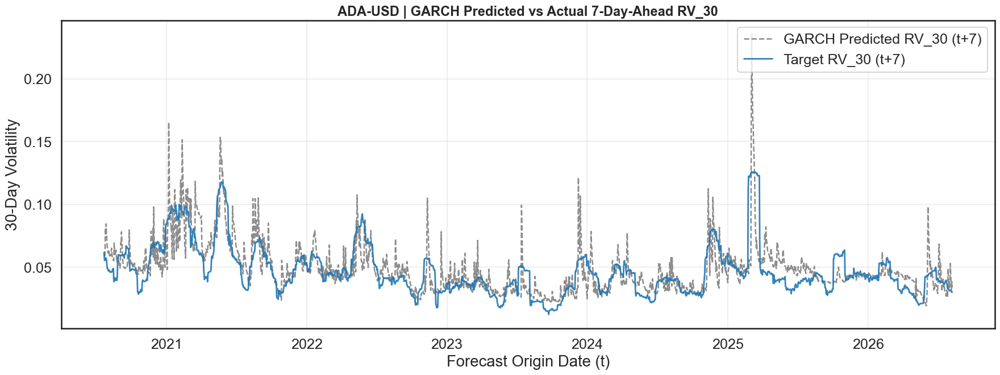

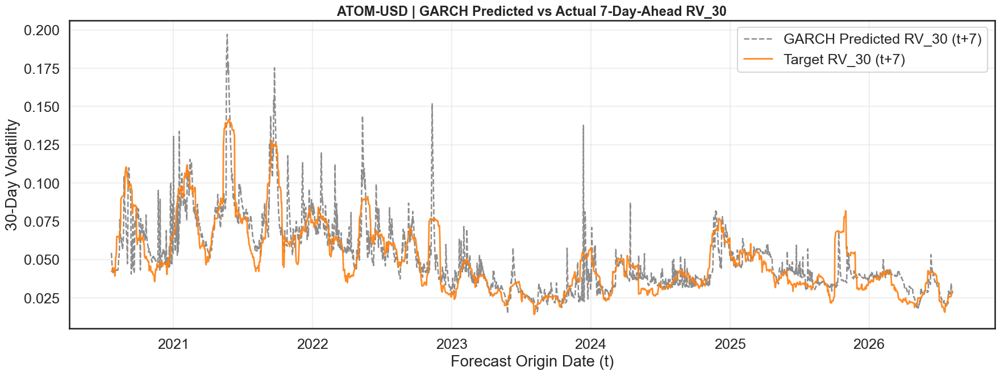

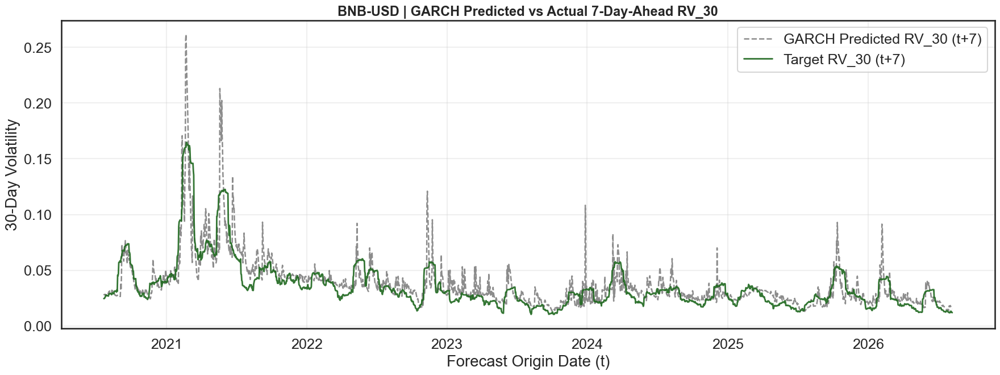

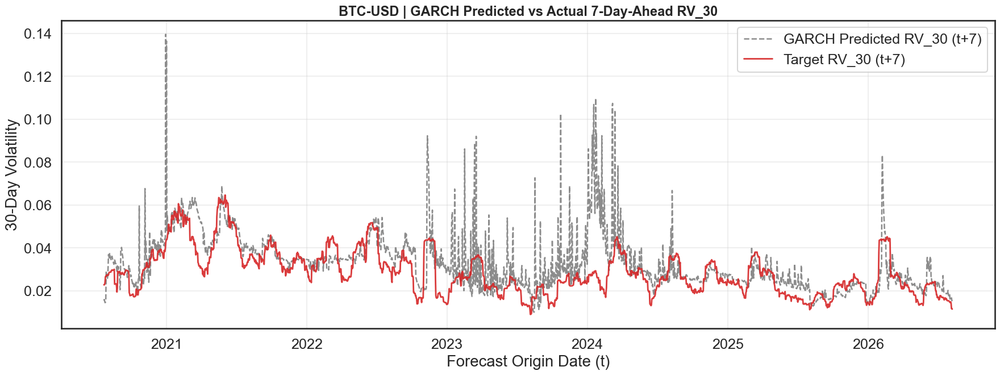

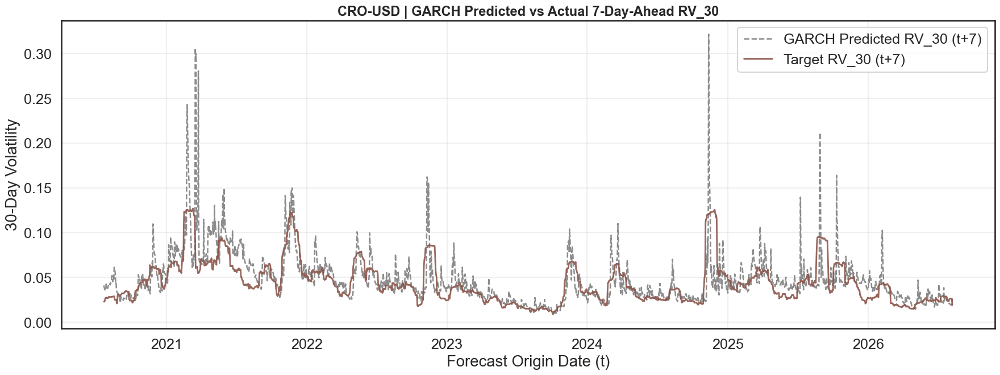

...

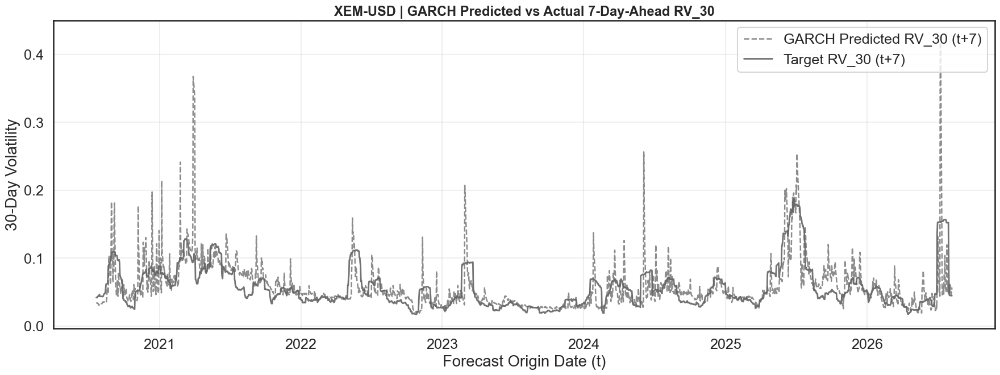

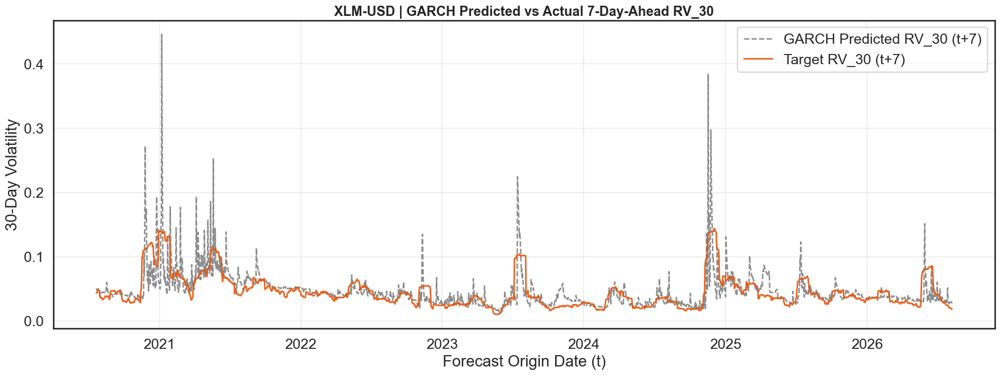

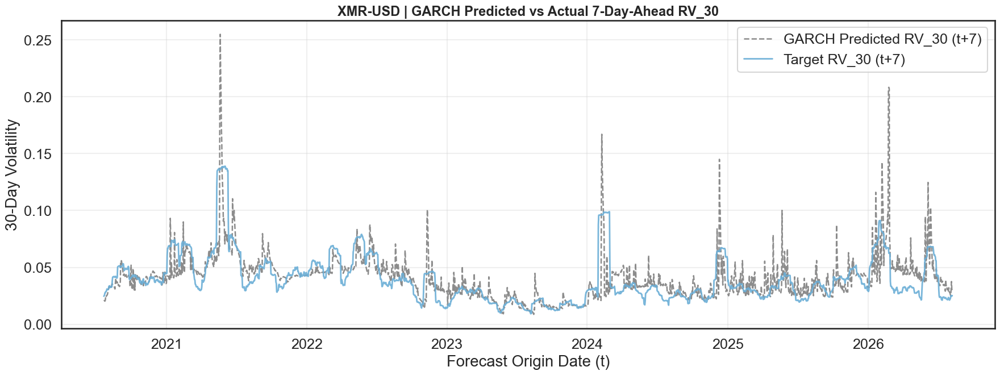

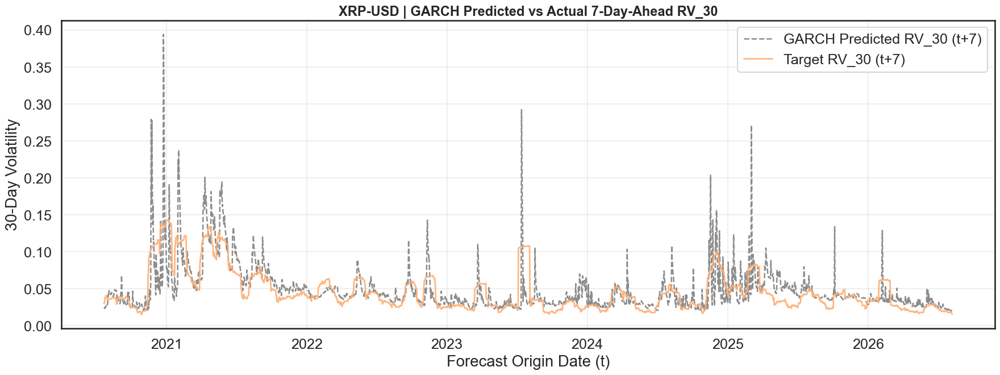

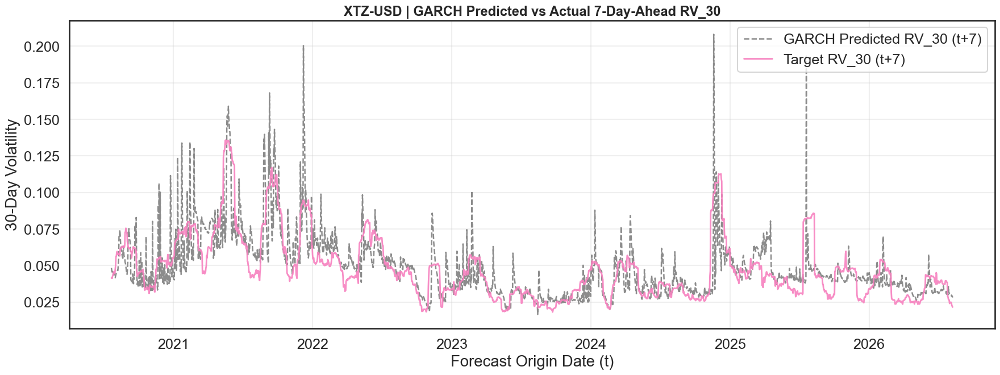

In [74]:
#====================================================
# VISUALIZE GARCH PREDICTED RV_30 (t+7)
# VS ACTUAL RV_30 TARGET (t+7)
#====================================================


#====================================================
# SET PLOT STYLE
#====================================================

sns.set_context(
    "talk",
    font_scale=1.1
)


#====================================================
# LOOP THROUGH EACH CRYPTOCURRENCY
#====================================================

for ticker in sorted(
    lstm_df["Ticker"].unique()
):


    #================================================
    # EXTRACT ONE CRYPTOCURRENCY
    #================================================

    coin = (

        lstm_df[
            lstm_df["Ticker"] == ticker
        ]

        .sort_values("Date")

        .copy()

    )


    #================================================
    # REMOVE MISSING VALUES
    #================================================

    coin = coin.dropna(

        subset=[
            "GARCH_Vol",
            "RV_30_Target"
        ]

    )


    #================================================
    # SKIP EMPTY DATAFRAME
    #================================================

    if coin.empty:

        continue


    #================================================
    # CREATE FIGURE
    #================================================

    plt.figure(
        figsize=(18, 7)
    )


    #================================================
    # GARCH PREDICTED RV_30 AT t+7
    #================================================

    plt.plot(

        coin["Date"],

        coin["GARCH_Vol"],

        color="gray",

        linewidth=1.8,

        linestyle="--",

        alpha=0.9,

        label="GARCH Predicted RV_30 (t+7)"

    )


    #================================================
    # ACTUAL RV_30 TARGET AT t+7
    #
    # RV_30_Target[t] = RV_30[t+7]
    #================================================

    plt.plot(

        coin["Date"],

        coin["RV_30_Target"],

        color=colors[ticker],

        linewidth=2.0,

        alpha=0.9,

        label="Target RV_30 (t+7)"

    )


    #================================================
    # TITLE
    #================================================

    plt.title(

        f"{ticker} | GARCH Predicted vs Actual "
        f"7-Day-Ahead RV_30",

        fontsize=17,

        fontweight="bold"

    )


    #================================================
    # AXIS LABELS
    #================================================

    plt.xlabel(
        "Forecast Origin Date (t)"
    )


    plt.ylabel(
        "30-Day Volatility"
    )


    #================================================
    # LEGEND
    #================================================

    plt.legend(
        loc="upper right"
    )


    #================================================
    # GRID
    #================================================

    plt.grid(
        alpha=0.3
    )


    #================================================
    # FINALIZE
    #================================================

    plt.tight_layout()

    plt.show()

In [75]:
#====================================================
# CHECK TRAIN, VALIDATION, TEST AND FUTURE DATA
#====================================================


#====================================================
# CREATE COPIES
#====================================================

train_df = train_df.copy()

validation_df = validation_df.copy()

test_df = test_df.copy()

future_df = future_df.copy()


#====================================================
# SORT DATA
#====================================================

for df in [

    train_df,
    validation_df,
    test_df,
    future_df

]:

    df.sort_values(

        [
            "Ticker",
            "Date"
        ],

        inplace=True

    )

    df.reset_index(

        drop=True,
        inplace=True

    )


#====================================================
# DEFINE DATASETS
#====================================================

datasets = [

    train_df,
    validation_df,
    test_df,
    future_df

]


dataset_names = [

    "Train",
    "Validation",
    "Test",
    "Future"

]


#====================================================
# VERIFY NON-FEATURE COLUMNS
#====================================================

print("\n" + "=" * 70)
print("NON-FEATURE COLUMN CHECK")
print("=" * 70)


for col in exclude_columns:

    print(

        f"{col:<25}"
        f"Included in features: "
        f"{col in feature_columns}"

    )


#====================================================
# SAFETY ASSERTIONS
#====================================================

assert "Date" not in feature_columns, (
    "Date must not be an LSTM feature."
)

assert "Target_Date" not in feature_columns, (
    "Target_Date must not be an LSTM feature."
)

assert "Ticker" not in feature_columns, (
    "Ticker must not be an LSTM feature."
)

assert TARGET not in feature_columns, (
    f"{TARGET} must not be an LSTM feature."
)

assert "Data_Split" not in feature_columns, (
    "Data_Split must not be an LSTM feature."
)


#====================================================
# DEFINE MACRO FEATURES
#====================================================

macro_columns = [

    "SP500",
    "DowJones",
    "USD_Index",
    "VIX",

    "SP500_Return",
    "SP500_MA30",
    "SP500_Volatility30",

    "DowJones_Return",
    "DowJones_MA30",
    "DowJones_Volatility30",

    "USD_Index_Return",
    "USD_Index_MA30",
    "USD_Index_Volatility30",

    "VIX_Return",
    "VIX_MA30",
    "VIX_Volatility30",

    "Fear_Greed_Index"

]


#====================================================
# DEFINE BINARY REGIME FEATURES
#
# Keep these as 0/1.
# Do NOT standardize.
#====================================================

binary_regime_columns = [

    "Bull_Regime",
    "Bear_Regime"

]


#====================================================
# COMBINE ALL EVENT FEATURES
# 2021 - 2026
#====================================================

event_columns = (

    event_columns_2021
    + event_columns_2022
    + event_columns_2023
    + event_columns_2024
    + event_columns_2025
    + event_columns_2026

)


#====================================================
# REMOVE DUPLICATE EVENT NAMES
#====================================================

event_columns = list(

    dict.fromkeys(
        event_columns
    )

)


print("\n" + "=" * 70)
print("INITIAL EVENT FEATURE INFORMATION")
print("=" * 70)

print(
    "Number of event columns supplied:",
    len(event_columns)
)


#====================================================
# CHECK EVENT COLUMN AVAILABILITY
#====================================================

missing_event_columns = [

    col

    for col in event_columns

    if not all(

        col in df.columns

        for df in datasets

    )

]


print("\n" + "=" * 70)
print("EVENT COLUMN AVAILABILITY CHECK")
print("=" * 70)


if missing_event_columns:

    print(
        "Event columns missing from at least one dataset:"
    )

    for col in missing_event_columns:

        print(
            f"  - {col}"
        )

else:

    print(
        "All event columns are available in "
        "Train, Validation, Test and Future."
    )


#====================================================
# KEEP EVENT COLUMNS AVAILABLE
# IN ALL FOUR DATASETS
#====================================================

event_columns = [

    col

    for col in event_columns

    if all(

        col in df.columns

        for df in datasets

    )

]


print(
    "\nAvailable event columns:",
    len(event_columns)
)


#====================================================
# FILL MISSING EVENT VALUES WITH ZERO
#
# 0 = event inactive
# 1 = event active
#====================================================

for df in datasets:

    df[event_columns] = (

        df[event_columns]

        .fillna(0)

    )


#====================================================
# CHECK EVENT MISSING VALUES
#====================================================

print("\n" + "=" * 70)
print("EVENT MISSING VALUE CHECK AFTER FILLING")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    missing_events = (

        df[event_columns]

        .isna()

        .sum()

        .sum()

    )


    print(

        f"{name:<12}"
        f"Missing event values: "
        f"{missing_events}"

    )


#====================================================
# IDENTIFY NON-BINARY EVENT VARIABLES
#====================================================

non_binary_event_columns = []


for col in event_columns:

    combined_values = pd.concat(

        [

            train_df[col],
            validation_df[col],
            test_df[col],
            future_df[col]

        ],

        axis=0

    )


    is_binary = (

        combined_values

        .isin(
            [0, 1]
        )

        .all()

    )


    if not is_binary:

        non_binary_event_columns.append(
            col
        )


#====================================================
# PRINT NON-BINARY EVENT VARIABLES
#====================================================

print("\n" + "=" * 70)
print("NON-BINARY EVENT VARIABLES TO REMOVE")
print("=" * 70)


if non_binary_event_columns:

    for col in non_binary_event_columns:

        combined_values = pd.concat(

            [

                train_df[col],
                validation_df[col],
                test_df[col],
                future_df[col]

            ],

            axis=0

        )


        unique_values = np.sort(

            combined_values

            .dropna()

            .unique()

        )


        print(

            f"{col:<45}"
            f"Values: {unique_values}"

        )

else:

    print(
        "No non-binary event variables found."
    )


#====================================================
# REMOVE NON-BINARY EVENT VARIABLES
# FROM EVENT LIST
#====================================================

event_columns = [

    col

    for col in event_columns

    if col not in non_binary_event_columns

]


#====================================================
# REMOVE NON-BINARY EVENT VARIABLES
# FROM MODEL FEATURE LIST
#====================================================

feature_columns = [

    col

    for col in feature_columns

    if col not in non_binary_event_columns

]


#====================================================
# REMOVE NON-BINARY EVENT COLUMNS
# FROM DATAFRAMES
#====================================================

for df in datasets:

    df.drop(

        columns=non_binary_event_columns,

        inplace=True,

        errors="ignore"

    )


#====================================================
# CONVERT VALID EVENT FEATURES TO FLOAT32
#====================================================

for df in datasets:

    df[event_columns] = (

        df[event_columns]

        .astype(
            np.float32
        )

    )


#====================================================
# VERIFY REMAINING EVENT FEATURES
# ARE BINARY
#====================================================

print("\n" + "=" * 70)
print("BINARY EVENT CHECK AFTER REMOVAL")
print("=" * 70)


invalid_after_removal = []


for col in event_columns:

    combined_values = pd.concat(

        [

            train_df[col],
            validation_df[col],
            test_df[col],
            future_df[col]

        ],

        axis=0

    )


    if not (

        combined_values

        .isin(
            [0, 1]
        )

        .all()

    ):

        invalid_after_removal.append(
            col
        )


if invalid_after_removal:

    print(
        "WARNING: Non-binary event variables remain:"
    )

    for col in invalid_after_removal:

        print(
            f"  - {col}"
        )

else:

    print(
        "All remaining event features are binary (0/1)."
    )


#====================================================
# CHECK ACTIVE EVENT FEATURES BY DATASET
#====================================================

print("\n" + "=" * 70)
print("ACTIVE EVENT FEATURES BY DATASET")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    active_event_columns = [

        col

        for col in event_columns

        if (
            df[col] == 1
        ).any()

    ]


    print(

        f"\n{name}: "
        f"{len(active_event_columns)} "
        f"active event features"

    )


    for col in active_event_columns:

        counts = (

            df[col]

            .value_counts()

            .sort_index()

            .to_dict()

        )


        print(

            f"{col:<45}",
            counts

        )


#====================================================
# IDENTIFY EVENTS CONSTANT IN TRAIN
# BUT ACTIVE LATER
#====================================================

constant_train_but_active_later = []


for col in event_columns:

    train_unique = (

        train_df[col]

        .dropna()

        .unique()

    )


    later_values = pd.concat(

        [

            validation_df[col],
            test_df[col],
            future_df[col]

        ],

        axis=0

    )


    if (

        len(train_unique) == 1

        and train_unique[0] == 0

        and (later_values == 1).any()

    ):

        constant_train_but_active_later.append(
            col
        )

#====================================================
# FORWARD-FILL MACRO FEATURES
#
# IMPORTANT:
# Forward fill only within each ticker.
# No backward filling.
#====================================================

for df in datasets:

    available_macro_columns = [

        col

        for col in macro_columns

        if col in df.columns

    ]


    if available_macro_columns:

        df[
            available_macro_columns
        ] = (

            df

            .groupby(
                "Ticker"
            )[available_macro_columns]

            .ffill()

        )


#====================================================
# DEFINE EVENT FEATURES USED BY LSTM
#====================================================

event_feature_columns = [

    col

    for col in event_columns

    if col in feature_columns

]


#====================================================
# DEFINE BINARY REGIME FEATURES USED BY LSTM
#====================================================

binary_regime_feature_columns = [

    col

    for col in binary_regime_columns

    if col in feature_columns

]


#====================================================
# VERIFY BINARY REGIME FEATURES
#====================================================

for col in binary_regime_feature_columns:

    for name, df in zip(

        dataset_names,
        datasets

    ):

        invalid_values = (

            df[col]

            .dropna()

            .loc[
                lambda x:
                ~x.isin([0, 1])
            ]

        )


        assert len(
            invalid_values
        ) == 0, (

            f"{name}: {col} contains "
            f"values other than 0/1."

        )


#====================================================
# CONVERT BINARY REGIME FEATURES TO FLOAT32
#====================================================

for df in datasets:

    if binary_regime_feature_columns:

        df[
            binary_regime_feature_columns
        ] = (

            df[
                binary_regime_feature_columns
            ]

            .astype(
                np.float32
            )

        )


#====================================================
# DEFINE ALL BINARY FEATURES
#====================================================

binary_feature_columns = list(

    dict.fromkeys(

        event_feature_columns
        +
        binary_regime_feature_columns

    )

)


#====================================================
# DEFINE CONTINUOUS FEATURES
#
# These are the ONLY variables that will enter:
#
# SimpleImputer
# StandardScaler
#====================================================

continuous_feature_columns = [

    col

    for col in feature_columns

    if col not in binary_feature_columns

]


#====================================================
# FEATURE SUMMARY
#====================================================

print("\n" + "=" * 70)
print("FEATURE GROUPS")
print("=" * 70)


print(
    "Total LSTM features:",
    len(feature_columns)
)

print(
    "Continuous features:",
    len(continuous_feature_columns)
)

print(
    "Binary event features:",
    len(event_feature_columns)
)

print(
    "Binary regime features:",
    len(binary_regime_feature_columns)
)

print(
    "Total binary features:",
    len(binary_feature_columns)
)

print(
    "Non-binary event features removed:",
    len(non_binary_event_columns)
)


#====================================================
# CHECK FOR METADATA / TARGET LEAKAGE
#====================================================

print("\n" + "=" * 70)
print("FEATURE LEAKAGE CHECK")
print("=" * 70)


for col in exclude_columns:

    print(

        f"{col:<25}",
        col in feature_columns

    )


assert not any(

    col in feature_columns

    for col in exclude_columns

), (

    "Metadata or target columns remain "
    "in feature_columns."

)


#====================================================
# CHECK ALL CONTINUOUS FEATURES EXIST
#====================================================

for name, df in zip(

    dataset_names,
    datasets

):

    missing_columns = [

        col

        for col in continuous_feature_columns

        if col not in df.columns

    ]


    assert not missing_columns, (

        f"{name} is missing continuous "
        f"features: {missing_columns}"

    )


#====================================================
# VERIFY CONTINUOUS FEATURES ARE NUMERIC
#
# THIS CHECK PREVENTS THE DATETIME ERROR.
#====================================================

print("\n" + "=" * 70)
print("CONTINUOUS FEATURE DTYPE CHECK")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    non_numeric_columns = [

        col

        for col in continuous_feature_columns

        if not pd.api.types.is_numeric_dtype(
            df[col]
        )

    ]


    print(

        f"{name:<12}"
        f"Non-numeric continuous features: "
        f"{non_numeric_columns}"

    )


    assert len(
        non_numeric_columns
    ) == 0, (

        f"{name} contains non-numeric "
        f"continuous features: "
        f"{non_numeric_columns}"

    )


#====================================================
# PRINT CONTINUOUS DTYPES
#====================================================

continuous_dtypes = (

    train_df[
        continuous_feature_columns
    ]

    .dtypes

)


print("\nTraining continuous dtypes:")

print(
    continuous_dtypes.value_counts()
)


#====================================================
# REPLACE INFINITE CONTINUOUS VALUES WITH NaN
#====================================================

for df in datasets:

    df[
        continuous_feature_columns
    ] = (

        df[
            continuous_feature_columns
        ]

        .replace(

            [
                np.inf,
                -np.inf
            ],

            np.nan

        )

    )


#====================================================
# CHECK MISSING CONTINUOUS FEATURES
# BEFORE IMPUTER
#====================================================

print("\n" + "=" * 70)
print("MISSING CONTINUOUS FEATURES BEFORE IMPUTER")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    missing = (

        df[
            continuous_feature_columns
        ]

        .isna()

        .sum()

        .sort_values(
            ascending=False
        )

    )


    missing = missing[
        missing > 0
    ]


    print(
        f"\n{name}:"
    )


    if len(missing) > 0:

        print(
            missing
        )

    else:

        print(
            "No missing continuous feature values."
        )


#====================================================
# CREATE FULL LSTM DATASET
# BEFORE IMPUTER AND SCALER
#====================================================

train_before = train_df.copy()

validation_before = validation_df.copy()

test_before = test_df.copy()

future_before = future_df.copy()


#====================================================
# ADD DATA SPLIT LABEL
#====================================================

train_before[
    "Data_Split"
] = "Train"

validation_before[
    "Data_Split"
] = "Validation"

test_before[
    "Data_Split"
] = "Test"

future_before[
    "Data_Split"
] = "Future"


#====================================================
# COMBINE ALL FOUR SPLITS
#====================================================

lstm_full_before = pd.concat(

    [

        train_before,
        validation_before,
        test_before,
        future_before

    ],

    axis=0,

    ignore_index=True

)


#====================================================
# SORT FULL DATASET
#====================================================

lstm_full_before = (

    lstm_full_before

    .sort_values(

        [
            "Date",
            "Ticker"
        ]

    )

    .reset_index(
        drop=True
    )

)


#====================================================
# CHECK DUPLICATES BEFORE IMPUTER
#====================================================

duplicates_before = (

    lstm_full_before

    .duplicated(

        subset=[
            "Date",
            "Ticker"
        ]

    )

    .sum()

)


#====================================================
# CHECK MISSING MODEL FEATURES
#====================================================

missing_before = (

    lstm_full_before[
        feature_columns
    ]

    .isna()

    .sum()

    .sum()

)


#====================================================
# CHECK MISSING BINARY FEATURES
#====================================================

missing_binary_before = (

    lstm_full_before[
        binary_feature_columns
    ]

    .isna()

    .sum()

    .sum()

)


#====================================================
# CHECK BINARY VARIABLES
#====================================================

invalid_binary_before = []


for col in binary_feature_columns:

    if not (

        lstm_full_before[col]

        .isin(
            [0, 1]
        )

        .all()

    ):

        invalid_binary_before.append(
            col
        )


#====================================================
# SAVE DATA BEFORE IMPUTER / SCALER
#====================================================

lstm_full_before.to_csv(

    "lstm_full_before_imputer_scaler.csv",

    index=False

)


print("\n" + "=" * 70)
print("FULL LSTM DATA SAVED BEFORE IMPUTER AND SCALER")
print("=" * 70)


print(
    "File: lstm_full_before_imputer_scaler.csv"
)

print(
    "Rows:",
    len(lstm_full_before)
)

print(
    "Columns:",
    len(lstm_full_before.columns)
)

print(
    "Cryptocurrencies:",
    lstm_full_before[
        "Ticker"
    ].nunique()
)

print(
    "Forecast-origin start:",
    lstm_full_before[
        "Date"
    ].min()
)

print(
    "Forecast-origin end:",
    lstm_full_before[
        "Date"
    ].max()
)

print(
    "Target-date start:",
    lstm_full_before[
        "Target_Date"
    ].min()
)

print(
    "Target-date end:",
    lstm_full_before[
        "Target_Date"
    ].max()
)

print(
    "Duplicated Date-Ticker rows:",
    duplicates_before
)

print(
    "Missing model feature values:",
    missing_before
)

print(
    "Missing binary values:",
    missing_binary_before
)

print(
    "Invalid binary features:",
    len(
        invalid_binary_before
    )
)


#====================================================
# PRE-IMPUTER ASSERTIONS
#====================================================

assert duplicates_before == 0, (
    "Duplicated Date-Ticker rows detected "
    "before imputation."
)


assert missing_binary_before == 0, (
    "Missing binary feature values detected "
    "before imputation."
)


assert len(
    invalid_binary_before
) == 0, (
    "Invalid binary features detected "
    "before imputation."
)


#====================================================
# FIT MEDIAN IMPUTER
#
# FIT TRAIN ONLY
#====================================================

imputer = SimpleImputer(

    strategy="median"

)


train_df[
    continuous_feature_columns
] = imputer.fit_transform(

    train_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED IMPUTER
# TO VALIDATION
#====================================================

validation_df[
    continuous_feature_columns
] = imputer.transform(

    validation_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED IMPUTER
# TO TEST
#====================================================

test_df[
    continuous_feature_columns
] = imputer.transform(

    test_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED IMPUTER
# TO FUTURE
#====================================================

future_df[
    continuous_feature_columns
] = imputer.transform(

    future_df[
        continuous_feature_columns
    ]

)


#====================================================
# CHECK MISSING VALUES AFTER IMPUTER
#====================================================

print("\n" + "=" * 70)
print("MISSING VALUES AFTER IMPUTER")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    missing_continuous = (

        df[
            continuous_feature_columns
        ]

        .isna()

        .sum()

        .sum()

    )


    missing_binary = (

        df[
            binary_feature_columns
        ]

        .isna()

        .sum()

        .sum()

    )


    print(

        f"{name:<12}"
        f"Continuous Missing: "
        f"{missing_continuous:<8}"
        f"Binary Missing: "
        f"{missing_binary}"

    )


#====================================================
# FIT STANDARD SCALER
#
# CONTINUOUS FEATURES ONLY
#
# FIT TRAIN ONLY
#====================================================

scaler = StandardScaler()


train_df[
    continuous_feature_columns
] = scaler.fit_transform(

    train_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED SCALER
# TO VALIDATION
#====================================================

validation_df[
    continuous_feature_columns
] = scaler.transform(

    validation_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED SCALER
# TO TEST
#====================================================

test_df[
    continuous_feature_columns
] = scaler.transform(

    test_df[
        continuous_feature_columns
    ]

)


#====================================================
# APPLY TRAIN-FITTED SCALER
# TO FUTURE
#====================================================

future_df[
    continuous_feature_columns
] = scaler.transform(

    future_df[
        continuous_feature_columns
    ]

)


#====================================================
# FINAL BINARY FEATURE CHECK
#====================================================

print("\n" + "=" * 70)
print("FINAL BINARY FEATURE CHECK")
print("=" * 70)


final_invalid_binary_columns = []


for col in binary_feature_columns:

    combined_values = pd.concat(

        [

            train_df[col],
            validation_df[col],
            test_df[col],
            future_df[col]

        ],

        axis=0

    )


    if not (

        combined_values

        .isin(
            [0, 1]
        )

        .all()

    ):

        final_invalid_binary_columns.append(
            col
        )


if final_invalid_binary_columns:

    print(
        "WARNING: Invalid binary features:"
    )

    for col in final_invalid_binary_columns:

        print(
            f"  - {col}"
        )

else:

    print(
        "All binary features remain 0/1."
    )


#====================================================
# FINAL PREPROCESSING CHECK
#====================================================

print("\n" + "=" * 70)
print("FINAL PREPROCESSING CHECK")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    missing = (

        df[
            feature_columns
        ]

        .isna()

        .sum()

        .sum()

    )


    values = (

        df[
            feature_columns
        ]

        .to_numpy(
            dtype=float
        )

    )


    infinite = (

        np.isinf(
            values
        )

        .sum()

    )


    print(

        f"{name:<12}"
        f"Rows: {len(df):<8}"
        f"Missing: {missing:<8}"
        f"Infinite: {infinite}"

    )


#====================================================
# CHECK SCALED CONTINUOUS TRAIN FEATURES
#====================================================

print("\n" + "=" * 70)
print("SCALED CONTINUOUS TRAINING FEATURES")
print("=" * 70)


print(

    train_df[
        continuous_feature_columns
    ]

    .describe()

    .T[
        [
            "mean",
            "std",
            "min",
            "max"
        ]
    ]

    .round(4)

)


#====================================================
# CHECK BINARY FEATURES REMAIN UNSCALED
#====================================================

print("\n" + "=" * 70)
print("BINARY FEATURES AFTER PREPROCESSING")
print("=" * 70)


for col in binary_feature_columns:

    combined_values = pd.concat(

        [

            train_df[col],
            validation_df[col],
            test_df[col],
            future_df[col]

        ],

        axis=0

    )


    unique_values = np.sort(

        combined_values

        .dropna()

        .unique()

    )


    print(

        f"{col:<45}",
        unique_values

    )


#====================================================
# CREATE FULL LSTM DATASET
# AFTER IMPUTER AND SCALER
#====================================================

train_after = train_df.copy()

validation_after = validation_df.copy()

test_after = test_df.copy()

future_after = future_df.copy()


#====================================================
# ADD DATA SPLIT LABEL
#====================================================

train_after[
    "Data_Split"
] = "Train"

validation_after[
    "Data_Split"
] = "Validation"

test_after[
    "Data_Split"
] = "Test"

future_after[
    "Data_Split"
] = "Future"


#====================================================
# COMBINE ALL FOUR SPLITS
#====================================================

lstm_full_after = pd.concat(

    [

        train_after,
        validation_after,
        test_after,
        future_after

    ],

    axis=0,

    ignore_index=True

)


#====================================================
# SORT FULL FINAL DATASET
#====================================================

lstm_full_after = (

    lstm_full_after

    .sort_values(

        [
            "Date",
            "Ticker"
        ]

    )

    .reset_index(
        drop=True
    )

)


#====================================================
# CHECK DUPLICATES AFTER PREPROCESSING
#====================================================

duplicates_after = (

    lstm_full_after

    .duplicated(

        subset=[
            "Date",
            "Ticker"
        ]

    )

    .sum()

)


#====================================================
# CHECK MISSING MODEL VALUES
#====================================================

missing_after = (

    lstm_full_after[
        feature_columns
    ]

    .isna()

    .sum()

    .sum()

)


#====================================================
# CHECK INFINITE MODEL VALUES
#====================================================

infinite_after = (

    np.isinf(

        lstm_full_after[
            feature_columns
        ]

        .to_numpy(
            dtype=float
        )

    )

    .sum()

)


#====================================================
# CHECK BINARY FEATURES
#====================================================

invalid_binary_after = []


for col in binary_feature_columns:

    if not (

        lstm_full_after[col]

        .isin(
            [0, 1]
        )

        .all()

    ):

        invalid_binary_after.append(
            col
        )


#====================================================
# FINAL ASSERTIONS FOR EACH SPLIT
#====================================================

for name, df in zip(

    dataset_names,
    datasets

):

    #================================================
    # NO MISSING MODEL FEATURES
    #================================================

    assert (

        df[
            feature_columns
        ]

        .isna()

        .sum()

        .sum()

        == 0

    ), (

        f"{name} contains missing "
        f"feature values."

    )


    #================================================
    # NO INFINITE MODEL FEATURES
    #================================================

    assert not np.isinf(

        df[
            feature_columns
        ]

        .to_numpy(
            dtype=float
        )

    ).any(), (

        f"{name} contains infinite "
        f"feature values."

    )


    #================================================
    # BINARY FEATURES MUST REMAIN 0/1
    #================================================

    for col in binary_feature_columns:

        assert (

            df[col]

            .isin(
                [0, 1]
            )

            .all()

        ), (

            f"{name}: {col} "
            f"is not binary."

        )


#====================================================
# FINAL ASSERTIONS FOR FULL DATASET
#====================================================

assert duplicates_after == 0, (
    "Duplicated Date-Ticker rows detected "
    "in final LSTM dataset."
)


assert missing_after == 0, (
    "Missing model feature values remain "
    "after imputation."
)


assert infinite_after == 0, (
    "Infinite model feature values remain "
    "after preprocessing."
)


assert len(
    invalid_binary_after
) == 0, (
    "Binary features are no longer 0/1 "
    "after preprocessing."
)


#====================================================
# VERIFY TARGET AND METADATA STILL EXIST
#
# They should exist in the dataframe,
# but NOT in feature_columns.
#====================================================

required_metadata = [

    "Date",
    "Target_Date",
    "Ticker",
    TARGET

]


for col in required_metadata:

    assert all(

        col in df.columns

        for df in datasets

    ), (

        f"{col} was accidentally removed "
        f"from the datasets."

    )


#====================================================
# SAVE FULL FINAL LSTM DATASET
#====================================================

lstm_full_after.to_csv(

    "lstm_full_after_imputer_scaler.csv",

    index=False

)


#====================================================
# SAVE FEATURE LIST
#====================================================

pd.DataFrame(

    {
        "Feature":
            feature_columns
    }

).to_csv(

    "lstm_feature_columns.csv",

    index=False

)


#====================================================
# SAVE CONTINUOUS FEATURE LIST
#====================================================

pd.DataFrame(

    {
        "Continuous_Feature":
            continuous_feature_columns
    }

).to_csv(

    "lstm_continuous_feature_columns.csv",

    index=False

)


#====================================================
# SAVE EVENT FEATURE LIST
#====================================================

pd.DataFrame(

    {
        "Event_Feature":
            event_feature_columns
    }

).to_csv(

    "lstm_event_feature_columns.csv",

    index=False

)


#====================================================
# SAVE ALL BINARY FEATURE LIST
#====================================================

pd.DataFrame(

    {
        "Binary_Feature":
            binary_feature_columns
    }

).to_csv(

    "lstm_binary_feature_columns.csv",

    index=False

)


#====================================================
# FULL DATASET SPLIT SUMMARY
#
# PRINT BOTH FORECAST-ORIGIN AND TARGET PERIODS
#====================================================

print("\n" + "=" * 70)
print("FULL LSTM DATASET SPLIT SUMMARY")
print("=" * 70)


split_summary = (

    lstm_full_after

    .groupby(
        "Data_Split"
    )

    .agg(

        Forecast_Origin_Start=(
            "Date",
            "min"
        ),

        Forecast_Origin_End=(
            "Date",
            "max"
        ),

        Target_Start=(
            "Target_Date",
            "min"
        ),

        Target_End=(
            "Target_Date",
            "max"
        ),

        Rows=(
            "Date",
            "size"
        ),

        Coins=(
            "Ticker",
            "nunique"
        )

    )

)


print(
    split_summary
)


#====================================================
# FINAL FEATURE SUMMARY
#====================================================

print("\n" + "=" * 70)
print("FINAL FEATURE SUMMARY")
print("=" * 70)


print(
    "Total LSTM features:",
    len(feature_columns)
)

print(
    "Continuous features:",
    len(continuous_feature_columns)
)

print(
    "Event binary features:",
    len(event_feature_columns)
)

print(
    "Regime binary features:",
    len(binary_regime_feature_columns)
)

print(
    "Total binary features:",
    len(binary_feature_columns)
)


print(
    "\nTarget:",
    TARGET
)

print(
    "Target included in features:",
    TARGET in feature_columns
)

print(
    "Target_Date included in features:",
    "Target_Date" in feature_columns
)

print(
    "Date included in features:",
    "Date" in feature_columns
)

print(
    "Ticker included in features:",
    "Ticker" in feature_columns
)


#====================================================
# FINAL DTYPE CHECK
#====================================================

print("\n" + "=" * 70)
print("FINAL FEATURE DTYPE CHECK")
print("=" * 70)


for name, df in zip(

    dataset_names,
    datasets

):

    non_numeric_features = [

        col

        for col in feature_columns

        if not pd.api.types.is_numeric_dtype(
            df[col]
        )

    ]


    print(

        f"{name:<12}"
        f"Non-numeric model features: "
        f"{non_numeric_features}"

    )


    assert not non_numeric_features, (

        f"{name} contains non-numeric "
        f"LSTM features: "
        f"{non_numeric_features}"

    )


#====================================================
# FINAL SAVED FILE SUMMARY
#====================================================

print("\n" + "=" * 70)
print("SAVED LSTM FILES")
print("=" * 70)


print(
    "\n1. BEFORE IMPUTER AND SCALER:"
)

print(
    "   lstm_full_before_imputer_scaler.csv"
)


print(
    "\n2. AFTER IMPUTER AND SCALER:"
)

print(
    "   lstm_full_after_imputer_scaler.csv"
)


print(
    "\n3. FEATURE LISTS:"
)

print(
    "   lstm_feature_columns.csv"
)

print(
    "   lstm_continuous_feature_columns.csv"
)

print(
    "   lstm_event_feature_columns.csv"
)

print(
    "   lstm_binary_feature_columns.csv"
)


#====================================================
# FINAL DATASET SUMMARY
#====================================================

print("\n" + "=" * 70)
print("FINAL DATASET SUMMARY")
print("=" * 70)


print(
    "Full rows:",
    len(
        lstm_full_after
    )
)

print(
    "Full columns:",
    len(
        lstm_full_after.columns
    )
)

print(
    "Cryptocurrencies:",
    lstm_full_after[
        "Ticker"
    ].nunique()
)

print(
    "Forecast-origin start:",
    lstm_full_after[
        "Date"
    ].min()
)

print(
    "Forecast-origin end:",
    lstm_full_after[
        "Date"
    ].max()
)

print(
    "Target-date start:",
    lstm_full_after[
        "Target_Date"
    ].min()
)

print(
    "Target-date end:",
    lstm_full_after[
        "Target_Date"
    ].max()
)

print(
    "Total LSTM features:",
    len(
        feature_columns
    )
)

print(
    "Continuous features:",
    len(
        continuous_feature_columns
    )
)

print(
    "Binary features:",
    len(
        binary_feature_columns
    )
)

print(
    "Missing event columns:",
    len(
        missing_event_columns
    )
)

print(
    "Non-binary events removed:",
    len(
        non_binary_event_columns
    )
)

print(
    "Events constant in Train "
    "but active later:",
    len(
        constant_train_but_active_later
    )
)

print(
    "Final missing model values:",
    missing_after
)

print(
    "Final infinite model values:",
    infinite_after
)

print(
    "Final duplicate Date-Ticker rows:",
    duplicates_after
)


#====================================================
# FINAL SUCCESS MESSAGE
#====================================================

print("\n" + "=" * 70)
print("PREPROCESSING COMPLETED SUCCESSFULLY")
print("=" * 70)


print(
    "Target_Date retained as metadata "
    "but excluded from LSTM inputs."
)

print(
    "Date and Ticker retained as metadata "
    "but excluded from LSTM inputs."
)

print(
    "RV_30_Target retained as target "
    "but excluded from LSTM inputs."
)

print(
    "Event NaNs filled with 0."
)

print(
    "Non-binary event features removed."
)

print(
    "Event features retained as 0/1 "
    "and not scaled."
)

print(
    "Bull_Regime and Bear_Regime retained "
    "as 0/1 and not scaled."
)

print(
    "Continuous missing values median-imputed "
    "using Train only."
)

print(
    "Continuous features standardized "
    "using Train only."
)

print(
    "Full dataset saved before imputer/scaler."
)

print(
    "Full dataset saved after imputer/scaler."
)


NON-FEATURE COLUMN CHECK
Date                     Included in features: False
Target_Date              Included in features: False
Ticker                   Included in features: False
Window                   Included in features: False
RV_30_Target             Included in features: False
RV_7                     Included in features: False
RV_60                    Included in features: False
RV_180                   Included in features: False
RV_365                   Included in features: False

INITIAL EVENT FEATURE INFORMATION
Number of event columns supplied: 173

EVENT COLUMN AVAILABILITY CHECK
All event columns are available in Train, Validation, Test and Future.

Available event columns: 173

EVENT MISSING VALUE CHECK AFTER FILLING
Train       Missing event values: 0
Validation  Missing event values: 0
Test        Missing event values: 0
Future      Missing event values: 0

NON-BINARY EVENT VARIABLES TO REMOVE
No non-binary event variables found.

BINARY EVENT CHECK AFTER REMO

In [76]:
#====================================================
# CREATE LEAKAGE-SAFE LSTM SEQUENCES
#====================================================

'''
Convert panel dataframe into LSTM sequences without mixing cryptocurrencies
or leaking information across train/validation/test periods
'''

def create_sequences(
    target_df,
    feature_columns,
    target_column,
    lookback,
    history_df=None,
    require_target=True
):


    X = []

    y = []

    dates = []

    tickers = []


    #====================================================
    # PROCESS EACH CRYPTOCURRENCY SEPARATELY
    #====================================================

    for ticker in sorted(
        target_df["Ticker"].unique()
    ):


        target_coin = (

            target_df[
                target_df["Ticker"]
                ==
                ticker
            ]

            .sort_values("Date")

            .copy()

        )


        if target_coin.empty:

            continue


        #================================================
        # ADD HISTORICAL INPUT CONTEXT
        #================================================

        if history_df is not None:


            history_coin = (

                history_df[
                    history_df["Ticker"]
                    ==
                    ticker
                ]

                .sort_values("Date")

                .tail(lookback)

                .copy()

            )


            combined_coin = (

                pd.concat(

                    [
                        history_coin,
                        target_coin
                    ],

                    ignore_index=True

                )

            )


        else:

            combined_coin = (
                target_coin.copy()
            )


        combined_coin = (

            combined_coin

            .sort_values("Date")

            .reset_index(drop=True)

        )


        target_start_date = (

            target_coin["Date"]
            .min()

        )


        #================================================
        # CREATE WINDOWS
        #================================================

        for i in range(

            lookback,

            len(combined_coin)

        ):


            prediction_date = (

                combined_coin
                .iloc[i]["Date"]

            )


            # Target must belong to requested period
            #================================================

            if prediction_date < target_start_date:

                continue


            # Previous LOOKBACK observations
            #================================================

            sequence = (

                combined_coin

                .iloc[
                    i - lookback:i
                ][feature_columns]

                .values

                .astype(
                    np.float32
                )

            )


            # Safety check
            #================================================

            if not np.isfinite(sequence).all():

                continue


            target_value = (

                combined_coin
                .iloc[i][target_column]

            )


            #================================================
            # TRAIN / VALIDATION / TEST
            # Require known target
            #================================================

            if require_target:

                if pd.isna(target_value):

                    continue


                y.append(
                    float(target_value)
                )


            #================================================
            # FUTURE INFERENCE
            # Target can be unknown
            #================================================

            else:

                if pd.isna(target_value):

                    y.append(
                        np.nan
                    )

                else:

                    y.append(
                        float(target_value)
                    )


            X.append(
                sequence
            )


            dates.append(
                prediction_date
            )


            tickers.append(
                ticker
            )


    return (

        np.asarray(
            X,
            dtype=np.float32
        ),

        np.asarray(
            y,
            dtype=np.float32
        ),

        np.asarray(dates),

        np.asarray(tickers)

    )

In [77]:
#====================================================
# LSTM LOOKBACK WINDOWS
#====================================================

LOOKBACK_WINDOWS = {

    "30-Day": 30,

    "60-Day": 60,

    "90-Day": 90

}


print(
    LOOKBACK_WINDOWS
)

{'30-Day': 30, '60-Day': 60, '90-Day': 90}


In [78]:
#====================================================
# DEFINE HYBRID LSTM MODEL
#====================================================

import torch

import torch.nn as nn


class HybridLSTM(nn.Module):


    def __init__(
        self,
        input_size,
        hidden_size,
        num_layers,
        dropout
    ):


        super().__init__()


        #================================================
        # LSTM
        #================================================

        self.lstm = nn.LSTM(

            input_size=input_size,

            hidden_size=hidden_size,

            num_layers=num_layers,

            batch_first=True,

            dropout=(

                dropout

                if num_layers > 1

                else 0.0

            )

        )


        #================================================
        # DROPOUT
        #================================================

        self.dropout = nn.Dropout(
            dropout
        )


        #================================================
        # DENSE LAYERS
        #================================================

        self.fc1 = nn.Linear(

            hidden_size,

            64

        )


        self.fc2 = nn.Linear(

            64,

            32

        )


        self.output = nn.Linear(

            32,

            1

        )

        self.softplus = nn.Softplus()

        self.relu = nn.ReLU()


    def forward(
        self,
        x
    ):


        lstm_output, _ = self.lstm(
            x
        )


        # Final time step
        #================================================

        x = lstm_output[
            :,
            -1,
            :
        ]


        x = self.dropout(x)

        x = self.relu(
            self.fc1(x)
        )


        x = self.dropout(x)

        x = self.relu(
            self.fc2(x)
        )


        x = self.output(x)

        x = self.softplus(x)   #ensure positive prediction
        
        return x.squeeze(-1)

In [79]:
#====================================================
# TRAINING FUNCTION WITH EARLY STOPPING
# AND MULTIPLE VALIDATION METRICS
#====================================================

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

import torch
import torch.nn as nn

import numpy as np


#====================================================
# RANDOM SEED
#====================================================

SEED = 2021


#====================================================
# DEVICE
#====================================================

device = torch.device(

    "cuda"

    if torch.cuda.is_available()

    else "cpu"

)


print(
    "Device:",
    device
)


#====================================================
# VALIDATION EVALUATION FUNCTION
#====================================================

def calculate_validation_metrics(
    actual,
    predicted,
    epsilon=1e-8
):

    #================================================
    # CONVERT TO NUMPY
    #================================================

    actual = np.asarray(
        actual,
        dtype=np.float64
    )

    predicted = np.asarray(
        predicted,
        dtype=np.float64
    )


    #================================================
    # MSE
    #================================================

    mse = np.mean(

        (
            actual
            -
            predicted
        ) ** 2

    )


    #================================================
    # RMSE
    #================================================

    rmse = np.sqrt(
        mse
    )


    #================================================
    # MAE
    #================================================

    mae = np.mean(

        np.abs(

            actual
            -
            predicted

        )

    )


    #================================================
    # R-SQUARED
    #================================================

    ss_res = np.sum(

        (
            actual
            -
            predicted
        ) ** 2

    )


    ss_tot = np.sum(

        (
            actual
            -
            np.mean(actual)
        ) ** 2

    )


    if ss_tot > epsilon:

        r2 = (

            1.0
            -
            (
                ss_res
                /
                ss_tot
            )

        )

    else:

        r2 = np.nan


    #================================================
    # QLIKE
    #================================================

    actual_variance = np.maximum(

        actual ** 2,

        epsilon

    )


    predicted_variance = np.maximum(

        predicted ** 2,

        epsilon

    )


    variance_ratio = (

        actual_variance

        /

        predicted_variance

    )


    qlike = np.mean(

        variance_ratio

        -

        np.log(
            variance_ratio
        )

        -

        1.0

    )


    #================================================
    # RETURN METRICS
    #================================================

    return {

        "MSE": mse,

        "RMSE": rmse,

        "MAE": mae,

        "QLIKE": qlike,

        "R2": r2

    }


#====================================================
# TRAIN CANDIDATE MODEL
#====================================================

def train_candidate(
    X_train,
    y_train,
    X_valid,
    y_valid,
    hidden_size,
    num_layers,
    dropout,
    learning_rate,
    batch_size,
    max_epochs=100,
    patience=15
):


    #====================================================
    # REPRODUCIBILITY
    #====================================================

    np.random.seed(
        SEED
    )


    torch.manual_seed(
        SEED
    )


    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(
            SEED
        )


    #====================================================
    # CREATE TRAINING TENSORS
    #====================================================

    X_train_tensor = torch.tensor(

        X_train,

        dtype=torch.float32

    )


    y_train_tensor = torch.tensor(

        y_train,

        dtype=torch.float32

    )


    #====================================================
    # CREATE VALIDATION TENSORS
    #====================================================

    X_valid_tensor = torch.tensor(

        X_valid,

        dtype=torch.float32

    ).to(
        device
    )


    y_valid_tensor = torch.tensor(

        y_valid,

        dtype=torch.float32

    ).to(
        device
    )


    #====================================================
    # CREATE TRAINING DATASET
    #====================================================

    dataset = TensorDataset(

        X_train_tensor,

        y_train_tensor

    )


    #====================================================
    # REPRODUCIBLE DATA LOADER
    #====================================================

    generator = torch.Generator()


    generator.manual_seed(
        SEED
    )


    loader = DataLoader(

        dataset,

        batch_size=batch_size,

        shuffle=True,

        generator=generator

    )


    #====================================================
    # CREATE MODEL
    #====================================================

    model = HybridLSTM(

        input_size=X_train.shape[2],

        hidden_size=hidden_size,

        num_layers=num_layers,

        dropout=dropout

    ).to(
        device
    )


    #====================================================
    # LOSS FUNCTION
    # MSE REMAINS THE TRAINING OBJECTIVE
    #====================================================

    criterion = nn.MSELoss()


    #====================================================
    # OPTIMIZER
    #====================================================

    optimizer = torch.optim.Adam(

        model.parameters(),

        lr=learning_rate

    )


    #====================================================
    # EARLY STOPPING VARIABLES
    # BEST MODEL IS SELECTED ONLY USING
    # MINIMUM VALIDATION MSE.
    #====================================================

    best_loss = np.inf

    best_epoch = 0

    best_state = None

    patience_counter = 0


    #====================================================
    # LOSS HISTORY
    #====================================================

    train_history = []

    validation_history = []


    #====================================================
    # VALIDATION METRIC HISTORY
    #====================================================

    validation_metrics_history = []


    #====================================================
    # BEST VALIDATION METRICS
    #
    # These correspond to the epoch with
    # minimum validation MSE.
    #====================================================

    best_validation_metrics = None


    #====================================================
    # TRAINING LOOP
    #====================================================

    for epoch in range(

        1,

        max_epochs + 1

    ):


        #================================================
        # TRAINING MODE
        #================================================

        model.train()


        total_loss = 0.0


        #================================================
        # MINI-BATCH TRAINING
        #================================================

        for X_batch, y_batch in loader:


            #============================================
            # MOVE BATCH TO DEVICE
            #============================================

            X_batch = X_batch.to(
                device
            )


            y_batch = y_batch.to(
                device
            )


            #============================================
            # CLEAR PREVIOUS GRADIENTS
            #============================================

            optimizer.zero_grad()


            #============================================
            # FORWARD PASS
            #============================================

            predictions = model(
                X_batch
            )


            #============================================
            # TRAINING MSE
            #============================================

            loss = criterion(

                predictions,

                y_batch

            )


            #============================================
            # BACKPROPAGATION
            #============================================

            loss.backward()


            #============================================
            # GRADIENT CLIPPING
            #============================================

            torch.nn.utils.clip_grad_norm_(

                model.parameters(),

                max_norm=1.0

            )


            #============================================
            # UPDATE PARAMETERS
            #============================================

            optimizer.step()


            #============================================
            # ACCUMULATE TRAINING LOSS
            #============================================

            total_loss += (

                loss.item()

                *

                X_batch.size(0)

            )


        #================================================
        # CALCULATE AVERAGE TRAINING MSE
        #================================================

        train_loss = (

            total_loss

            /

            len(dataset)

        )


        #================================================
        # VALIDATION MODE
        #================================================

        model.eval()


        #================================================
        # VALIDATION PREDICTIONS
        #================================================

        with torch.no_grad():


            validation_predictions = model(

                X_valid_tensor

            )


            #============================================
            # VALIDATION MSE
            #
            # THIS REMAINS THE MODEL-SELECTION METRIC.
            #============================================

            validation_loss = criterion(

                validation_predictions,

                y_valid_tensor

            ).item()


        #================================================
        # CONVERT VALIDATION DATA TO NUMPY
        #================================================

        validation_actual_np = (

            y_valid_tensor

            .detach()

            .cpu()

            .numpy()

        )


        validation_predicted_np = (

            validation_predictions

            .detach()

            .cpu()

            .numpy()

        )


        #================================================
        # CALCULATE ADDITIONAL VALIDATION METRICS
        #================================================

        validation_metrics = (

            calculate_validation_metrics(

                actual=validation_actual_np,

                predicted=validation_predicted_np

            )

        )


        #================================================
        # FORCE MSE TO MATCH PYTORCH VALIDATION LOSS
        #
        # This keeps one authoritative MSE value.
        #================================================

        validation_metrics[
            "MSE"
        ] = validation_loss


        #================================================
        # ADD EPOCH NUMBER
        #================================================

        validation_metrics[
            "Epoch"
        ] = epoch


        #================================================
        # STORE TRAINING HISTORY
        #================================================

        train_history.append(
            train_loss
        )


        validation_history.append(
            validation_loss
        )


        validation_metrics_history.append(
            validation_metrics.copy()
        )


        #================================================
        # PRINT EPOCH RESULTS
        #================================================

        print(

            f"Epoch {epoch:03d} | "

            f"Train MSE: "
            f"{train_loss:.8f} | "

            f"Valid MSE: "
            f"{validation_metrics['MSE']:.8f} | "

            f"RMSE: "
            f"{validation_metrics['RMSE']:.6f} | "

            f"MAE: "
            f"{validation_metrics['MAE']:.6f} | "

            f"QLIKE: "
            f"{validation_metrics['QLIKE']:.6f} | "

            f"R2: "
            f"{validation_metrics['R2']:.6f}"

        )


        #================================================
        # SAVE BEST MODEL
        #================================================

        if validation_loss < best_loss:


            best_loss = (
                validation_loss
            )


            best_epoch = (
                epoch
            )


            patience_counter = 0


            #============================================
            # SAVE ALL METRICS AT BEST-MSE EPOCH
            #============================================

            best_validation_metrics = (

                validation_metrics.copy()

            )


            #============================================
            # SAVE BEST MODEL PARAMETERS
            #============================================

            best_state = {

                key:

                value

                .detach()

                .cpu()

                .clone()

                for key, value

                in model.state_dict().items()

            }


        else:


            #============================================
            # NO MSE IMPROVEMENT
            #============================================

            patience_counter += 1


            #============================================
            # EARLY STOPPING
            #============================================

            if patience_counter >= patience:


                print(
                    "\n"
                    f"Early stopping at epoch "
                    f"{epoch}."
                )


                print(
                    f"Best epoch based on "
                    f"minimum validation MSE: "
                    f"{best_epoch}"
                )


                break


    #====================================================
    # SAFETY CHECK
    #====================================================

    if best_state is None:

        raise RuntimeError(
            "No best model state was saved."
        )


    #====================================================
    # RESTORE BEST MODEL
    #
    # This restores the model corresponding to
    # MINIMUM VALIDATION MSE.
    #====================================================

    model.load_state_dict(
        best_state
    )


    model.to(
        device
    )


    model.eval()


    #====================================================
    # PRINT BEST VALIDATION RESULTS
    #====================================================

    print("\n" + "=" * 70)

    print(
        "BEST VALIDATION MODEL"
    )

    print("=" * 70)


    print(
        "Selection Criterion : Minimum Validation MSE"
    )


    print(
        f"Best Epoch          : "
        f"{best_epoch}"
    )


    print(
        f"Validation MSE      : "
        f"{best_validation_metrics['MSE']:.8f}"
    )


    print(
        f"Validation RMSE     : "
        f"{best_validation_metrics['RMSE']:.8f}"
    )


    print(
        f"Validation MAE      : "
        f"{best_validation_metrics['MAE']:.8f}"
    )


    print(
        f"Validation QLIKE    : "
        f"{best_validation_metrics['QLIKE']:.8f}"
    )


    print(
        f"Validation R2       : "
        f"{best_validation_metrics['R2']:.8f}"
    )


    #====================================================
    # RETURN RESULTS
    #====================================================

    return (

        model,

        best_loss,

        best_epoch,

        train_history,

        validation_history,

        validation_metrics_history,

        best_validation_metrics

    )

Device: cpu


In [80]:
#====================================================
# OPTUNA TPE BAYESIAN OPTIMIZATION
#
# OBJECTIVE:
# MINIMIZE VALIDATION MSE ONLY
#
# ADDITIONAL METRICS:
# RMSE, MAE, QLIKE AND R2 ARE STORED
# FOR DIAGNOSTIC / REPORTING PURPOSES.
#====================================================

import optuna


#====================================================
# CREATE OPTUNA OBJECTIVE
#====================================================

def create_objective(
    X_train,
    y_train,
    X_valid,
    y_valid
):


    def objective(
        trial
    ):


        #================================================
        # HIDDEN SIZE
        #================================================

        hidden_size = (

            trial.suggest_categorical(

                "hidden_size",

                [
                    32,
                    64,
                    128,
                    256
                ]

            )

        )


        #================================================
        # NUMBER OF LSTM LAYERS
        #================================================

        num_layers = (

            trial.suggest_int(

                "num_layers",

                1,

                3

            )

        )


        #================================================
        # DROPOUT
        #================================================

        dropout = (

            trial.suggest_float(

                "dropout",

                0.10,

                0.50,

                step=0.05

            )

        )


        #================================================
        # LEARNING RATE
        #================================================

        learning_rate = (

            trial.suggest_float(

                "learning_rate",

                1e-4,

                5e-3,

                log=True

            )

        )


        #================================================
        # BATCH SIZE
        #================================================

        batch_size = (

            trial.suggest_categorical(

                "batch_size",

                [
                    16,
                    32,
                    64,
                    128
                ]

            )

        )


        #================================================
        # TRAIN CANDIDATE MODEL
        #
        # train_candidate() now returns:
        #
        # 1. model
        # 2. best validation MSE
        # 3. best epoch
        # 4. training history
        # 5. validation MSE history
        # 6. validation metrics history
        # 7. metrics at best-MSE epoch
        #================================================

        (

            model,

            validation_loss,

            best_epoch,

            train_history,

            validation_history,

            validation_metrics_history,

            best_validation_metrics

        ) = train_candidate(

            X_train=X_train,

            y_train=y_train,

            X_valid=X_valid,

            y_valid=y_valid,

            hidden_size=hidden_size,

            num_layers=num_layers,

            dropout=dropout,

            learning_rate=learning_rate,

            batch_size=batch_size,

            max_epochs=100,

            patience=15

        )


        #================================================
        # STORE BEST EPOCH
        #================================================

        trial.set_user_attr(

            "best_epoch",

            int(best_epoch)

        )


        #================================================
        # STORE VALIDATION MSE
        #
        # THIS IS THE OPTUNA OBJECTIVE.
        #================================================

        trial.set_user_attr(

            "validation_mse",

            float(
                best_validation_metrics[
                    "MSE"
                ]
            )

        )


        #================================================
        # STORE VALIDATION RMSE
        #
        # DIAGNOSTIC ONLY.
        # DOES NOT AFFECT MODEL SELECTION.
        #================================================

        trial.set_user_attr(

            "validation_rmse",

            float(
                best_validation_metrics[
                    "RMSE"
                ]
            )

        )


        #================================================
        # STORE VALIDATION MAE
        #
        # DIAGNOSTIC ONLY.
        #================================================

        trial.set_user_attr(

            "validation_mae",

            float(
                best_validation_metrics[
                    "MAE"
                ]
            )

        )


        #================================================
        # STORE VALIDATION QLIKE
        #
        # DIAGNOSTIC ONLY.
        #================================================

        trial.set_user_attr(

            "validation_qlike",

            float(
                best_validation_metrics[
                    "QLIKE"
                ]
            )

        )


        #================================================
        # STORE VALIDATION R2
        #
        # DIAGNOSTIC ONLY.
        #================================================

        trial.set_user_attr(

            "validation_r2",

            float(
                best_validation_metrics[
                    "R2"
                ]
            )

        )


        #================================================
        # RETURN OPTUNA OBJECTIVE
        #
        # CRITICAL:
        #
        # ONLY MINIMUM VALIDATION MSE IS RETURNED.
        #
        # Therefore Optuna selects hyperparameters
        # based ONLY on validation MSE.
        #================================================

        return float(
            validation_loss
        )


    return objective

In [81]:
#====================================================
# COMPARE 30 / 60 / 90-DAY LOOKBACKS
#
# TPE BAYESIAN OPTIMIZATION
#
# MODEL SELECTION:
# MINIMUM VALIDATION MSE ONLY
#
# ADDITIONAL VALIDATION METRICS:
# RMSE
# MAE
# QLIKE
# R2
#====================================================
'''
window_results = []

all_studies = {}


#====================================================
# NUMBER OF OPTUNA TRIALS PER LOOKBACK
#====================================================

N_TRIALS = 30


#====================================================
# LOOP THROUGH LOOKBACK WINDOWS
#====================================================

for window_name, lookback in (
    LOOKBACK_WINDOWS.items()
):


    print("\n")

    print("=" * 80)

    print(
        f"OPTIMIZING {window_name.upper()}"
    )

    print(
        f"LOOKBACK: {lookback} DAYS"
    )

    print(
        "OPTUNA OBJECTIVE: MINIMUM VALIDATION MSE"
    )

    print("=" * 80)


    #====================================================
    # CREATE TRAINING SEQUENCES
    #====================================================

    (
        X_train_window,
        y_train_window,
        _,
        _

    ) = create_sequences(

        target_df=train_df,

        feature_columns=feature_columns,

        target_column=TARGET,

        lookback=lookback,

        history_df=None,

        require_target=True

    )


    #====================================================
    # CREATE VALIDATION SEQUENCES
    #
    # Training observations are allowed as historical
    # inputs so that the first validation observations
    # have sufficient lookback history.
    #
    # Validation TARGETS remain completely separate.
    #====================================================

    (
        X_valid_window,
        y_valid_window,
        _,
        _

    ) = create_sequences(

        target_df=validation_df,

        feature_columns=feature_columns,

        target_column=TARGET,

        lookback=lookback,

        history_df=train_df,

        require_target=True

    )


    #====================================================
    # PRINT SEQUENCE DIMENSIONS
    #====================================================

    print(
        "\nTraining Shape:",
        X_train_window.shape
    )


    print(
        "Validation Shape:",
        X_valid_window.shape
    )


    print(
        "Training Targets:",
        y_train_window.shape
    )


    print(
        "Validation Targets:",
        y_valid_window.shape
    )


    #====================================================
    # CREATE TPE SAMPLER
    #
    # Same seed for each lookback improves
    # reproducibility and comparability.
    #====================================================

    sampler = (

        optuna.samplers.TPESampler(

            seed=SEED

        )

    )


    #====================================================
    # CREATE OPTUNA STUDY
    #
    # IMPORTANT:
    #
    # direction="minimize"
    #
    # create_objective() returns validation MSE.
    #
    # Therefore TPE selects the hyperparameter
    # configuration with MINIMUM VALIDATION MSE.
    #====================================================

    study = optuna.create_study(

        direction="minimize",

        sampler=sampler,

        study_name=(
            f"LSTM_{window_name}_Optimization"
        )

    )


    #====================================================
    # RUN TPE BAYESIAN OPTIMIZATION
    #====================================================

    study.optimize(

        create_objective(

            X_train=X_train_window,

            y_train=y_train_window,

            X_valid=X_valid_window,

            y_valid=y_valid_window

        ),

        n_trials=N_TRIALS,

        show_progress_bar=True

    )


    #====================================================
    # SAVE STUDY
    #====================================================

    all_studies[
        window_name
    ] = study


    #====================================================
    # EXTRACT BEST TRIAL
    #
    # Best trial is determined ONLY by
    # minimum validation MSE.
    #====================================================

    best_trial = (
        study.best_trial
    )


    best_params = (
        best_trial.params
    )


    #====================================================
    # BEST VALIDATION METRICS
    #====================================================

    validation_mse = float(

        best_trial.user_attrs[
            "validation_mse"
        ]

    )


    validation_rmse = float(

        best_trial.user_attrs[
            "validation_rmse"
        ]

    )


    validation_mae = float(

        best_trial.user_attrs[
            "validation_mae"
        ]

    )


    validation_qlike = float(

        best_trial.user_attrs[
            "validation_qlike"
        ]

    )


    validation_r2 = float(

        best_trial.user_attrs[
            "validation_r2"
        ]

    )


    best_epoch = int(

        best_trial.user_attrs[
            "best_epoch"
        ]

    )


    #====================================================
    # PRINT BEST RESULT FOR CURRENT LOOKBACK
    #====================================================

    print("\n")

    print("-" * 80)

    print(
        f"BEST RESULT: {window_name.upper()}"
    )

    print("-" * 80)


    print(
        f"Best Trial       : "
        f"{best_trial.number}"
    )


    print(
        f"Best Epoch       : "
        f"{best_epoch}"
    )


    print(
        "\nBest Hyperparameters:"
    )


    print(
        f"Hidden Size      : "
        f"{best_params['hidden_size']}"
    )


    print(
        f"Number of Layers : "
        f"{best_params['num_layers']}"
    )


    print(
        f"Dropout          : "
        f"{best_params['dropout']}"
    )


    print(
        f"Learning Rate    : "
        f"{best_params['learning_rate']:.8f}"
    )


    print(
        f"Batch Size       : "
        f"{best_params['batch_size']}"
    )


    print(
        "\nValidation Metrics "
        "at Best-MSE Epoch:"
    )


    print(
        f"MSE              : "
        f"{validation_mse:.8f}"
    )


    print(
        f"RMSE             : "
        f"{validation_rmse:.8f}"
    )


    print(
        f"MAE              : "
        f"{validation_mae:.8f}"
    )


    print(
        f"QLIKE            : "
        f"{validation_qlike:.8f}"
    )


    print(
        f"R2               : "
        f"{validation_r2:.8f}"
    )


    #====================================================
    # STORE LOOKBACK RESULT
    #====================================================

    window_results.append({

        "Window":
            window_name,

        "Lookback_Days":
            lookback,

        "Best_Trial":
            best_trial.number,

        "Hidden_Size":
            best_params[
                "hidden_size"
            ],

        "Num_Layers":
            best_params[
                "num_layers"
            ],

        "Dropout":
            best_params[
                "dropout"
            ],

        "Learning_Rate":
            best_params[
                "learning_rate"
            ],

        "Batch_Size":
            best_params[
                "batch_size"
            ],

        "Best_Epoch":
            best_epoch,

        "Validation_MSE":
            validation_mse,

        "Validation_RMSE":
            validation_rmse,

        "Validation_MAE":
            validation_mae,

        "Validation_QLIKE":
            validation_qlike,

        "Validation_R2":
            validation_r2

    })


#====================================================
# CREATE LOOKBACK COMPARISON TABLE
#
# IMPORTANT:
#
# Sort by Validation_MSE because MSE is the
# predetermined model-selection criterion.
#
# RMSE gives exactly the same ranking as MSE,
# but MSE is kept as the formal selection metric.
#====================================================

window_comparison_df = (

    pd.DataFrame(
        window_results
    )

    .sort_values(

        "Validation_MSE",

        ascending=True

    )

    .reset_index(
        drop=True
    )

)


#====================================================
# ADD RANK
#
# Rank 1 = Best Validation MSE
#====================================================

window_comparison_df.insert(

    0,

    "MSE_Rank",

    np.arange(
        1,
        len(window_comparison_df) + 1
    )

)


#====================================================
# PRINT COMPARISON TABLE
#====================================================

print("\n")

print("=" * 120)

print(
    "BAYESIAN LSTM LOOKBACK COMPARISON"
)

print(
    "MODEL SELECTION CRITERION: "
    "MINIMUM VALIDATION MSE"
)

print("=" * 120)


print(

    window_comparison_df

    .round(8)

    .to_string(
        index=False
    )

)


#====================================================
# IDENTIFY OVERALL BEST LOOKBACK
#====================================================

best_window_row = (

    window_comparison_df

    .iloc[0]

)


print("\n")

print("=" * 80)

print(
    "OVERALL BEST LSTM CONFIGURATION"
)

print("=" * 80)


print(
    f"Window           : "
    f"{best_window_row['Window']}"
)


print(
    f"Lookback Days    : "
    f"{int(best_window_row['Lookback_Days'])}"
)


print(
    f"Hidden Size      : "
    f"{int(best_window_row['Hidden_Size'])}"
)


print(
    f"Number of Layers : "
    f"{int(best_window_row['Num_Layers'])}"
)


print(
    f"Dropout          : "
    f"{best_window_row['Dropout']:.4f}"
)


print(
    f"Learning Rate    : "
    f"{best_window_row['Learning_Rate']:.8f}"
)


print(
    f"Batch Size       : "
    f"{int(best_window_row['Batch_Size'])}"
)


print(
    f"Best Epoch       : "
    f"{int(best_window_row['Best_Epoch'])}"
)


print("\nValidation Performance:")


print(
    f"MSE              : "
    f"{best_window_row['Validation_MSE']:.8f}"
)


print(
    f"RMSE             : "
    f"{best_window_row['Validation_RMSE']:.8f}"
)


print(
    f"MAE              : "
    f"{best_window_row['Validation_MAE']:.8f}"
)


print(
    f"QLIKE            : "
    f"{best_window_row['Validation_QLIKE']:.8f}"
)


print(
    f"R2               : "
    f"{best_window_row['Validation_R2']:.8f}"
)


#====================================================
# SAVE LOOKBACK COMPARISON
#====================================================

window_comparison_df.to_csv(

    "LSTM_Bayesian_Window_Comparison.csv",

    index=False

)


print(
    "\nSaved:"
    " LSTM_Bayesian_Window_Comparison.csv"
)
'''

'\nwindow_results = []\n\nall_studies = {}\n\n\n#====================================================\n# NUMBER OF OPTUNA TRIALS PER LOOKBACK\n#====================================================\n\nN_TRIALS = 30\n\n\n#====================================================\n# LOOP THROUGH LOOKBACK WINDOWS\n#====================================================\n\nfor window_name, lookback in (\n    LOOKBACK_WINDOWS.items()\n):\n\n\n    print("\n")\n\n    print("=" * 80)\n\n    print(\n        f"OPTIMIZING {window_name.upper()}"\n    )\n\n    print(\n        f"LOOKBACK: {lookback} DAYS"\n    )\n\n    print(\n        "OPTUNA OBJECTIVE: MINIMUM VALIDATION MSE"\n    )\n\n    print("=" * 80)\n\n\n    #====================================================\n    # CREATE TRAINING SEQUENCES\n    #====================================================\n\n    (\n        X_train_window,\n        y_train_window,\n        _,\n        _\n\n    ) = create_sequences(\n\n        target_df=train_df,\n\n      

In [82]:
#====================================================
# COMPARE BEST LSTM RESULTS ACROSS
# 30 / 60 / 90-DAY LOOKBACK WINDOWS
#
# MODEL SELECTION CRITERION:
# MINIMUM VALIDATION MSE
#====================================================

import pandas as pd
import numpy as np


#====================================================
# LOAD BAYESIAN OPTIMIZATION RESULTS
#====================================================

window_comparison_df = pd.read_csv(

    "LSTM_Bayesian_Window_Comparison.csv"

)


#====================================================
# SORT RESULTS BY LOOKBACK WINDOW
#
# This allows the best result from each window
# to be displayed in chronological window order:
#
# 30-Day
# 60-Day
# 90-Day
#====================================================

window_results_df = (

    window_comparison_df

    .sort_values(
        "Lookback_Days",
        ascending=True
    )

    .reset_index(
        drop=True
    )

)


#====================================================
# CHECK EXPECTED LOOKBACK WINDOWS
#====================================================

expected_windows = {
    30,
    60,
    90
}

available_windows = set(

    window_results_df[
        "Lookback_Days"
    ].astype(int)

)


missing_windows = (

    expected_windows
    -
    available_windows

)


if missing_windows:

    raise ValueError(

        f"Missing lookback window results: "
        f"{sorted(missing_windows)}"

    )


#====================================================
# KEEP ONE BEST RESULT FOR EACH LOOKBACK
#
# If the CSV accidentally contains more than one
# row for a lookback, retain the row with the
# minimum validation MSE.
#====================================================

best_by_window_df = (

    window_results_df

    .sort_values(
        "Validation_MSE",
        ascending=True
    )

    .drop_duplicates(
        subset=["Lookback_Days"],
        keep="first"
    )

    .sort_values(
        "Lookback_Days"
    )

    .reset_index(
        drop=True
    )

)


#====================================================
# ADD MSE RANK
#
# Rank 1 = lowest validation MSE
#====================================================

best_by_window_df[
    "MSE_Rank"
] = (

    best_by_window_df[
        "Validation_MSE"
    ]

    .rank(
        method="min",
        ascending=True
    )

    .astype(int)

)


#====================================================
# REORDER COLUMNS
#====================================================

display_columns = [

    "MSE_Rank",

    "Window",

    "Lookback_Days",

    "Best_Trial",

    "Hidden_Size",

    "Num_Layers",

    "Dropout",

    "Learning_Rate",

    "Batch_Size",

    "Best_Epoch",

    "Validation_MSE",

    "Validation_RMSE",

    "Validation_MAE",

    "Validation_QLIKE",

    "Validation_R2"

]


best_by_window_df = (

    best_by_window_df[
        display_columns
    ]

)


#====================================================
# PRINT BEST RESULT FOR EACH LOOKBACK WINDOW
#====================================================

print("\n")

print("=" * 140)

print(
    "BEST LSTM RESULT FOR EACH LOOKBACK WINDOW"
)

print(
    "SELECTION CRITERION: MINIMUM VALIDATION MSE"
)

print("=" * 140)


for _, row in best_by_window_df.iterrows():

    print("\n")

    print("-" * 80)

    print(
        f"{int(row['Lookback_Days'])}-DAY LOOKBACK"
    )

    print("-" * 80)


    #================================================
    # HYPERPARAMETERS
    #================================================

    print(
        f"Best Trial          : "
        f"{int(row['Best_Trial'])}"
    )

    print(
        f"Hidden Size         : "
        f"{int(row['Hidden_Size'])}"
    )

    print(
        f"Number of Layers    : "
        f"{int(row['Num_Layers'])}"
    )

    print(
        f"Dropout             : "
        f"{row['Dropout']:.2f}"
    )

    print(
        f"Learning Rate       : "
        f"{row['Learning_Rate']:.8f}"
    )

    print(
        f"Batch Size          : "
        f"{int(row['Batch_Size'])}"
    )

    print(
        f"Best Epoch          : "
        f"{int(row['Best_Epoch'])}"
    )


    #================================================
    # VALIDATION PERFORMANCE
    #================================================

    print("\nValidation Performance:")

    print(
        f"MSE                  : "
        f"{row['Validation_MSE']:.8f}"
    )

    print(
        f"RMSE                 : "
        f"{row['Validation_RMSE']:.8f}"
    )

    print(
        f"MAE                  : "
        f"{row['Validation_MAE']:.8f}"
    )

    print(
        f"QLIKE                : "
        f"{row['Validation_QLIKE']:.8f}"
    )

    print(
        f"R2                   : "
        f"{row['Validation_R2']:.8f}"
    )

    print(
        f"MSE Rank             : "
        f"{int(row['MSE_Rank'])}"
    )


#====================================================
# CREATE RANKED COMPARISON TABLE
#
# Lowest validation MSE appears first.
#====================================================

ranked_results_df = (

    best_by_window_df

    .sort_values(
        "Validation_MSE",
        ascending=True
    )

    .reset_index(
        drop=True
    )

)


#====================================================
# PRINT COMPARISON TABLE
#====================================================

print("\n")

print("=" * 140)

print(
    "LSTM LOOKBACK WINDOW COMPARISON"
)

print(
    "RANKED BY MINIMUM VALIDATION MSE"
)

print("=" * 140)


print(

    ranked_results_df

    .round({

        "Dropout": 2,

        "Learning_Rate": 8,

        "Validation_MSE": 8,

        "Validation_RMSE": 8,

        "Validation_MAE": 8,

        "Validation_QLIKE": 8,

        "Validation_R2": 8

    })

    .to_string(
        index=False
    )

)


#====================================================
# IDENTIFY OVERALL BEST WINDOW
#
# The first row has the minimum validation MSE.
#====================================================

best_row = (

    ranked_results_df

    .iloc[0]

)


#====================================================
# EXTRACT OVERALL BEST MODEL INFORMATION
#====================================================

BEST_LOOKBACK = int(
    best_row["Lookback_Days"]
)

BEST_TRIAL = int(
    best_row["Best_Trial"]
)

BEST_HIDDEN_SIZE = int(
    best_row["Hidden_Size"]
)

BEST_NUM_LAYERS = int(
    best_row["Num_Layers"]
)

BEST_DROPOUT = float(
    best_row["Dropout"]
)

BEST_LEARNING_RATE = float(
    best_row["Learning_Rate"]
)

BEST_BATCH_SIZE = int(
    best_row["Batch_Size"]
)

BEST_EPOCH = int(
    best_row["Best_Epoch"]
)


#====================================================
# EXTRACT VALIDATION METRICS
#====================================================

BEST_VALIDATION_MSE = float(
    best_row["Validation_MSE"]
)

BEST_VALIDATION_RMSE = float(
    best_row["Validation_RMSE"]
)

BEST_VALIDATION_MAE = float(
    best_row["Validation_MAE"]
)

BEST_VALIDATION_QLIKE = float(
    best_row["Validation_QLIKE"]
)

BEST_VALIDATION_R2 = float(
    best_row["Validation_R2"]
)


#====================================================
# PRINT OVERALL BEST WINDOW
#====================================================

print("\n")

print("=" * 80)

print(
    "OVERALL BEST LSTM LOOKBACK WINDOW"
)

print("=" * 80)


print(
    "Selection Criterion : "
    "Minimum Validation MSE"
)

print(
    f"Selected Window     : "
    f"{BEST_LOOKBACK} days"
)

print(
    f"Best Trial          : "
    f"{BEST_TRIAL}"
)


#====================================================
# PRINT BEST HYPERPARAMETERS
#====================================================

print("\nBest Hyperparameters:")

print(
    f"Hidden Size         : "
    f"{BEST_HIDDEN_SIZE}"
)

print(
    f"Number of Layers    : "
    f"{BEST_NUM_LAYERS}"
)

print(
    f"Dropout             : "
    f"{BEST_DROPOUT:.2f}"
)

print(
    f"Learning Rate       : "
    f"{BEST_LEARNING_RATE:.8f}"
)

print(
    f"Batch Size          : "
    f"{BEST_BATCH_SIZE}"
)

print(
    f"Best Epoch          : "
    f"{BEST_EPOCH}"
)


#====================================================
# PRINT BEST VALIDATION PERFORMANCE
#====================================================

print("\nBest Validation Performance:")

print(
    f"MSE                 : "
    f"{BEST_VALIDATION_MSE:.8f}"
)

print(
    f"RMSE                : "
    f"{BEST_VALIDATION_RMSE:.8f}"
)

print(
    f"MAE                 : "
    f"{BEST_VALIDATION_MAE:.8f}"
)

print(
    f"QLIKE               : "
    f"{BEST_VALIDATION_QLIKE:.8f}"
)

print(
    f"R2                  : "
    f"{BEST_VALIDATION_R2:.8f}"
)


#====================================================
# FINAL MODEL SUMMARY
#====================================================

print("\n")

print("=" * 80)

print(
    "SELECTED FINAL LSTM MODEL"
)

print("=" * 80)


print(

    f"{BEST_LOOKBACK}-Day Lookback | "

    f"Hidden={BEST_HIDDEN_SIZE} | "

    f"Layers={BEST_NUM_LAYERS} | "

    f"Dropout={BEST_DROPOUT:.2f} | "

    f"LR={BEST_LEARNING_RATE:.8f} | "

    f"Batch={BEST_BATCH_SIZE} | "

    f"Epoch={BEST_EPOCH}"

)


print(

    f"\nThe {BEST_LOOKBACK}-day lookback window "
    f"is selected because it achieved the lowest "
    f"validation MSE of "
    f"{BEST_VALIDATION_MSE:.8f}."

)


#====================================================
# SAVE RANKED COMPARISON
#====================================================

ranked_results_df.to_csv(

    "LSTM_Best_Results_3_Windows.csv",

    index=False

)


print(

    "\nSaved: "
    "LSTM_Best_Results_3_Windows.csv"

)



BEST LSTM RESULT FOR EACH LOOKBACK WINDOW
SELECTION CRITERION: MINIMUM VALIDATION MSE


--------------------------------------------------------------------------------
30-DAY LOOKBACK
--------------------------------------------------------------------------------
Best Trial          : 10
Hidden Size         : 256
Number of Layers    : 2
Dropout             : 0.10
Learning Rate       : 0.00013426
Batch Size          : 64
Best Epoch          : 8

Validation Performance:
MSE                  : 0.00033336
RMSE                 : 0.01825814
MAE                  : 0.01043913
QLIKE                : 0.15769254
R2                   : 0.92876419
MSE Rank             : 1


--------------------------------------------------------------------------------
60-DAY LOOKBACK
--------------------------------------------------------------------------------
Best Trial          : 26
Hidden Size         : 128
Number of Layers    : 1
Dropout             : 0.30
Learning Rate       : 0.00026306
Batch Size   

**Retrain**

In [83]:
#====================================================
# FINAL TRAINING FUNCTION
#====================================================

def train_final_model(

    X_train,
    y_train,
    hidden_size,
    num_layers,
    dropout,
    learning_rate,
    batch_size,
    epochs

):

    np.random.seed(SEED)

    torch.manual_seed(SEED)

    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(SEED)

    X_tensor = torch.tensor(

        X_train,

        dtype=torch.float32

    )

    y_tensor = torch.tensor(

        y_train,

        dtype=torch.float32

    )

    dataset = TensorDataset(

        X_tensor,

        y_tensor

    )

    loader = DataLoader(

        dataset,

        batch_size=batch_size,

        shuffle=True

    )

    model = HybridLSTM(

        input_size=X_train.shape[2],

        hidden_size=hidden_size,

        num_layers=num_layers,

        dropout=dropout

    ).to(device)

    criterion = nn.MSELoss()

    optimizer = torch.optim.Adam(

        model.parameters(),

        lr=learning_rate

    )

    history = []

    for epoch in range(epochs):

        model.train()

        running_loss = 0

        for X_batch, y_batch in loader:

            X_batch = X_batch.to(device)

            y_batch = y_batch.to(device)

            optimizer.zero_grad()

            prediction = model(X_batch)

            loss = criterion(

                prediction,

                y_batch

            )

            loss.backward()

            torch.nn.utils.clip_grad_norm_(

                model.parameters(),

                1.0

            )

            optimizer.step()

            running_loss += (

                loss.item()

                * X_batch.size(0)

            )

        epoch_loss = running_loss / len(dataset)

        history.append(epoch_loss)

        if (epoch + 1) % 10 == 0 or epoch == 0:

            print(

                f"Epoch {epoch+1}/{epochs}"

                f"  Loss={epoch_loss:.6f}"

            )

    return model, history


In [84]:
#====================================================
# READ BEST BAYESIAN RESULTS
#====================================================

window_comparison_df = pd.read_csv(
    "LSTM_Bayesian_Window_Comparison.csv"
)

#====================================================
# COMBINE TRAIN + VALIDATION
#====================================================

final_train_df = (

    pd.concat(
        [train_df, validation_df],
        ignore_index=True
    )

    .sort_values(
        ["Ticker", "Date"]
    )

    .reset_index(drop=True)

)

final_test_df = test_df.copy()

final_future_df = future_df.copy()

#====================================================
# REFIT IMPUTER
#====================================================

final_imputer = SimpleImputer(
    strategy="median"
)

final_train_df[continuous_feature_columns] = (

    final_imputer.fit_transform(

        final_train_df[
            continuous_feature_columns
        ]

    )

)

final_test_df[continuous_feature_columns] = (

    final_imputer.transform(

        final_test_df[
            continuous_feature_columns
        ]

    )

)

final_future_df[continuous_feature_columns] = (

    final_imputer.transform(

        final_future_df[
            continuous_feature_columns
        ]

    )

)

#====================================================
# REFIT SCALER
#====================================================

final_scaler = StandardScaler()

final_train_df[continuous_feature_columns] = (

    final_scaler.fit_transform(

        final_train_df[
            continuous_feature_columns
        ]

    )

)

final_test_df[continuous_feature_columns] = (

    final_scaler.transform(

        final_test_df[
            continuous_feature_columns
        ]

    )

)

final_future_df[continuous_feature_columns] = (

    final_scaler.transform(

        final_future_df[
            continuous_feature_columns
        ]

    )

)

#====================================================
# SAVE SCALER / IMPUTER
#====================================================

import joblib

joblib.dump(
    final_scaler,
    "Final_LSTM_Scaler.pkl"
)

joblib.dump(
    final_imputer,
    "Final_LSTM_Imputer.pkl"
)

#====================================================
# CONTAINERS
#====================================================

final_models = {}

final_histories = {}

final_parameters = {}

#====================================================
# RETRAIN FINAL MODELS
#====================================================

for lookback in [30, 60, 90]:

    print("\n")
    print("="*80)
    print(f"FINAL RETRAIN ({lookback}-DAY)")
    print("="*80)

    params = (

        window_comparison_df

        .loc[
            window_comparison_df["Lookback_Days"] == lookback
        ]

        .iloc[0]

    )

    hidden_size = int(params["Hidden_Size"])
    num_layers = int(params["Num_Layers"])
    dropout = float(params["Dropout"])
    learning_rate = float(params["Learning_Rate"])
    batch_size = int(params["Batch_Size"])
    epochs = int(params["Best_Epoch"])

    print(params)

    #================================================
    # CREATE TRAINING SEQUENCES
    #================================================

    X_train, y_train, _, _ = create_sequences(

        target_df=final_train_df,

        feature_columns=feature_columns,

        target_column=TARGET,

        lookback=lookback,

        history_df=None,

        require_target=True

    )

    print(
        f"Training Samples: {len(X_train)}"
    )

    #================================================
    # TRAIN MODEL
    #================================================

    model, history = train_final_model(

        X_train=X_train,

        y_train=y_train,

        hidden_size=hidden_size,

        num_layers=num_layers,

        dropout=dropout,

        learning_rate=learning_rate,

        batch_size=batch_size,

        epochs=epochs

    )

    #================================================
    # SAVE MODEL
    #================================================

    torch.save(

        model.state_dict(),

        f"Final_LSTM_{lookback}Day.pth"

    )

    final_models[lookback] = model

    final_histories[lookback] = history

    final_parameters[lookback] = {

        "Hidden_Size": hidden_size,
        "Num_Layers": num_layers,
        "Dropout": dropout,
        "Learning_Rate": learning_rate,
        "Batch_Size": batch_size,
        "Epochs": epochs

    }

    print(
        f"Saved Final_LSTM_{lookback}Day.pth"
    )

    #================================================
    # FREE MEMORY
    #================================================

    del X_train
    del y_train

    import gc
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print("\n")
print("="*80)
print("ALL FINAL MODELS TRAINED")
print("="*80)

print("\nAvailable Models")

for lookback in final_models:

    print(
        f"Lookback {lookback}"
    )



FINAL RETRAIN (30-DAY)
MSE_Rank                   1
Window                30-Day
Lookback_Days             30
Best_Trial                10
Hidden_Size              256
Num_Layers                 2
Dropout                  0.1
Learning_Rate       0.000134
Batch_Size                64
Best_Epoch                 8
Validation_MSE      0.000333
Validation_RMSE     0.018258
Validation_MAE      0.010439
Validation_QLIKE    0.157693
Validation_R2       0.928764
Name: 0, dtype: object
Training Samples: 45264
Epoch 1/8  Loss=0.028611
Saved Final_LSTM_30Day.pth


FINAL RETRAIN (60-DAY)
MSE_Rank                   2
Window                60-Day
Lookback_Days             60
Best_Trial                26
Hidden_Size              128
Num_Layers                 1
Dropout                  0.3
Learning_Rate       0.000263
Batch_Size               128
Best_Epoch                10
Validation_MSE      0.000416
Validation_RMSE     0.020402
Validation_MAE        0.0124
Validation_QLIKE    0.213025
Validation

In [85]:
#====================================================
# EVALUATE FINAL LSTM MODELS
# 30 / 60 / 90 DAY LOOKBACKS
#====================================================

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

evaluation_results = []

prediction_results = {}

#====================================================
# LOOP THROUGH EACH LOOKBACK
#====================================================

for lookback in [30, 60, 90]:

    print("\n")
    print("=" * 80)
    print(f"TEST EVALUATION ({lookback}-DAY LOOKBACK)")
    print("=" * 80)

    #================================================
    # CREATE TEST SEQUENCES
    #================================================

    (
        X_test,
        y_test,
        prediction_dates,
        prediction_tickers

    ) = create_sequences(

        target_df=final_test_df,

        feature_columns=feature_columns,

        target_column=TARGET,

        lookback=lookback,

        history_df=final_train_df,

        require_target=True

    )

    #================================================
    # LOAD MODEL
    #================================================

    model = final_models[lookback]

    model.eval()

    #================================================
    # PREDICT
    #================================================

    with torch.no_grad():

        predictions = model(

            torch.tensor(
                X_test,
                dtype=torch.float32
            ).to(device)

        )

        predictions = (

            predictions

            .cpu()

            .numpy()

            .flatten()

        )

    #================================================
    # STORE PREDICTIONS
    #================================================

    prediction_df = pd.DataFrame({

        "Ticker":
            prediction_tickers,

        "Date":
            prediction_dates,

        "Actual_RV30":
            y_test,

        "Predicted_RV30":
            predictions

    })

    prediction_results[lookback] = prediction_df

    #================================================
    # CALCULATE METRICS
    #================================================

    rmse = np.sqrt(

        mean_squared_error(

            y_test,

            predictions

        )

    )

    mae = mean_absolute_error(

        y_test,

        predictions

    )

    r2 = r2_score(

        y_test,

        predictions

    )

    mape = (

        np.mean(

            np.abs(

                (y_test - predictions)

                /

                (y_test + 1e-8)

            )

        )

        * 100

    )

    qlike = np.mean(

        np.log(
            predictions + 1e-8
        )

        +

        y_test

        /

        (
            predictions + 1e-8
        )

    )

    correlation = np.corrcoef(

        y_test,

        predictions

    )[0,1]

    #================================================
    # DIRECTIONAL ACCURACY
    #================================================

    actual_direction = np.sign(

        np.diff(y_test)

    )

    predicted_direction = np.sign(

        np.diff(predictions)

    )

    directional_accuracy = (

        (actual_direction == predicted_direction)

        .mean()

        * 100

    )

    #================================================
    # SAVE RESULTS
    #================================================

    evaluation_results.append({

        "Lookback":
            lookback,

        "RMSE":
            rmse,

        "MAE":
            mae,

        "MAPE":
            mape,

        "QLIKE":
            qlike,

        "R2":
            r2,

        "Correlation":
            correlation,

        "Directional_Accuracy":
            directional_accuracy

    })

    #================================================
    # SAVE PREDICTIONS
    #================================================

    prediction_df.to_csv(

        f"LSTM_Test_Predictions_{lookback}D.csv",

        index=False

    )

#====================================================
# CREATE COMPARISON TABLE
#====================================================

evaluation_df = (

    pd.DataFrame(

        evaluation_results

    )

    .sort_values(

        "RMSE"

    )

    .reset_index(

        drop=True

    )

)

#====================================================
# SAVE RESULTS
#====================================================

evaluation_df.to_csv(

    "LSTM_Lookback_Comparison.csv",

    index=False

)

#====================================================
# PRINT RESULTS
#====================================================

print("\n")
print("=" * 100)
print("FINAL TEST PERFORMANCE")
print("=" * 100)

print(

    evaluation_df

    .round(6)

    .to_string(index=False)

)

best_row = evaluation_df.iloc[0]

print("\n")
print("=" * 80)
print("BEST LOOKBACK")
print("=" * 80)

print(

    f"Lookback : {best_row['Lookback']} days"

)

print(

    f"RMSE      : {best_row['RMSE']:.6f}"

)

print(

    f"MAE       : {best_row['MAE']:.6f}"

)

print(

    f"MAPE      : {best_row['MAPE']:.4f}%"

)

print(

    f"QLIKE     : {best_row['QLIKE']:.6f}"

)

print(

    f"R²         : {best_row['R2']:.6f}"

)

print(

    f"Correlation: {best_row['Correlation']:.6f}"

)

print(

    f"Direction  : {best_row['Directional_Accuracy']:.2f}%"

)

print("\nSaved files:")
print("LSTM_Lookback_Comparison.csv")
print("LSTM_Test_Predictions_30D.csv")
print("LSTM_Test_Predictions_60D.csv")
print("LSTM_Test_Predictions_90D.csv")



TEST EVALUATION (30-DAY LOOKBACK)


TEST EVALUATION (60-DAY LOOKBACK)


TEST EVALUATION (90-DAY LOOKBACK)


FINAL TEST PERFORMANCE
 Lookback     RMSE      MAE      MAPE     QLIKE       R2  Correlation  Directional_Accuracy
       30 0.017976 0.009506 29.578859 -2.452449 0.850879     0.927426             46.862116
       90 0.019797 0.010754 29.559677 -2.434910 0.819153     0.917474             46.174989
       60 0.022591 0.011249 38.154922 -2.453645 0.764486     0.933585             47.778287


BEST LOOKBACK
Lookback : 30.0 days
RMSE      : 0.017976
MAE       : 0.009506
MAPE      : 29.5789%
QLIKE     : -2.452449
R²         : 0.850879
Correlation: 0.927426
Direction  : 46.86%

Saved files:
LSTM_Lookback_Comparison.csv
LSTM_Test_Predictions_30D.csv
LSTM_Test_Predictions_60D.csv
LSTM_Test_Predictions_90D.csv


In [86]:
#====================================================
# DIRECTIONAL CLASSIFICATION METRICS
# 30 / 60 / 90 DAY LOOKBACK
#====================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    confusion_matrix
)

import numpy as np
import pandas as pd

direction_table = []

for lookback in [30, 60, 90]:

    print(f"\nEvaluating {lookback}-Day Lookback...")

    df = prediction_results[lookback].copy()

    #================================================
    # SORT DATA
    #================================================

    df = df.sort_values(
        ["Ticker", "Date"]
    )

    #================================================
    # PREVIOUS DAY ACTUAL RV30
    #================================================

    df["Previous_RV30"] = (

        df

        .groupby("Ticker")["Actual_RV30"]

        .shift(1)

    )

    df = df.dropna()

    #================================================
    # CREATE DIRECTION LABELS
    #
    # 1 = Volatility Increased
    # 0 = Volatility Decreased / No Change
    #================================================

    actual = (

        df["Actual_RV30"]

        >

        df["Previous_RV30"]

    ).astype(int)

    predicted = (

        df["Predicted_RV30"]

        >

        df["Previous_RV30"]

    ).astype(int)

    #================================================
    # CONFUSION MATRIX
    #================================================

    tn, fp, fn, tp = confusion_matrix(

        actual,
        predicted

    ).ravel()

    specificity = tn / (tn + fp)

    #================================================
    # STORE METRICS
    #================================================

    direction_table.append({

        "Lookback":

            lookback,

        "Accuracy":

            accuracy_score(
                actual,
                predicted
            ),

        "Precision":

            precision_score(
                actual,
                predicted,
                zero_division=0
            ),

        "Recall":

            recall_score(
                actual,
                predicted,
                zero_division=0
            ),

        "F1":

            f1_score(
                actual,
                predicted,
                zero_division=0
            ),

        "Balanced_Accuracy":

            balanced_accuracy_score(
                actual,
                predicted
            ),

        "Specificity":

            specificity,

        "TP":

            tp,

        "TN":

            tn,

        "FP":

            fp,

        "FN":

            fn

    })

#====================================================
# CREATE SUMMARY TABLE
#====================================================

direction_metrics_df = (

    pd.DataFrame(direction_table)

    .round(4)

)

print("\n")
print("="*110)
print("DIRECTIONAL PERFORMANCE COMPARISON")
print("="*110)

print(

    direction_metrics_df.to_string(
        index=False
    )

)

#====================================================
# SAVE RESULTS
#====================================================

direction_metrics_df.to_csv(

    "LSTM_Directional_Metrics_30_60_90.csv",

    index=False

)

print("\nSaved:")
print("LSTM_Directional_Metrics_30_60_90.csv")


Evaluating 30-Day Lookback...

Evaluating 60-Day Lookback...

Evaluating 90-Day Lookback...


DIRECTIONAL PERFORMANCE COMPARISON
 Lookback  Accuracy  Precision  Recall     F1  Balanced_Accuracy  Specificity  TP  TN  FP  FN
       30    0.4958     0.5068  0.4760 0.4909             0.4963       0.5166 525 546 511 578
       60    0.5000     0.5077  0.6836 0.5827             0.4960       0.3084 754 326 731 349
       90    0.4884     0.4985  0.3001 0.3746             0.4925       0.6850 331 724 333 772

Saved:
LSTM_Directional_Metrics_30_60_90.csv


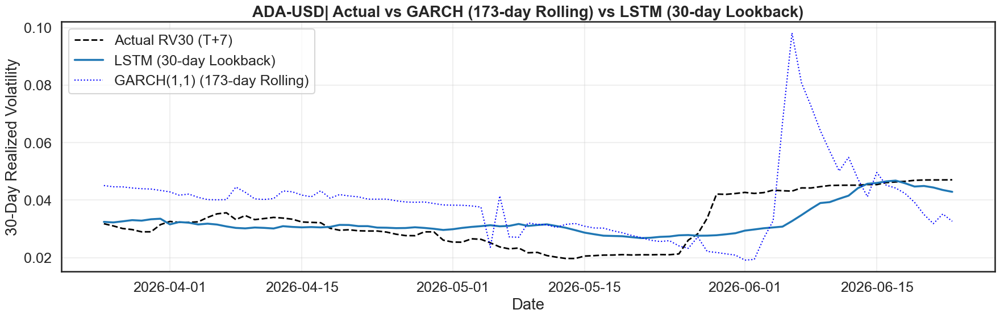

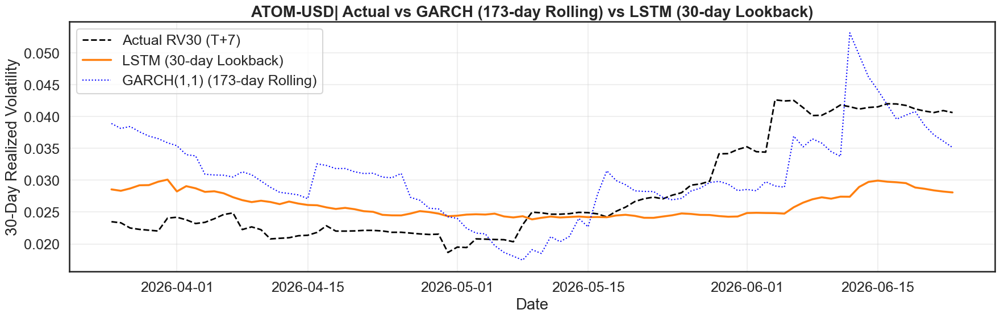

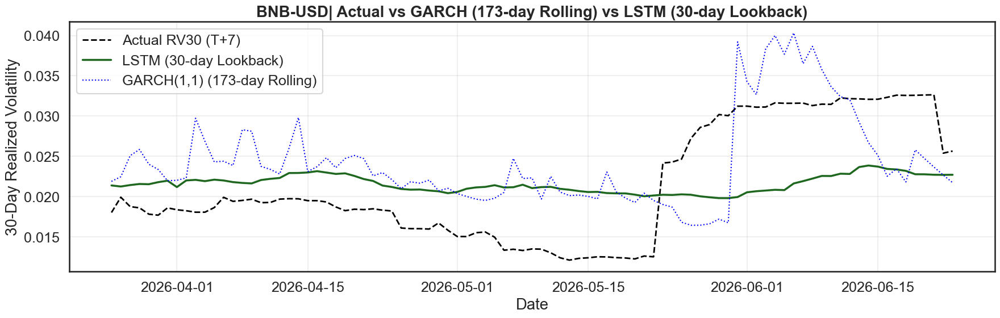

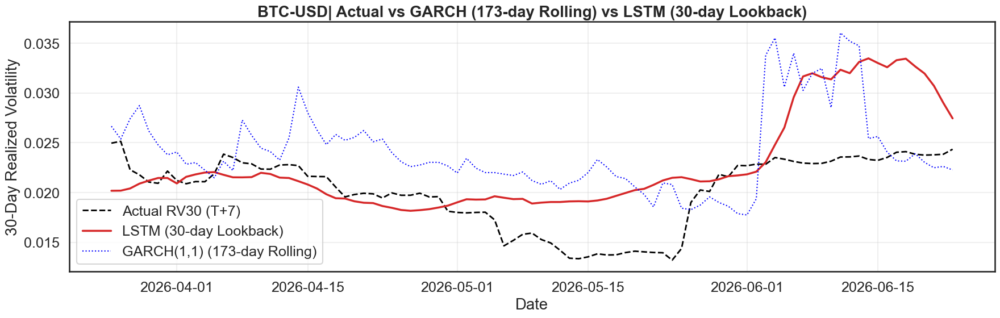

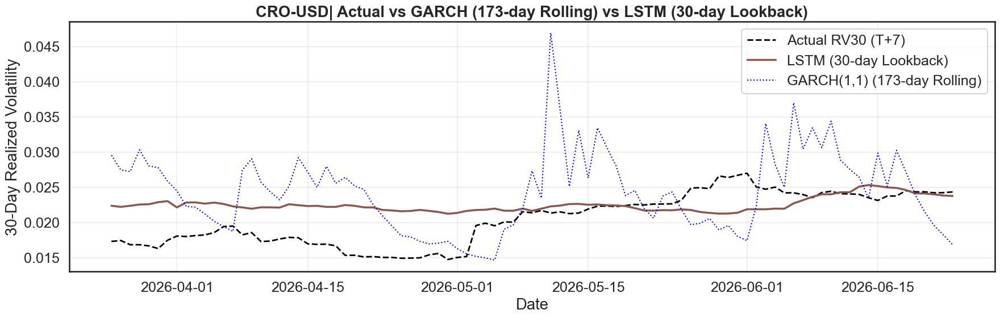

...

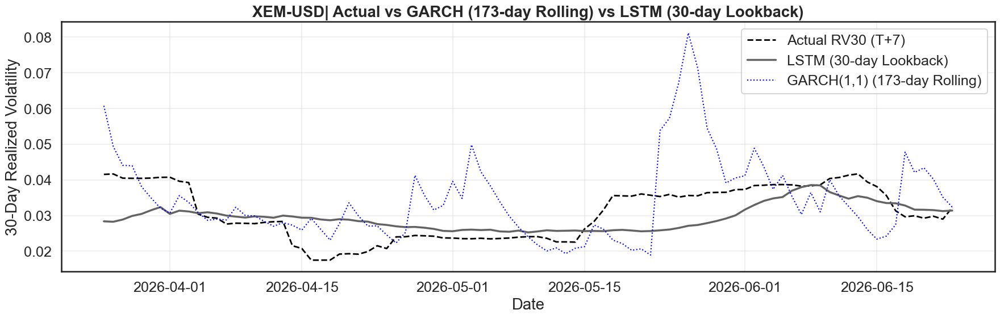

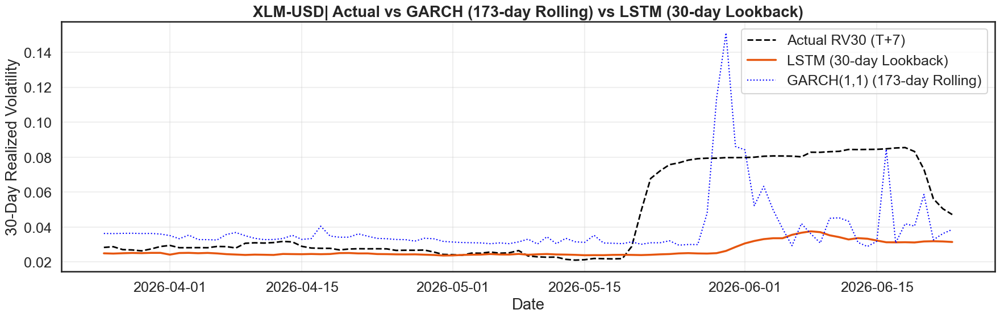

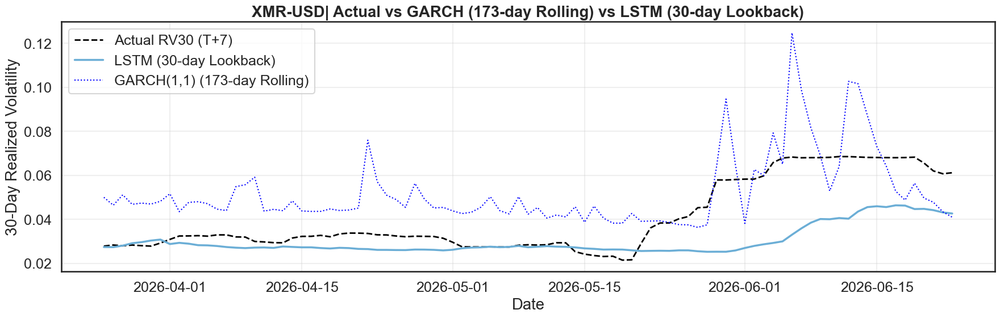

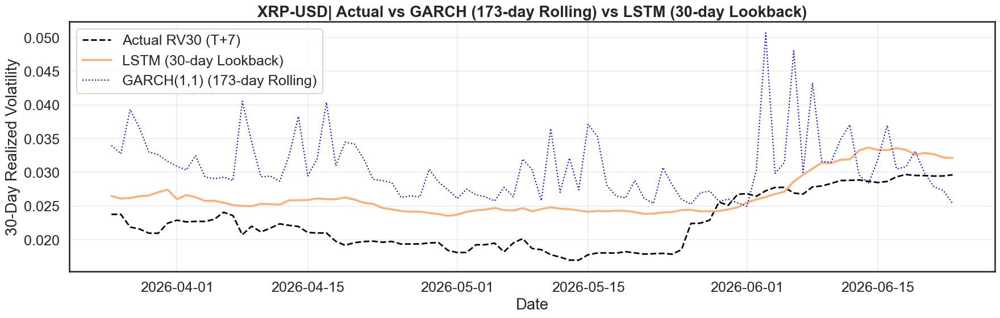

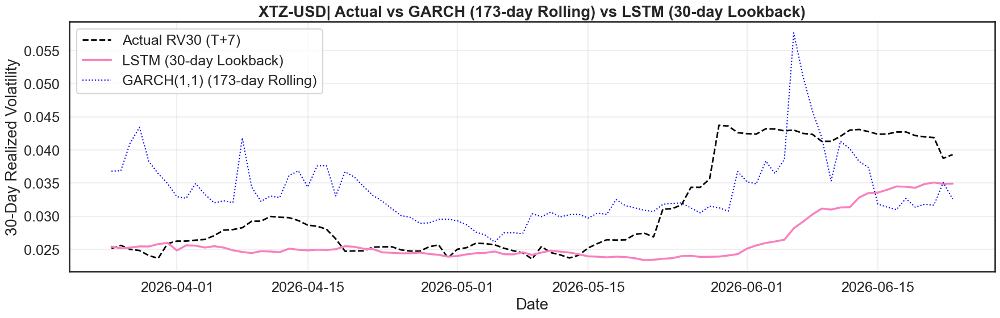

In [87]:
#====================================================
# VISUALIZE 30-DAY LSTM VS GARCH(173) VS ACTUAL
#====================================================

import matplotlib.pyplot as plt
import pandas as pd

#====================================================
# LOAD 30-DAY LSTM PREDICTIONS
#====================================================

prediction_df_30 = prediction_results[30].copy()

#====================================================
# EXTRACT GARCH 173-DAY FORECAST
#====================================================

garch_df = pd.read_csv(
    "garch_forecast_window_173.csv"
)

garch_df["Date"] = pd.to_datetime(garch_df["Date"])

garch_df = garch_df[
    ["Ticker","Date","GARCH_Vol"]
]


#====================================================
# MERGE GARCH FORECAST
#====================================================

prediction_df_30 = (

    prediction_df_30

    .merge(

        garch_df,

        on=[
            "Ticker",
            "Date"
        ],

        how="left"

    )

)

#====================================================
# VISUALIZE EACH COIN
#====================================================

for ticker in sorted(prediction_df_30["Ticker"].unique()):

    coin = (

        prediction_df_30[

            prediction_df_30["Ticker"] == ticker

        ]

        .sort_values("Date")

    )

    plt.figure(figsize=(18,6))

    #==============================================
    # Actual Volatility
    #==============================================

    plt.plot(

        coin["Date"],

        coin["Actual_RV30"],

        color="black",

        linewidth=2,
        
        linestyle="--",

        label="Actual RV30 (T+7)"

    )

    #==============================================
    # LSTM Prediction (30-day Lookback)
    #==============================================

    plt.plot(

        coin["Date"],

        coin["Predicted_RV30"],

        color=colors[ticker],

        linewidth=2.5,

        label="LSTM (30-day Lookback)"

    )

    #==============================================
    # GARCH 173-day Rolling Forecast
    #==============================================

    plt.plot(

        coin["Date"],

        coin["GARCH_Vol"],

        color="blue",

        linestyle=":",

        linewidth=1.5,

        label="GARCH(1,1) (173-day Rolling)"

    )

    plt.title(

        f"{ticker}| Actual vs GARCH (173-day Rolling) vs LSTM (30-day Lookback)",

        fontweight="bold"

    )

    plt.xlabel("Date")

    plt.ylabel("30-Day Realized Volatility")

    plt.grid(alpha=0.3)

    plt.legend()

    plt.tight_layout()

    plt.show()

In [103]:
#====================================================
# EVALUATION METRICS BY CRYPTOCURRENCY
# 30-DAY LOOKBACK LSTM
# HELD-OUT IN-SAMPLE TEST PERIOD
# 01/04/2026 - 30/06/2026
#====================================================

import numpy as np
import pandas as pd

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)


#====================================================
# SETTINGS
#====================================================

LOOKBACK = 30

TEST_START = pd.Timestamp(
    "2026-04-01"
)

TEST_END = pd.Timestamp(
    "2026-06-30"
)


#====================================================
# GET 30-DAY LOOKBACK PREDICTIONS
#====================================================

prediction_df = (

    prediction_results[LOOKBACK]

    .copy()

)


#====================================================
# CONVERT DATE
#====================================================

prediction_df["Date"] = pd.to_datetime(
    prediction_df["Date"]
)


#====================================================
# KEEP HELD-OUT TEST PERIOD
#====================================================

prediction_df = (

    prediction_df[

        (
            prediction_df["Date"]
            >= TEST_START
        )

        &

        (
            prediction_df["Date"]
            <= TEST_END
        )

    ]

    .copy()

)


#====================================================
# REMOVE MISSING VALUES
#====================================================

prediction_df = (

    prediction_df

    .dropna(

        subset=[
            "Actual_RV30",
            "Predicted_RV30"
        ]

    )

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# CHECK DATA
#====================================================

if prediction_df.empty:

    raise ValueError(

        "No valid 30-day LSTM test predictions "
        "were found."

    )


print("=" * 90)
print("30-DAY LOOKBACK LSTM")
print("EVALUATION BY CRYPTOCURRENCY")
print("=" * 90)

print(
    "\nTest period:",
    prediction_df["Date"].min().date(),
    "to",
    prediction_df["Date"].max().date()
)

print(
    "Cryptocurrencies:",
    prediction_df["Ticker"].nunique()
)

print(
    "Total observations:",
    len(prediction_df)
)


#====================================================
# FUNCTION TO CALCULATE METRICS
#====================================================

def calculate_metrics(
    actual,
    predicted
):

    actual = np.asarray(
        actual,
        dtype=float
    )

    predicted = np.asarray(
        predicted,
        dtype=float
    )


    #================================================
    # RMSE
    #================================================

    rmse = np.sqrt(

        mean_squared_error(
            actual,
            predicted
        )

    )


    #================================================
    # MAE
    #================================================

    mae = mean_absolute_error(

        actual,
        predicted

    )


    #================================================
    # MAPE
    #================================================

    epsilon = 1e-12

    valid = (
        np.abs(actual)
        >
        epsilon
    )


    if valid.any():

        mape = np.mean(

            np.abs(

                (
                    actual[valid]
                    -
                    predicted[valid]
                )

                /

                actual[valid]

            )

        ) * 100

    else:

        mape = np.nan


    #================================================
    # QLIKE
    #
    # Lower = better
    #================================================

    actual_variance = np.maximum(

        actual ** 2,

        epsilon

    )


    predicted_variance = np.maximum(

        predicted ** 2,

        epsilon

    )


    qlike = np.mean(

        np.log(
            predicted_variance
        )

        +

        (
            actual_variance
            /
            predicted_variance
        )

    )


    #================================================
    # R-SQUARED
    #================================================

    if (
        len(actual) > 1
        and
        np.var(actual) > 0
    ):

        r2 = r2_score(

            actual,
            predicted

        )

    else:

        r2 = np.nan


    #================================================
    # PEARSON CORRELATION
    #================================================

    if (
        len(actual) > 1
        and
        np.std(actual) > 0
        and
        np.std(predicted) > 0
    ):

        pearson = np.corrcoef(

            actual,
            predicted

        )[0, 1]

    else:

        pearson = np.nan


    #================================================
    # BIAS
    #
    # Predicted - Actual
    #
    # Positive = Overprediction
    # Negative = Underprediction
    #================================================

    bias = np.mean(

        predicted
        -
        actual

    )


    return {

        "RMSE": rmse,

        "MAE": mae,

        "MAPE (%)": mape,

        "QLIKE": qlike,

        "R2": r2,

        "Pearson": pearson,

        "Bias": bias

    }


#====================================================
# CALCULATE METRICS FOR EACH CRYPTOCURRENCY
#====================================================

ticker_results = []


for ticker in sorted(

    prediction_df["Ticker"].unique()

):


    coin = (

        prediction_df[

            prediction_df["Ticker"]
            ==
            ticker

        ]

        .copy()

    )


    #================================================
    # CALCULATE METRICS
    #================================================

    metrics = calculate_metrics(

        coin["Actual_RV30"],

        coin["Predicted_RV30"]

    )


    #================================================
    # STORE INFORMATION
    #================================================

    metrics["Ticker"] = ticker

    metrics["Observations"] = len(
        coin
    )

    metrics["Mean_Actual_RV30"] = (

        coin["Actual_RV30"]

        .mean()

    )

    metrics["Mean_Predicted_RV30"] = (

        coin["Predicted_RV30"]

        .mean()

    )


    ticker_results.append(
        metrics
    )


#====================================================
# CREATE RESULTS DATAFRAME
#====================================================

in_sample_metrics_by_ticker = pd.DataFrame(

    ticker_results

)


#====================================================
# REORDER COLUMNS
#====================================================

in_sample_metrics_by_ticker = (

    in_sample_metrics_by_ticker[

        [
            "Ticker",
            "Observations",
            "RMSE",
            "MAE",
            "MAPE (%)",
            "QLIKE",
            "R2",
            "Pearson",
            "Bias",
            "Mean_Actual_RV30",
            "Mean_Predicted_RV30"
        ]

    ]

)


#====================================================
# SORT BY RMSE
#
# Lowest RMSE = Best
#====================================================

in_sample_metrics_by_ticker = (

    in_sample_metrics_by_ticker

    .sort_values(
        "RMSE"
    )

    .reset_index(drop=True)

)


#====================================================
# ADD RMSE RANK
#====================================================

in_sample_metrics_by_ticker.insert(

    0,

    "RMSE_Rank",

    range(
        1,
        len(in_sample_metrics_by_ticker) + 1
    )

)


#====================================================
# PRINT RESULTS
#====================================================

print("\n" + "=" * 120)

print(
    "30-DAY LOOKBACK LSTM - "
    "EVALUATION METRICS BY CRYPTOCURRENCY"
)

print("=" * 120)


print(

    in_sample_metrics_by_ticker

    .round(6)

    .to_string(index=False)

)


#====================================================
# SAVE RESULTS
#====================================================

in_sample_metrics_by_ticker.to_csv(

    "LSTM_30Day_InSample_Metrics_By_Ticker.csv",

    index=False

)


print("\n" + "=" * 90)

print(
    "Saved:"
    " LSTM_30Day_InSample_Metrics_By_Ticker.csv"
)

print("=" * 90)

30-DAY LOOKBACK LSTM
EVALUATION BY CRYPTOCURRENCY

Test period: 2026-04-01 to 2026-06-23
Cryptocurrencies: 24
Total observations: 2016

30-DAY LOOKBACK LSTM - EVALUATION METRICS BY CRYPTOCURRENCY
 RMSE_Rank    Ticker  Observations     RMSE      MAE   MAPE (%)     QLIKE         R2   Pearson      Bias  Mean_Actual_RV30  Mean_Predicted_RV30
         1  LINK-USD            84 0.003585 0.003037  11.035999 -6.157765   0.041697  0.502771  0.000231          0.027700             0.027931
         2   VET-USD            84 0.003755 0.002654   7.890105 -5.927730   0.387872  0.773538 -0.002131          0.031172             0.029041
         3   CRO-USD            84 0.003804 0.002982  16.593163 -6.718711  -0.109964  0.356513  0.001738          0.020735             0.022474
         4   XRP-USD            84 0.004595 0.004226  20.578135 -6.556137  -0.220339  0.854689  0.004032          0.022433             0.026465
         5   BTC-USD            84 0.004856 0.003684  19.767789 -6.791247  -0.827975

In [104]:
#====================================================
# DIRECTIONAL CLASSIFICATION EVALUATION
# BY CRYPTOCURRENCY
# 30-DAY LOOKBACK LSTM
# HELD-OUT IN-SAMPLE TEST PERIOD
#
# Positive Class:
# 1 = RV_30 increases over the 7-day forecast horizon
#
# Negative Class:
# 0 = RV_30 does not increase
#====================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    confusion_matrix
)


#====================================================
# CREATE COPY OF TEST PREDICTIONS
#====================================================

direction_df = prediction_df.copy()


#====================================================
# CREATE FORECAST ORIGIN DATE
#
# Target Date = t + 7
# Origin Date = t
#====================================================

direction_df["Origin_Date"] = (

    direction_df["Date"]

    -

    pd.Timedelta(days=7)

)


#====================================================
# GET ACTUAL RV_30 AT FORECAST ORIGIN
#
# master_df contains historical realised volatility
#====================================================

origin_rv = (

    master_df[
        [
            "Date",
            "Ticker",
            "RV_30"
        ]
    ]

    .copy()

)


origin_rv["Date"] = pd.to_datetime(
    origin_rv["Date"]
)


#====================================================
# RENAME COLUMNS FOR MERGE
#====================================================

origin_rv = (

    origin_rv

    .rename(
        columns={
            "Date": "Origin_Date",
            "RV_30": "Origin_RV30"
        }
    )

)


#====================================================
# MERGE ORIGIN RV30 WITH TEST PREDICTIONS
#====================================================

direction_df = (

    direction_df

    .merge(

        origin_rv,

        on=[
            "Origin_Date",
            "Ticker"
        ],

        how="left"

    )

)


#====================================================
# REMOVE MISSING VALUES
#====================================================

direction_df = (

    direction_df

    .dropna(

        subset=[
            "Origin_RV30",
            "Actual_RV30",
            "Predicted_RV30"
        ]

    )

    .copy()

)


#====================================================
# ACTUAL DIRECTION
#
# 1 = Actual RV30 at t+7 > RV30 at t
# 0 = Actual RV30 at t+7 <= RV30 at t
#====================================================

direction_df["Actual_Direction"] = (

    direction_df["Actual_RV30"]

    >

    direction_df["Origin_RV30"]

).astype(int)


#====================================================
# PREDICTED DIRECTION
#
# 1 = Predicted RV30 at t+7 > RV30 at t
# 0 = Predicted RV30 at t+7 <= RV30 at t
#====================================================

direction_df["Predicted_Direction"] = (

    direction_df["Predicted_RV30"]

    >

    direction_df["Origin_RV30"]

).astype(int)


#====================================================
# CHECK CLASS DISTRIBUTION
#====================================================

print("\n" + "=" * 100)

print(
    "30-DAY LSTM - DIRECTIONAL CLASS DISTRIBUTION"
)

print("=" * 100)


print(

    pd.crosstab(

        direction_df["Actual_Direction"],

        direction_df["Predicted_Direction"],

        rownames=[
            "Actual"
        ],

        colnames=[
            "Predicted"
        ],

        margins=True

    )

)


#====================================================
# CALCULATE DIRECTIONAL METRICS
# BY CRYPTOCURRENCY
#====================================================

direction_results = []


for ticker in sorted(

    direction_df["Ticker"].unique()

):


    #================================================
    # EXTRACT CRYPTOCURRENCY
    #================================================

    coin = (

        direction_df[

            direction_df["Ticker"]
            ==
            ticker

        ]

        .copy()

    )


    #================================================
    # ACTUAL AND PREDICTED CLASSES
    #================================================

    y_true = coin[
        "Actual_Direction"
    ].values


    y_pred = coin[
        "Predicted_Direction"
    ].values


    #================================================
    # CONFUSION MATRIX
    #
    # TN = Correctly predicted no increase
    # FP = Predicted increase but actual no increase
    # FN = Predicted no increase but actual increase
    # TP = Correctly predicted increase
    #================================================

    cm = confusion_matrix(

        y_true,

        y_pred,

        labels=[
            0,
            1
        ]

    )


    tn, fp, fn, tp = cm.ravel()


    #================================================
    # ACCURACY
    #================================================

    accuracy = accuracy_score(

        y_true,

        y_pred

    )


    #================================================
    # PRECISION
    #
    # Of predicted volatility increases,
    # how many actually increased?
    #================================================

    precision = precision_score(

        y_true,

        y_pred,

        zero_division=0

    )


    #================================================
    # RECALL / SENSITIVITY
    #
    # Of actual volatility increases,
    # how many were correctly identified?
    #================================================

    recall = recall_score(

        y_true,

        y_pred,

        zero_division=0

    )


    #================================================
    # F1-SCORE
    #================================================

    f1 = f1_score(

        y_true,

        y_pred,

        zero_division=0

    )


    #================================================
    # SPECIFICITY
    #
    # Ability to identify no-increase cases
    #================================================

    if (tn + fp) > 0:

        specificity = (

            tn
            /
            (tn + fp)

        )

    else:

        specificity = np.nan


    #================================================
    # BALANCED ACCURACY
    #
    # Average of Recall and Specificity
    #================================================

    balanced_accuracy = (

        recall
        +
        specificity

    ) / 2


    #================================================
    # ACTUAL POSITIVE RATE
    #
    # Proportion of observations where
    # volatility actually increased
    #================================================

    actual_positive_rate = (

        np.mean(
            y_true
        )

    )


    #================================================
    # PREDICTED POSITIVE RATE
    #
    # Proportion of observations where
    # LSTM predicted an increase
    #================================================

    predicted_positive_rate = (

        np.mean(
            y_pred
        )

    )


    #================================================
    # STORE RESULTS
    #================================================

    direction_results.append(

        {

            "Ticker":
                ticker,

            "Observations":
                len(coin),

            "Accuracy":
                accuracy,

            "Precision":
                precision,

            "Recall":
                recall,

            "Specificity":
                specificity,

            "F1_Score":
                f1,

            "Balanced_Accuracy":
                balanced_accuracy,

            "Actual_Increase_Rate":
                actual_positive_rate,

            "Predicted_Increase_Rate":
                predicted_positive_rate,

            "TN":
                tn,

            "FP":
                fp,

            "FN":
                fn,

            "TP":
                tp

        }

    )


#====================================================
# CREATE RESULTS DATAFRAME
#====================================================

in_sample_direction_by_ticker = pd.DataFrame(

    direction_results

)


#====================================================
# SORT BY F1-SCORE
#====================================================

in_sample_direction_by_ticker = (

    in_sample_direction_by_ticker

    .sort_values(

        "F1_Score",

        ascending=False

    )

    .reset_index(
        drop=True
    )

)


#====================================================
# PRINT RESULTS
#====================================================

print("\n" + "=" * 140)

print(
    "30-DAY LOOKBACK LSTM - "
    "DIRECTIONAL CLASSIFICATION METRICS "
    "BY CRYPTOCURRENCY"
)

print("=" * 140)


print(

    in_sample_direction_by_ticker

    .round(4)

    .to_string(
        index=False
    )

)


#====================================================
# OVERALL DIRECTIONAL PERFORMANCE
#====================================================

overall_y_true = (

    direction_df[
        "Actual_Direction"
    ].values

)


overall_y_pred = (

    direction_df[
        "Predicted_Direction"
    ].values

)


overall_cm = confusion_matrix(

    overall_y_true,

    overall_y_pred,

    labels=[
        0,
        1
    ]

)


overall_tn, overall_fp, overall_fn, overall_tp = (

    overall_cm.ravel()

)


#====================================================
# OVERALL SPECIFICITY
#====================================================

if (
    overall_tn
    +
    overall_fp
) > 0:

    overall_specificity = (

        overall_tn

        /

        (
            overall_tn
            +
            overall_fp
        )

    )

else:

    overall_specificity = np.nan


#====================================================
# OVERALL METRICS
#====================================================

overall_accuracy = accuracy_score(

    overall_y_true,

    overall_y_pred

)


overall_precision = precision_score(

    overall_y_true,

    overall_y_pred,

    zero_division=0

)


overall_recall = recall_score(

    overall_y_true,

    overall_y_pred,

    zero_division=0

)


overall_f1 = f1_score(

    overall_y_true,

    overall_y_pred,

    zero_division=0

)


overall_balanced_accuracy = (

    overall_recall
    +
    overall_specificity

) / 2


#====================================================
# CREATE OVERALL RESULTS TABLE
#====================================================

overall_direction_metrics = pd.DataFrame(

    {

        "Metric": [

            "Accuracy",

            "Precision",

            "Recall",

            "Specificity",

            "F1-Score",

            "Balanced Accuracy"

        ],

        "Value": [

            overall_accuracy,

            overall_precision,

            overall_recall,

            overall_specificity,

            overall_f1,

            overall_balanced_accuracy

        ]

    }

)


#====================================================
# PRINT OVERALL RESULTS
#====================================================

print("\n" + "=" * 80)

print(
    "OVERALL 30-DAY LSTM DIRECTIONAL PERFORMANCE"
)

print("=" * 80)


print(

    overall_direction_metrics

    .round(4)

    .to_string(
        index=False
    )

)


print("\nConfusion Matrix:")

print(
    overall_cm
)


print(
    f"\nTrue Negatives  (TN): {overall_tn}"
)

print(
    f"False Positives (FP): {overall_fp}"
)

print(
    f"False Negatives (FN): {overall_fn}"
)

print(
    f"True Positives  (TP): {overall_tp}"
)


#====================================================
# SAVE RESULTS
#====================================================

in_sample_direction_by_ticker.to_csv(

    "LSTM_30Day_InSample_Directional_Metrics_By_Ticker.csv",

    index=False

)


overall_direction_metrics.to_csv(

    "LSTM_30Day_InSample_Overall_Directional_Metrics.csv",

    index=False

)


direction_df.to_csv(

    "LSTM_30Day_InSample_Directional_Predictions.csv",

    index=False

)


print("\n" + "=" * 80)

print("FILES SAVED")

print("=" * 80)


print(
    "LSTM_30Day_InSample_Directional_Metrics_By_Ticker.csv"
)

print(
    "LSTM_30Day_InSample_Overall_Directional_Metrics.csv"
)

print(
    "LSTM_30Day_InSample_Directional_Predictions.csv"
)


30-DAY LSTM - DIRECTIONAL CLASS DISTRIBUTION
Predicted     0     1   All
Actual                     
0           560   400   960
1           455   601  1056
All        1015  1001  2016

30-DAY LOOKBACK LSTM - DIRECTIONAL CLASSIFICATION METRICS BY CRYPTOCURRENCY
   Ticker  Observations  Accuracy  Precision  Recall  Specificity  F1_Score  Balanced_Accuracy  Actual_Increase_Rate  Predicted_Increase_Rate  TN  FP  FN  TP
  VET-USD            84    0.8333     0.9459  0.7447       0.9459    0.8333             0.8453                0.5595                   0.4405  35   2  12  35
  XEM-USD            84    0.7976     0.8500  0.7556       0.8462    0.8000             0.8009                0.5357                   0.4762  33   6  11  34
  BTC-USD            84    0.7976     0.7273  0.8649       0.7447    0.7901             0.8048                0.4405                   0.5238  35  12   5  32
  CRO-USD            84    0.6190     0.6719  0.7963       0.3000    0.7288             0.5481           

In [88]:
#====================================================
# FORECAST ERROR BY CRYPTOCURRENCY
# 30 / 60 / 90 DAY LOOKBACK
#====================================================

import numpy as np
import pandas as pd

forecast_error_tables = {}

for lookback in [30, 60, 90]:

    print("\n")
    print("="*80)
    print(f"{lookback}-DAY LOOKBACK")
    print("="*80)

    prediction_df = prediction_results[lookback].copy()

    #================================================
    # CALCULATE ERRORS
    #================================================

    prediction_df["Forecast_Error"] = (

        prediction_df["Actual_RV30"]

        -

        prediction_df["Predicted_RV30"]

    )

    prediction_df["Absolute_Error"] = (

        prediction_df["Forecast_Error"]

        .abs()

    )

    prediction_df["Squared_Error"] = (

        prediction_df["Forecast_Error"] ** 2

    )

    prediction_df["Percentage_Error"] = (

        prediction_df["Forecast_Error"]

        /

        prediction_df["Actual_RV30"]

    ) * 100

    #================================================
    # SUMMARIZE BY CRYPTOCURRENCY
    #================================================

    error_table = (

        prediction_df

        .groupby("Ticker")

        .agg(

            Mean_Error=(

                "Forecast_Error",

                "mean"

            ),

            Mean_Absolute_Error=(

                "Absolute_Error",

                "mean"

            ),

            RMSE=(

                "Squared_Error",

                lambda x: np.sqrt(np.mean(x))

            ),

            Std_Error=(

                "Forecast_Error",

                "std"

            ),

            Max_Error=(

                "Forecast_Error",

                "max"

            ),

            Min_Error=(

                "Forecast_Error",

                "min"

            ),

            Mean_Percentage_Error=(

                "Percentage_Error",

                "mean"

            ),

            Mean_Actual=(

                "Actual_RV30",

                "mean"

            ),

            Mean_Predicted=(

                "Predicted_RV30",

                "mean"

            ),

            Observations=(

                "Ticker",

                "count"

            )

        )

        .reset_index()

    )

    forecast_error_tables[lookback] = error_table

    print(

        error_table

        .round(6)

        .to_string(index=False)

    )

    #================================================
    # SAVE RESULTS
    #================================================

    error_table.to_csv(

        f"LSTM_Forecast_Error_{lookback}Day.csv",

        index=False

    )

    print(
        f"\nSaved: LSTM_Forecast_Error_{lookback}Day.csv"
    )



30-DAY LOOKBACK
   Ticker  Mean_Error  Mean_Absolute_Error     RMSE  Std_Error  Max_Error  Min_Error  Mean_Percentage_Error  Mean_Actual  Mean_Predicted  Observations
  ADA-USD   -0.000114             0.004862 0.006189   0.006222   0.014310  -0.010864              -5.099466     0.032487        0.032601            91
 ATOM-USD    0.001914             0.006195 0.007674   0.007473   0.017781  -0.007738               0.841764     0.028041        0.026128            91
  BNB-USD   -0.000195             0.006235 0.006841   0.006876   0.011274  -0.008730             -11.773912     0.021373        0.021568            91
  BTC-USD   -0.002552             0.003553 0.004727   0.004001   0.004956  -0.010161             -14.360648     0.020105        0.022657            91
  CRO-USD   -0.002035             0.003183 0.003973   0.003431   0.005350  -0.007138             -13.303802     0.020445        0.022480            91
 DASH-USD    0.027643             0.027643 0.029784   0.011149   0.046158   

In [89]:
#====================================================
# FORECAST BIAS BY CRYPTOCURRENCY
# 30 / 60 / 90 DAY LOOKBACK
#====================================================

import pandas as pd
import numpy as np

forecast_bias_tables = {}

for lookback in [30, 60, 90]:

    print("\n")
    print("="*80)
    print(f"{lookback}-DAY LOOKBACK")
    print("="*80)

    prediction_df = prediction_results[lookback].copy()

    #================================================
    # CALCULATE FORECAST ERRORS
    #================================================

    prediction_df["Forecast_Error"] = (

        prediction_df["Actual_RV30"]

        -

        prediction_df["Predicted_RV30"]

    )

    prediction_df["Absolute_Error"] = (

        prediction_df["Forecast_Error"]

        .abs()

    )

    #================================================
    # FORECAST BIAS TABLE
    #================================================

    forecast_bias_df = (

        prediction_df

        .groupby("Ticker")

        .agg(

            Mean_Error=(

                "Forecast_Error",

                "mean"

            ),

            Mean_Absolute_Error=(

                "Absolute_Error",

                "mean"

            ),

            Bias=(

                "Forecast_Error",

                lambda x: np.mean(x)

            ),

            Bias_Percentage=(

                "Forecast_Error",

                lambda x:
                100 * np.mean(x)

            ),

            Actual_Mean=(

                "Actual_RV30",

                "mean"

            ),

            Predicted_Mean=(

                "Predicted_RV30",

                "mean"

            ),

            Std_Error=(

                "Forecast_Error",

                "std"

            ),

            Max_Overprediction=(

                "Forecast_Error",

                "min"

            ),

            Max_Underprediction=(

                "Forecast_Error",

                "max"

            ),

            Observations=(

                "Ticker",

                "count"

            )

        )

        .reset_index()

        .sort_values(

            "Mean_Absolute_Error"

        )

    )

    forecast_bias_tables[lookback] = forecast_bias_df

    print(

        forecast_bias_df

        .round(6)

        .to_string(index=False)

    )

    #================================================
    # SAVE
    #================================================

    forecast_bias_df.to_csv(

        f"LSTM_Forecast_Bias_{lookback}Day.csv",

        index=False

    )

    print(

        f"\nSaved: LSTM_Forecast_Bias_{lookback}Day.csv"

    )



30-DAY LOOKBACK
   Ticker  Mean_Error  Mean_Absolute_Error      Bias  Bias_Percentage  Actual_Mean  Predicted_Mean  Std_Error  Max_Overprediction  Max_Underprediction  Observations
  VET-USD    0.001698             0.002719  0.001698         0.169812     0.030824        0.029126   0.003358           -0.004932             0.011953            91
 LINK-USD   -0.000168             0.002899 -0.000168        -0.016758     0.027747        0.027915   0.003487           -0.005744             0.006707            91
  CRO-USD   -0.002035             0.003183 -0.002035        -0.203483     0.020445        0.022480   0.003431           -0.007138             0.005350            91
  BTC-USD   -0.002552             0.003553 -0.002552        -0.255197     0.020105        0.022657   0.004001           -0.010161             0.004956            91
  ETH-USD   -0.001834             0.003941 -0.001834        -0.183417     0.027345        0.029179   0.005208           -0.011942             0.006817       

SHAP

In [90]:
#====================================================
# SHAP ANALYSIS
# FINAL 30-DAY LSTM MODEL
#====================================================

import shap
import joblib
import torch
import torch.nn as nn
import numpy as np

#====================================================
# LOAD SAVED SCALER / IMPUTER
#====================================================

final_scaler = joblib.load(
    "Final_LSTM_Scaler.pkl"
)

final_imputer = joblib.load(
    "Final_LSTM_Imputer.pkl"
)

#====================================================
# LOAD FINAL 30-DAY MODEL
#====================================================

lookback = 30

params = (

    window_comparison_df

    .loc[
        window_comparison_df["Lookback_Days"] == lookback
    ]

    .iloc[0]

)

hidden_size = int(params["Hidden_Size"])
num_layers = int(params["Num_Layers"])
dropout = float(params["Dropout"])

model = HybridLSTM(

    input_size=len(feature_columns),

    hidden_size=hidden_size,

    num_layers=num_layers,

    dropout=dropout

).to(device)

model.load_state_dict(

    torch.load(

        "Final_LSTM_30Day.pth",

        map_location=device

    )

)

model.eval()

print("30-Day LSTM Loaded.")

30-Day LSTM Loaded.


In [91]:
#====================================================
# CREATE TRAIN SEQUENCES
#====================================================

X_train, y_train, _, _ = create_sequences(

    target_df=final_train_df,

    feature_columns=feature_columns,

    target_column=TARGET,

    lookback=30,

    history_df=None,

    require_target=True

)

#====================================================
# CREATE TEST SEQUENCES
#====================================================

X_test, y_test, _, _ = create_sequences(

    target_df=final_test_df,

    feature_columns=feature_columns,

    target_column=TARGET,

    lookback=30,

    history_df=final_train_df,

    require_target=True

)

print(X_train.shape)
print(X_test.shape)

(45264, 30, 287)
(2184, 30, 287)


In [92]:
#====================================================
# SHAP WRAPPER
#====================================================

class SHAPLSTMWrapper(nn.Module):

    def __init__(self, model):

        super().__init__()

        self.model = model

    def forward(self, x):

        output = self.model(x)

        if output.ndim == 1:

            output = output.unsqueeze(1)

        return output

shap_model = SHAPLSTMWrapper(model).to(device)

shap_model.eval()

SHAPLSTMWrapper(
  (model): HybridLSTM(
    (lstm): LSTM(287, 256, num_layers=2, batch_first=True, dropout=0.1)
    (dropout): Dropout(p=0.1, inplace=False)
    (fc1): Linear(in_features=256, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=32, bias=True)
    (output): Linear(in_features=32, out_features=1, bias=True)
    (softplus): Softplus(beta=1.0, threshold=20.0)
    (relu): ReLU()
  )
)

In [93]:
#====================================================
# RANDOM SAMPLE
#====================================================

SEED = 2021

rng = np.random.default_rng(SEED)

BACKGROUND_SIZE = min(100, len(X_train))

EXPLAIN_SIZE = min(500, len(X_test))

background_idx = rng.choice(

    len(X_train),

    BACKGROUND_SIZE,

    replace=False

)

explain_idx = rng.choice(

    len(X_test),

    EXPLAIN_SIZE,

    replace=False

)

background = torch.tensor(

    X_train[background_idx],

    dtype=torch.float32,

    device=device

)

X_explain = torch.tensor(

    X_test[explain_idx],

    dtype=torch.float32,

    device=device

)

print(background.shape)

print(X_explain.shape)

torch.Size([100, 30, 287])
torch.Size([500, 30, 287])


In [94]:
#====================================================
# SHAP VALUES
#====================================================

explainer = shap.GradientExplainer(

    shap_model,

    background

)

shap_values = explainer.shap_values(

    X_explain

)

print(type(shap_values))

<class 'numpy.ndarray'>


In [95]:
#====================================================
# AVERAGE OVER TIME
#====================================================

if isinstance(shap_values, list):

    shap_values = shap_values[0]

shap_importance = np.mean(

    np.abs(shap_values),

    axis=1

)

print(shap_importance.shape)

(500, 287, 1)


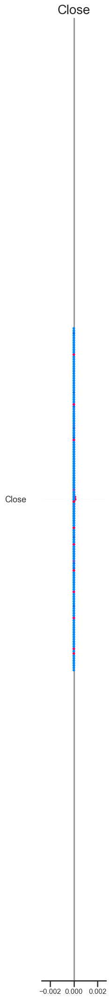

In [96]:
#====================================================
# SHAP SUMMARY
#====================================================

feature_values = np.mean(

    X_test[explain_idx],

    axis=1

)

shap.summary_plot(

    shap_importance,

    feature_values,

    feature_names=feature_columns,

    max_display=25

)

In [97]:
#====================================================
# SAVE FEATURE IMPORTANCE
#====================================================

importance = np.mean(

    np.abs(shap_values),

    axis=(0,1,3)

)

importance_df = (

    pd.DataFrame({

        "Feature": feature_columns,

        "Mean_SHAP": importance

    })

    .sort_values(

        "Mean_SHAP",

        ascending=False

    )

)

importance_df.to_csv(

    "SHAP_Importance_30Day.csv",

    index=False

)

print(importance_df.head(20))

                      Feature  Mean_SHAP
31                 SP500_MA30   0.000177
266  Yen_Deleveraging_Cascade   0.000144
34              DowJones_MA30   0.000121
267                  Iran_War   0.000120
243                  BTC_126K   0.000111
265           Warsh_Fed_Shock   0.000105
57             GARCH_Vol_Lag1   0.000097
8                   GARCH_Vol   0.000095
96                       Year   0.000090
27                   DowJones   0.000083
26                      SP500   0.000082
7                       RV_30   0.000081
30               SP500_Return   0.000074
264   SEC_CFTC_Project_Crypto   0.000072
244       US_China_100_Tariff   0.000070
11                   RSI(200)   0.000070
54                 RV_30_Lag1   0.000067
55                 RV_30_Lag4   0.000066
229                 WLFI_USD1   0.000064
56                 RV_30_Lag7   0.000062


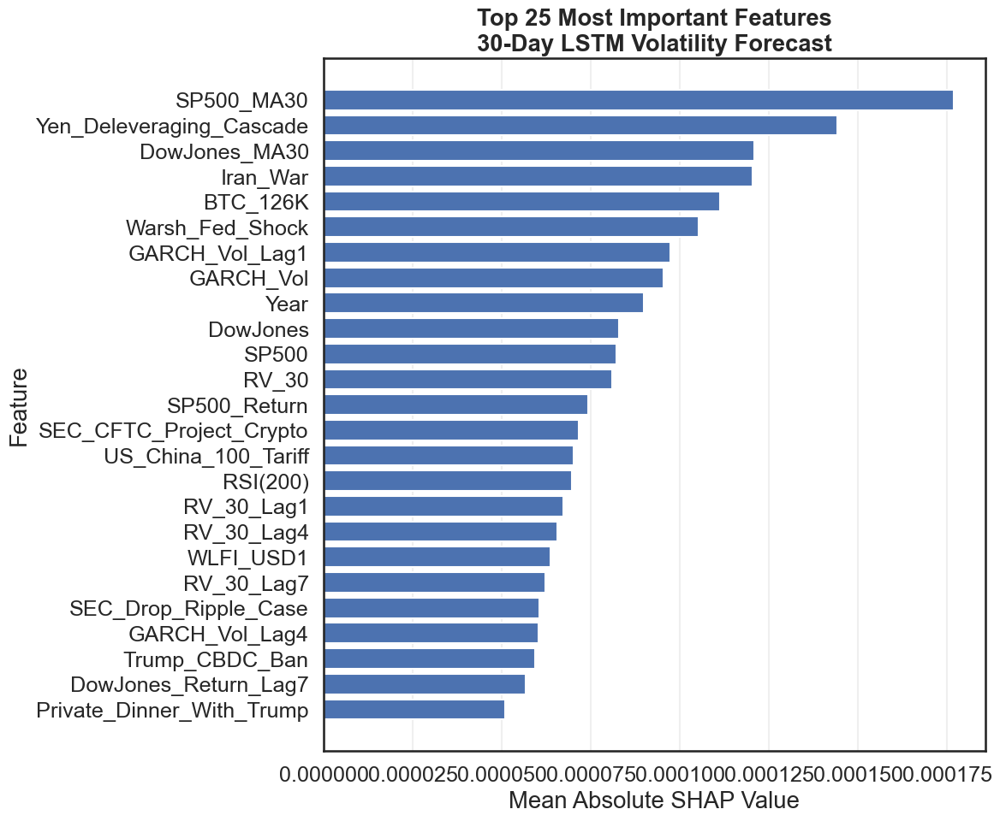

In [98]:
#====================================================
# VISUALIZE SHAP FEATURE IMPORTANCE
# FINAL 90-DAY LSTM
#====================================================

import pandas as pd
import matplotlib.pyplot as plt

#====================================================
# LOAD SHAP IMPORTANCE
#====================================================

importance_df = pd.read_csv(
    "SHAP_Importance_30Day.csv"
)

#====================================================
# SORT FEATURES
#====================================================

importance_df = (

    importance_df

    .sort_values(
        "Mean_SHAP",
        ascending=False
    )

)

#====================================================
# TOP FEATURES
#====================================================

top_features = importance_df.head(25)

#====================================================
# BAR CHART
#====================================================

plt.figure(figsize=(12,10))

plt.barh(

    top_features["Feature"],

    top_features["Mean_SHAP"]

)

plt.gca().invert_yaxis()

plt.xlabel(
    "Mean Absolute SHAP Value"
)

plt.ylabel(
    "Feature"
)

plt.title(

    "Top 25 Most Important Features\n"
    "30-Day LSTM Volatility Forecast",

    fontweight="bold"

)

plt.grid(
    alpha=0.3,
    axis="x"
)

plt.tight_layout()

plt.show()

In [99]:
#====================================================
# SHAP IMPORTANCE (%)
#====================================================

importance_df["Importance (%)"] = (

    importance_df["Mean_SHAP"]

    /

    importance_df["Mean_SHAP"].sum()

) * 100

print(

    importance_df.head(20)

)

                     Feature  Mean_SHAP  Importance (%)
0                 SP500_MA30   0.000177        3.471102
1   Yen_Deleveraging_Cascade   0.000144        2.829888
2              DowJones_MA30   0.000121        2.371409
3                   Iran_War   0.000120        2.364776
4                   BTC_126K   0.000111        2.183143
5            Warsh_Fed_Shock   0.000105        2.067390
6             GARCH_Vol_Lag1   0.000097        1.911027
7                  GARCH_Vol   0.000095        1.873662
8                       Year   0.000090        1.763957
9                   DowJones   0.000083        1.628961
10                     SP500   0.000082        1.611647
11                     RV_30   0.000081        1.590991
12              SP500_Return   0.000074        1.458188
13   SEC_CFTC_Project_Crypto   0.000072        1.405966
14       US_China_100_Tariff   0.000070        1.377880
15                  RSI(200)   0.000070        1.365194
16                RV_30_Lag1   0.000067        1

**Out-of-sample**

In [100]:
#====================================================
# FUTURE LSTM PREDICTION
# 90-DAY LOOKBACK
#
# GENERATE:
# 01/07/2026 - 15/08/2026
#
# THEN:
# 1. Merge with existing LSTM_Predictions_90Day.csv
# 2. Add Actual RV_30
# 3. Save as NEW file
#====================================================

import pandas as pd
import numpy as np
import torch
import os


#====================================================
# SETTINGS
#====================================================

LOOKBACK = 30

FUTURE_START = pd.Timestamp(
    "2026-07-01"
)

FUTURE_END = pd.Timestamp(
    "2026-08-15"
)

EXISTING_FILE = (
    "LSTM_Predictions_30Day.csv"
)

NEW_OUTPUT_FILE = (
    "LSTM_Predictions_30Day_Updated.csv"
)


#====================================================
# SELECT FINAL 90-DAY MODEL
#====================================================

model = final_models[LOOKBACK]

model.eval()


print("\n" + "=" * 80)
print("GENERATE FUTURE LSTM PREDICTIONS")
print("=" * 80)

print(
    f"Lookback: {LOOKBACK} days"
)

print(
    f"Target period: "
    f"{FUTURE_START.date()} "
    f"to {FUTURE_END.date()}"
)


#====================================================
# CREATE HISTORY
#
# Need observations before future period so the
# first future sequence has a complete 90-day window.
#====================================================

future_history_df = (

    pd.concat(

        [
            final_train_df,
            final_test_df
        ],

        ignore_index=True

    )

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# CREATE FUTURE SEQUENCES
#====================================================

(
    X_future,
    y_future,
    future_dates,
    future_tickers

) = create_sequences(

    target_df=final_future_df,

    feature_columns=feature_columns,

    target_column=TARGET,

    lookback=LOOKBACK,

    history_df=future_history_df,

    require_target=False

)


print(
    "\nFuture sequence shape:",
    X_future.shape
)


#====================================================
# CHECK
#====================================================

if len(X_future) == 0:

    raise ValueError(

        "No future sequences were created. "
        "Check final_future_df and history data."

    )


#====================================================
# CONVERT TO TENSOR
#====================================================

X_future_tensor = torch.tensor(

    X_future,

    dtype=torch.float32,

    device=device

)


#====================================================
# GENERATE PREDICTIONS
#====================================================

with torch.no_grad():

    future_predictions = (

        model(
            X_future_tensor
        )

        .detach()

        .cpu()

        .numpy()

        .reshape(-1)

    )


print(
    "Predictions generated:",
    len(future_predictions)
)


#====================================================
# CREATE FUTURE PREDICTION DATAFRAME
#
# future_dates from create_sequences represents
# forecast-origin date.
#====================================================

future_prediction_df = pd.DataFrame({

    "Ticker":
        future_tickers,

    "Forecast_Date":
        pd.to_datetime(
            future_dates
        ),

    "Predicted_RV30":
        future_predictions

})


#====================================================
# CREATE FORECAST DATE -> TARGET DATE MAP
#====================================================

target_date_map = (

    future_df[
        [
            "Ticker",
            "Date",
            "Target_Date"
        ]
    ]

    .copy()

)


target_date_map["Date"] = pd.to_datetime(

    target_date_map["Date"]

)


target_date_map["Target_Date"] = pd.to_datetime(

    target_date_map["Target_Date"]

)


target_date_map = (

    target_date_map

    .rename(

        columns={

            "Date":
                "Forecast_Date"

        }

    )

)


#====================================================
# MERGE TARGET DATE
#====================================================

future_prediction_df = (

    future_prediction_df

    .merge(

        target_date_map,

        on=[
            "Ticker",
            "Forecast_Date"
        ],

        how="left"

    )

)


#====================================================
# KEEP ONLY TARGET PERIOD
#====================================================

future_prediction_df = (

    future_prediction_df[

        (
            future_prediction_df["Target_Date"]
            >=
            FUTURE_START
        )

        &

        (
            future_prediction_df["Target_Date"]
            <=
            FUTURE_END
        )

    ]

    .copy()

)


#====================================================
# TARGET DATE BECOMES FINAL DATE
#====================================================

future_prediction_df = (

    future_prediction_df

    .rename(

        columns={

            "Target_Date":
                "Date"

        }

    )

)


#====================================================
# KEEP REQUIRED COLUMNS
#====================================================

future_prediction_df = (

    future_prediction_df[
        [
            "Ticker",
            "Date",
            "Predicted_RV30"
        ]
    ]

)


#====================================================
# REMOVE DUPLICATES
#====================================================

future_prediction_df = (

    future_prediction_df

    .drop_duplicates(

        subset=[
            "Ticker",
            "Date"
        ],

        keep="last"

    )

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# CHECK NEW PREDICTIONS
#====================================================

print("\n" + "=" * 80)
print("NEW FUTURE PREDICTIONS")
print("=" * 80)

print(

    future_prediction_df

    .head(20)

    .to_string(index=False)

)


print(
    "\nPrediction date range:",
    future_prediction_df["Date"].min(),
    "to",
    future_prediction_df["Date"].max()
)

print(
    "Number of coins:",
    future_prediction_df["Ticker"].nunique()
)

print(
    "Number of predictions:",
    len(future_prediction_df)
)


#====================================================
# LOAD EXISTING LSTM PREDICTIONS
#====================================================

if not os.path.exists(
    EXISTING_FILE
):

    raise FileNotFoundError(

        f"{EXISTING_FILE} not found."

    )


existing_predictions = pd.read_csv(

    EXISTING_FILE

)


existing_predictions["Date"] = pd.to_datetime(

    existing_predictions["Date"]

)


print("\n" + "=" * 80)
print("EXISTING LSTM PREDICTIONS")
print("=" * 80)

print(
    "Existing observations:",
    len(existing_predictions)
)

print(
    "Existing date range:",
    existing_predictions["Date"].min(),
    "to",
    existing_predictions["Date"].max()
)


#====================================================
# STANDARDISE EXISTING PREDICTION COLUMN
#====================================================

if (
    "Predicted_RV30"
    not in
    existing_predictions.columns
):

    raise ValueError(

        "Predicted_RV30 column not found in "
        "LSTM_Predictions_30Day.csv"

    )


#====================================================
# REMOVE EXISTING JULY-AUGUST ROWS
#
# If the old file already contains any observations
# for this period, replace them with the newly
# generated predictions.
#====================================================

existing_predictions = (

    existing_predictions[

        ~

        (
            (
                existing_predictions["Date"]
                >=
                FUTURE_START
            )

            &

            (
                existing_predictions["Date"]
                <=
                FUTURE_END
            )

        )

    ]

    .copy()

)


#====================================================
# KEEP CORE COLUMNS
#====================================================

existing_predictions = (

    existing_predictions[
        [
            "Ticker",
            "Date",
            "Predicted_RV30"
        ]
    ]

)


#====================================================
# MERGE OLD + NEW PREDICTIONS
#====================================================

combined_predictions = (

    pd.concat(

        [
            existing_predictions,
            future_prediction_df
        ],

        ignore_index=True

    )

)


#====================================================
# REMOVE DUPLICATES
#====================================================

combined_predictions = (

    combined_predictions

    .drop_duplicates(

        subset=[
            "Ticker",
            "Date"
        ],

        keep="last"

    )

)


#====================================================
# SORT
#====================================================

combined_predictions = (

    combined_predictions

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# GET ACTUAL RV_30
#
# master_df already contains actual RV_30.
#====================================================

actual_rv30 = (

    master_df[
        [
            "Ticker",
            "Date",
            "RV_30"
        ]
    ]

    .copy()

)


actual_rv30["Date"] = pd.to_datetime(

    actual_rv30["Date"]

)


#====================================================
# REMOVE DUPLICATES
#====================================================

actual_rv30 = (

    actual_rv30

    .drop_duplicates(

        subset=[
            "Ticker",
            "Date"
        ],

        keep="last"

    )

)


#====================================================
# RENAME
#====================================================

actual_rv30 = (

    actual_rv30

    .rename(

        columns={

            "RV_30":
                "Actual_RV30"

        }

    )

)


#====================================================
# MERGE ACTUAL RV_30
#
# Match Actual RV_30 to the SAME target date as the
# LSTM prediction.
#====================================================

final_predictions = (

    combined_predictions

    .merge(

        actual_rv30,

        on=[
            "Ticker",
            "Date"
        ],

        how="left"

    )

)


#====================================================
# SORT FINAL DATA
#====================================================

final_predictions = (

    final_predictions

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# CHECK FUTURE PERIOD
#====================================================

future_check = (

    final_predictions[

        (
            final_predictions["Date"]
            >=
            FUTURE_START
        )

        &

        (
            final_predictions["Date"]
            <=
            FUTURE_END
        )

    ]

    .copy()

)


print("\n" + "=" * 80)
print("FUTURE PREDICTED VS ACTUAL RV_30")
print("=" * 80)


print(

    future_check[
        [
            "Ticker",
            "Date",
            "Predicted_RV30",
            "Actual_RV30"
        ]
    ]

    .head(50)

    .to_string(index=False)

)


#====================================================
# CHECK MISSING VALUES
#====================================================

print("\n" + "=" * 80)
print("MISSING VALUE CHECK")
print("=" * 80)


print(

    "Missing predicted RV_30:",

    future_check[
        "Predicted_RV30"
    ]

    .isna()

    .sum()

)


print(

    "Missing actual RV_30:",

    future_check[
        "Actual_RV30"
    ]

    .isna()

    .sum()

)


#====================================================
# CHECK EACH COIN'S DATE COVERAGE
#====================================================

coverage = (

    future_check

    .groupby("Ticker")

    .agg(

        Start_Date=(
            "Date",
            "min"
        ),

        End_Date=(
            "Date",
            "max"
        ),

        Observations=(
            "Date",
            "count"
        ),

        Predicted_Count=(
            "Predicted_RV30",
            "count"
        ),

        Actual_Count=(
            "Actual_RV30",
            "count"
        )

    )

    .reset_index()

)


print("\n" + "=" * 80)
print("FUTURE DATA COVERAGE")
print("=" * 80)

print(

    coverage.to_string(
        index=False
    )

)


#====================================================
# SAVE AS NEW FILE
#
# Original LSTM_Predictions_90Day.csv is NOT changed.
#====================================================

final_predictions.to_csv(

    NEW_OUTPUT_FILE,

    index=False

)


#====================================================
# FINAL SUMMARY
#====================================================

print("\n" + "=" * 80)
print("NEW FILE SAVED")
print("=" * 80)


print(
    f"\nFile: {NEW_OUTPUT_FILE}"
)


print(
    "\nColumns:"
)

print(
    final_predictions.columns.tolist()
)


print(
    "\nTotal observations:",
    len(final_predictions)
)


print(
    "Number of cryptocurrencies:",
    final_predictions["Ticker"].nunique()
)


print(
    "Full date range:",
    final_predictions["Date"].min(),
    "to",
    final_predictions["Date"].max()
)


print(
    "\nFuture period:",
    future_check["Date"].min(),
    "to",
    future_check["Date"].max()
)


print(
    "\nFuture observations:",
    len(future_check)
)


#====================================================
# SHOW LAST OBSERVATIONS
#====================================================

print("\nLast 30 observations:")

print(

    final_predictions

    .sort_values(
        [
            "Date",
            "Ticker"
        ]
    )

    .tail(30)

    .to_string(index=False)

)


GENERATE FUTURE LSTM PREDICTIONS
Lookback: 30 days
Target period: 2026-07-01 to 2026-08-15

Future sequence shape: (1104, 30, 287)
Predictions generated: 1104

NEW FUTURE PREDICTIONS
 Ticker       Date  Predicted_RV30
ADA-USD 2026-07-01        0.043289
ADA-USD 2026-07-02        0.043428
ADA-USD 2026-07-03        0.042782
ADA-USD 2026-07-04        0.042029
ADA-USD 2026-07-05        0.041765
ADA-USD 2026-07-06        0.042388
ADA-USD 2026-07-07        0.042453
ADA-USD 2026-07-08        0.041522
ADA-USD 2026-07-09        0.042842
ADA-USD 2026-07-10        0.044066
ADA-USD 2026-07-11        0.045678
ADA-USD 2026-07-12        0.048165
ADA-USD 2026-07-13        0.050378
ADA-USD 2026-07-14        0.050783
ADA-USD 2026-07-15        0.049189
ADA-USD 2026-07-16        0.046510
ADA-USD 2026-07-17        0.044326
ADA-USD 2026-07-18        0.042934
ADA-USD 2026-07-19        0.041553
ADA-USD 2026-07-20        0.040406

Prediction date range: 2026-07-01 00:00:00 to 2026-08-15 00:00:00
Number of coin

LSTM OUT-OF-SAMPLE FORECAST EVALUATION

OOS period: 2026-07-01 to 2026-08-15
Cryptocurrencies: 24
Observations: 1104

OVERALL OOS ACCURACY
   RMSE      MAE  MAPE (%)     QLIKE       R2  Pearson     Bias
0.02061 0.011253 39.139491 -5.850968 0.733104 0.865202 0.002676

OOS ACCURACY BY CRYPTOCURRENCY
 RMSE_Rank    Ticker  Observations     RMSE      MAE   MAPE (%)     QLIKE         R2   Pearson      Bias
         1   CRO-USD            46 0.003430 0.002969  11.124946 -6.264580  -1.053231 -0.314591 -0.002106
         2   ADA-USD            46 0.004951 0.003898  10.406336 -5.567819  -0.115268  0.605659  0.001361
         3   ETH-USD            46 0.005320 0.004305  19.006019 -6.425453  -0.792001  0.622992  0.004048
         4   BTC-USD            46 0.005710 0.005361  33.619702 -7.090780  -6.014876  0.685798  0.005361
         5  DASH-USD            46 0.005995 0.004001  12.090845 -5.959729   0.446355  0.834563 -0.000383
         6   XTZ-USD            46 0.006640 0.005697  16.325549 -5.6726

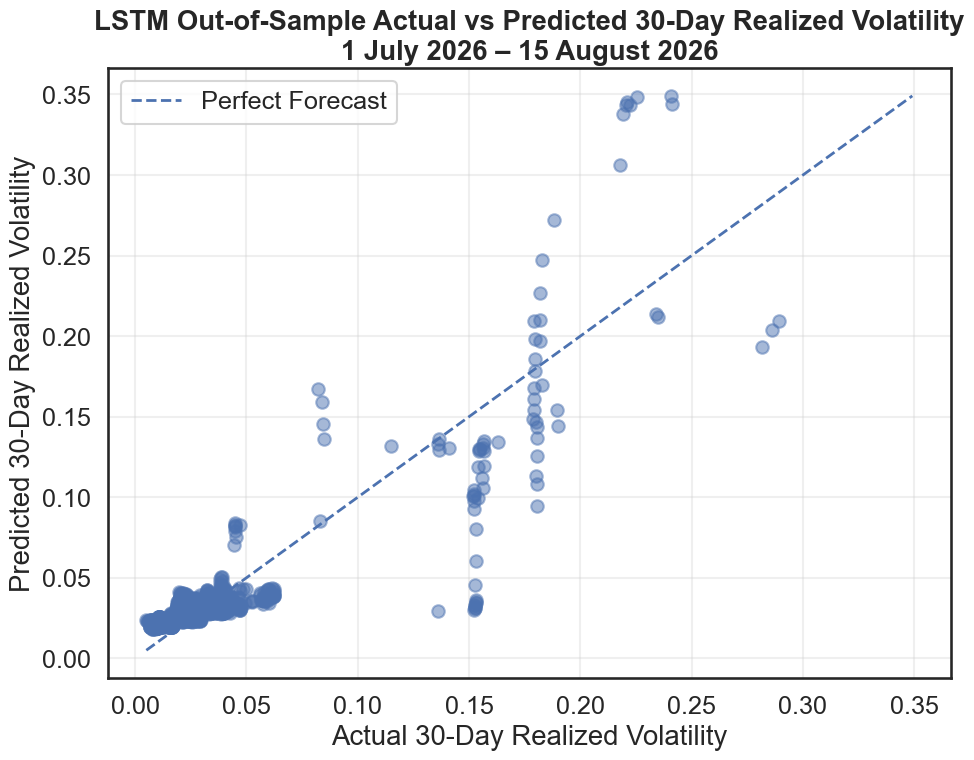

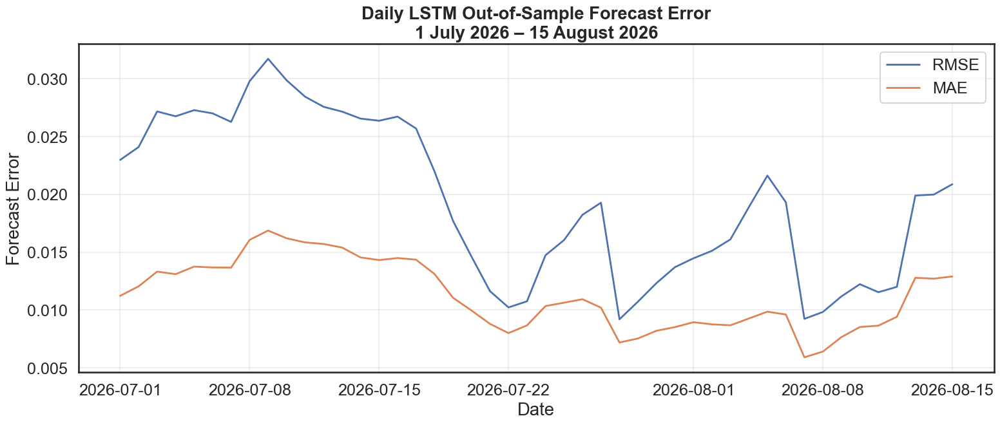

In [101]:
#====================================================
# EVALUATE LSTM OUT-OF-SAMPLE FORECAST ACCURACY
# PERIOD: 01/07/2026 - 15/08/2026
#====================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)


#====================================================
# SETTINGS
#====================================================

OOS_START = pd.Timestamp(
    "2026-07-01"
)

OOS_END = pd.Timestamp(
    "2026-08-15"
)


#====================================================
# EXTRACT OUT-OF-SAMPLE PREDICTIONS
#====================================================

oos_df = (

    final_predictions[

        (
            final_predictions["Date"]
            >= OOS_START
        )

        &

        (
            final_predictions["Date"]
            <= OOS_END
        )

    ]

    .copy()

)


#====================================================
# KEEP VALID ACTUAL-PREDICTION PAIRS
#====================================================

oos_df = (

    oos_df

    .dropna(
        subset=[
            "Actual_RV30",
            "Predicted_RV30"
        ]
    )

    .sort_values(
        [
            "Ticker",
            "Date"
        ]
    )

    .reset_index(drop=True)

)


#====================================================
# SAFETY CHECK
#====================================================

if oos_df.empty:

    raise ValueError(

        "No valid OOS actual-prediction pairs "
        "were found."

    )


print("=" * 80)
print("LSTM OUT-OF-SAMPLE FORECAST EVALUATION")
print("=" * 80)

print(
    "\nOOS period:",
    oos_df["Date"].min().date(),
    "to",
    oos_df["Date"].max().date()
)

print(
    "Cryptocurrencies:",
    oos_df["Ticker"].nunique()
)

print(
    "Observations:",
    len(oos_df)
)


#====================================================
# DEFINE EVALUATION FUNCTION
#====================================================

def evaluate_volatility_forecast(
    actual,
    predicted
):

    actual = np.asarray(
        actual,
        dtype=float
    )

    predicted = np.asarray(
        predicted,
        dtype=float
    )


    #================================================
    # BASIC ERROR METRICS
    #================================================

    rmse = np.sqrt(
        mean_squared_error(
            actual,
            predicted
        )
    )

    mae = mean_absolute_error(
        actual,
        predicted
    )

    r2 = r2_score(
        actual,
        predicted
    )


    #================================================
    # BIAS
    #
    # Positive bias:
    # prediction > actual
    #
    # Negative bias:
    # prediction < actual
    #================================================

    bias = np.mean(
        predicted - actual
    )


    #================================================
    # PEARSON CORRELATION
    #================================================

    if (
        len(actual) > 1
        and
        np.std(actual) > 0
        and
        np.std(predicted) > 0
    ):

        pearson = np.corrcoef(
            actual,
            predicted
        )[0, 1]

    else:

        pearson = np.nan


    #================================================
    # QLIKE
    #
    # Volatility version:
    #
    # log(predicted^2)
    # +
    # actual^2 / predicted^2
    #
    # Lower QLIKE = better
    #================================================

    epsilon = 1e-12

    actual_variance = np.maximum(
        actual ** 2,
        epsilon
    )

    predicted_variance = np.maximum(
        predicted ** 2,
        epsilon
    )

    qlike = np.mean(

        np.log(
            predicted_variance
        )

        +

        (
            actual_variance
            /
            predicted_variance
        )

    )


    #================================================
    # MAPE
    #================================================

    valid = (
        np.abs(actual)
        >
        epsilon
    )

    if valid.any():

        mape = np.mean(

            np.abs(

                (
                    actual[valid]
                    -
                    predicted[valid]
                )

                /
                actual[valid]

            )

        ) * 100

    else:

        mape = np.nan


    return {

        "RMSE": rmse,

        "MAE": mae,

        "MAPE (%)": mape,

        "QLIKE": qlike,

        "R2": r2,

        "Pearson": pearson,

        "Bias": bias

    }


#====================================================
# 1. OVERALL OOS ACCURACY
#====================================================

overall_metrics = evaluate_volatility_forecast(

    oos_df["Actual_RV30"],

    oos_df["Predicted_RV30"]

)


overall_evaluation_df = pd.DataFrame(

    [overall_metrics]

)


print("\n" + "=" * 80)
print("OVERALL OOS ACCURACY")
print("=" * 80)

print(

    overall_evaluation_df

    .round(6)

    .to_string(index=False)

)


#====================================================
# 2. EVALUATION BY CRYPTOCURRENCY
#====================================================

coin_results = []


for ticker in sorted(
    oos_df["Ticker"].unique()
):

    coin = (

        oos_df[

            oos_df["Ticker"]
            ==
            ticker

        ]

        .copy()

    )


    metrics = evaluate_volatility_forecast(

        coin["Actual_RV30"],

        coin["Predicted_RV30"]

    )


    metrics["Ticker"] = ticker

    metrics["Observations"] = len(
        coin
    )


    coin_results.append(
        metrics
    )


#====================================================
# CREATE TABLE
#====================================================

oos_by_ticker_df = pd.DataFrame(
    coin_results
)


# Reorder columns
#====================================================

oos_by_ticker_df = (

    oos_by_ticker_df[

        [
            "Ticker",
            "Observations",
            "RMSE",
            "MAE",
            "MAPE (%)",
            "QLIKE",
            "R2",
            "Pearson",
            "Bias"
        ]

    ]

    .sort_values(
        "RMSE"
    )

    .reset_index(drop=True)

)


# Add ranking
#====================================================

oos_by_ticker_df.insert(

    0,

    "RMSE_Rank",

    range(
        1,
        len(oos_by_ticker_df) + 1
    )

)


print("\n" + "=" * 80)
print("OOS ACCURACY BY CRYPTOCURRENCY")
print("=" * 80)

print(

    oos_by_ticker_df

    .round(6)

    .to_string(index=False)

)


#====================================================
# 3. FORECAST ERRORS
#====================================================

oos_df["Forecast_Error"] = (

    oos_df["Predicted_RV30"]

    -

    oos_df["Actual_RV30"]

)


oos_df["Absolute_Error"] = (

    oos_df["Forecast_Error"]

    .abs()

)


oos_df["Squared_Error"] = (

    oos_df["Forecast_Error"]
    ** 2

)


#====================================================
# 4. DAILY OOS ACCURACY
#====================================================

daily_oos_accuracy = (

    oos_df

    .groupby("Date")

    .agg(

        RMSE=(

            "Squared_Error",

            lambda x:
            np.sqrt(
                np.mean(x)
            )

        ),

        MAE=(

            "Absolute_Error",

            "mean"

        ),

        Bias=(

            "Forecast_Error",

            "mean"

        ),

        Observations=(

            "Ticker",

            "count"

        )

    )

    .reset_index()

)


print("\n" + "=" * 80)
print("DAILY OOS ACCURACY")
print("=" * 80)

print(

    daily_oos_accuracy

    .round(6)

    .to_string(index=False)

)


#====================================================
# 5. SAVE RESULTS
#====================================================

overall_evaluation_df.to_csv(

    "LSTM_OOS_Overall_Accuracy.csv",

    index=False

)


oos_by_ticker_df.to_csv(

    "LSTM_OOS_Accuracy_By_Ticker.csv",

    index=False

)


daily_oos_accuracy.to_csv(

    "LSTM_OOS_Daily_Accuracy.csv",

    index=False

)


oos_df.to_csv(

    "LSTM_OOS_Predictions_Evaluated.csv",

    index=False

)


print("\n" + "=" * 80)
print("FILES SAVED")
print("=" * 80)

print(
    "LSTM_OOS_Overall_Accuracy.csv"
)

print(
    "LSTM_OOS_Accuracy_By_Ticker.csv"
)

print(
    "LSTM_OOS_Daily_Accuracy.csv"
)

print(
    "LSTM_OOS_Predictions_Evaluated.csv"
)


#====================================================
# 6. ACTUAL VS PREDICTED
# SCATTER PLOT
#====================================================

plt.figure(
    figsize=(10, 8)
)


plt.scatter(

    oos_df["Actual_RV30"],

    oos_df["Predicted_RV30"],

    alpha=0.5

)


# 45-degree reference line
#====================================================

minimum_value = min(

    oos_df["Actual_RV30"].min(),

    oos_df["Predicted_RV30"].min()

)


maximum_value = max(

    oos_df["Actual_RV30"].max(),

    oos_df["Predicted_RV30"].max()

)


plt.plot(

    [
        minimum_value,
        maximum_value
    ],

    [
        minimum_value,
        maximum_value
    ],

    linestyle="--",

    linewidth=2,

    label="Perfect Forecast"

)


plt.title(

    "LSTM Out-of-Sample Actual vs Predicted 30-Day Realized Volatility\n"
    "1 July 2026 – 15 August 2026",

    fontweight="bold"

)


plt.xlabel(
    "Actual 30-Day Realized Volatility"
)

plt.ylabel(
    "Predicted 30-Day Realized Volatility"
)

plt.grid(
    alpha=0.3
)

plt.legend()

plt.tight_layout()

plt.show()


#====================================================
# 7. DAILY RMSE AND MAE
#====================================================

plt.figure(
    figsize=(16, 7)
)


plt.plot(

    daily_oos_accuracy["Date"],

    daily_oos_accuracy["RMSE"],

    linewidth=2,

    label="RMSE"

)


plt.plot(

    daily_oos_accuracy["Date"],

    daily_oos_accuracy["MAE"],

    linewidth=2,

    label="MAE"

)


plt.title(

    "Daily LSTM Out-of-Sample Forecast Error\n"
    "1 July 2026 – 15 August 2026",

    fontweight="bold"

)


plt.xlabel(
    "Date"
)

plt.ylabel(
    "Forecast Error"
)

plt.grid(
    alpha=0.3
)

plt.legend()

plt.tight_layout()

plt.show()

In [102]:
#====================================================
# 8. DIRECTIONAL CLASSIFICATION ACCURACY
# ACCURACY, PRECISION, RECALL AND F1-SCORE
#
# Positive Class = Increase in RV_30
# Negative Class = No Increase in RV_30
#====================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)


#====================================================
# CREATE FORECAST ORIGIN DATE
#
# Model forecasts 7 days ahead:
#
# Target Date = t + 7
# Origin Date = t
#====================================================

oos_df["Origin_Date"] = (

    oos_df["Date"]

    -

    pd.Timedelta(
        days=7
    )

)


#====================================================
# PREPARE CURRENT RV_30 AT FORECAST ORIGIN
#
# master_df must contain:
# Date
# Ticker
# RV_30
#====================================================

current_rv = (

    master_df[

        [
            "Date",
            "Ticker",
            "RV_30"
        ]

    ]

    .copy()

)


current_rv["Date"] = pd.to_datetime(
    current_rv["Date"]
)


current_rv = (

    current_rv

    .rename(
        columns={
            "Date": "Origin_Date",
            "RV_30": "Origin_RV30"
        }
    )

)


#====================================================
# MERGE ORIGIN RV WITH OOS FORECASTS
#====================================================

oos_df = (

    oos_df

    .merge(

        current_rv,

        on=[
            "Origin_Date",
            "Ticker"
        ],

        how="left"

    )

)


#====================================================
# REMOVE MISSING OBSERVATIONS
#====================================================

direction_df = (

    oos_df

    .dropna(

        subset=[
            "Origin_RV30",
            "Actual_RV30",
            "Predicted_RV30"
        ]

    )

    .copy()

)


if direction_df.empty:

    raise ValueError(

        "No observations available for "
        "directional accuracy evaluation."

    )


#====================================================
# CREATE ACTUAL DIRECTION
#
# 1 = Actual volatility increased
# 0 = Actual volatility did not increase
#====================================================

direction_df["Actual_Direction"] = (

    direction_df["Actual_RV30"]

    >

    direction_df["Origin_RV30"]

).astype(int)


#====================================================
# CREATE PREDICTED DIRECTION
#
# 1 = Model predicts volatility increase
# 0 = Model predicts no increase
#====================================================

direction_df["Predicted_Direction"] = (

    direction_df["Predicted_RV30"]

    >

    direction_df["Origin_RV30"]

).astype(int)


#====================================================
# CALCULATE OVERALL CLASSIFICATION METRICS
#====================================================

accuracy = accuracy_score(

    direction_df["Actual_Direction"],

    direction_df["Predicted_Direction"]

)


precision = precision_score(

    direction_df["Actual_Direction"],

    direction_df["Predicted_Direction"],

    zero_division=0

)


recall = recall_score(

    direction_df["Actual_Direction"],

    direction_df["Predicted_Direction"],

    zero_division=0

)


f1 = f1_score(

    direction_df["Actual_Direction"],

    direction_df["Predicted_Direction"],

    zero_division=0

)


#====================================================
# CREATE OVERALL CLASSIFICATION TABLE
#====================================================

classification_metrics_df = pd.DataFrame(

    {

        "Metric": [

            "Accuracy",
            "Precision",
            "Recall",
            "F1-Score"

        ],

        "Value": [

            accuracy,
            precision,
            recall,
            f1

        ]

    }

)


print("\n" + "=" * 80)
print("OOS VOLATILITY DIRECTION CLASSIFICATION")
print("=" * 80)

print(

    classification_metrics_df

    .round(6)

    .to_string(index=False)

)


#====================================================
# PRINT AS PERCENTAGES
#====================================================

print("\n" + "=" * 80)
print("CLASSIFICATION PERFORMANCE (%)")
print("=" * 80)

print(
    f"Accuracy  : {accuracy * 100:.2f}%"
)

print(
    f"Precision : {precision * 100:.2f}%"
)

print(
    f"Recall    : {recall * 100:.2f}%"
)

print(
    f"F1-Score  : {f1 * 100:.2f}%"
)


#====================================================
# CONFUSION MATRIX
#====================================================

cm = confusion_matrix(

    direction_df["Actual_Direction"],

    direction_df["Predicted_Direction"]

)


print("\n" + "=" * 80)
print("CONFUSION MATRIX")
print("=" * 80)

print(cm)


#====================================================
# EXTRACT TN, FP, FN, TP
#====================================================

tn, fp, fn, tp = cm.ravel()


print(
    f"\nTrue Negative  (TN): {tn}"
)

print(
    f"False Positive (FP): {fp}"
)

print(
    f"False Negative (FN): {fn}"
)

print(
    f"True Positive  (TP): {tp}"
)


#====================================================
# CLASSIFICATION REPORT
#====================================================

print("\n" + "=" * 80)
print("CLASSIFICATION REPORT")
print("=" * 80)

print(

    classification_report(

        direction_df["Actual_Direction"],

        direction_df["Predicted_Direction"],

        target_names=[
            "No Volatility Increase",
            "Volatility Increase"
        ],

        zero_division=0

    )

)


#====================================================
# 9. CLASSIFICATION METRICS BY CRYPTOCURRENCY
#====================================================

classification_by_ticker = []


for ticker in sorted(

    direction_df["Ticker"].unique()

):


    coin = (

        direction_df[

            direction_df["Ticker"]
            ==
            ticker

        ]

        .copy()

    )


    y_true = coin[
        "Actual_Direction"
    ]


    y_pred = coin[
        "Predicted_Direction"
    ]


    coin_accuracy = accuracy_score(

        y_true,
        y_pred

    )


    coin_precision = precision_score(

        y_true,
        y_pred,

        zero_division=0

    )


    coin_recall = recall_score(

        y_true,
        y_pred,

        zero_division=0

    )


    coin_f1 = f1_score(

        y_true,
        y_pred,

        zero_division=0

    )


    classification_by_ticker.append(

        {

            "Ticker": ticker,

            "Observations": len(coin),

            "Accuracy": coin_accuracy,

            "Precision": coin_precision,

            "Recall": coin_recall,

            "F1_Score": coin_f1

        }

    )


#====================================================
# CREATE DATAFRAME
#====================================================

classification_by_ticker_df = pd.DataFrame(

    classification_by_ticker

)


#====================================================
# SORT BY F1-SCORE
#====================================================

classification_by_ticker_df = (

    classification_by_ticker_df

    .sort_values(

        "F1_Score",

        ascending=False

    )

    .reset_index(drop=True)

)


print("\n" + "=" * 80)
print("CLASSIFICATION ACCURACY BY CRYPTOCURRENCY")
print("=" * 80)

print(

    classification_by_ticker_df

    .round(4)

    .to_string(index=False)

)


#====================================================
# 10. SAVE CLASSIFICATION RESULTS
#====================================================

classification_metrics_df.to_csv(

    "LSTM_OOS_Classification_Metrics.csv",

    index=False

)


classification_by_ticker_df.to_csv(

    "LSTM_OOS_Classification_By_Ticker.csv",

    index=False

)


direction_df.to_csv(

    "LSTM_OOS_Directional_Predictions.csv",

    index=False

)


print("\nClassification results saved successfully.")


OOS VOLATILITY DIRECTION CLASSIFICATION
   Metric    Value
 Accuracy 0.489130
Precision 0.331921
   Recall 0.720859
 F1-Score 0.454545

CLASSIFICATION PERFORMANCE (%)
Accuracy  : 48.91%
Precision : 33.19%
Recall    : 72.09%
F1-Score  : 45.45%

CONFUSION MATRIX
[[305 473]
 [ 91 235]]

True Negative  (TN): 305
False Positive (FP): 473
False Negative (FN): 91
True Positive  (TP): 235

CLASSIFICATION REPORT
                        precision    recall  f1-score   support

No Volatility Increase       0.77      0.39      0.52       778
   Volatility Increase       0.33      0.72      0.45       326

              accuracy                           0.49      1104
             macro avg       0.55      0.56      0.49      1104
          weighted avg       0.64      0.49      0.50      1104


CLASSIFICATION ACCURACY BY CRYPTOCURRENCY
   Ticker  Observations  Accuracy  Precision  Recall  F1_Score
  FIL-USD            46    0.8043     0.7419  0.9583    0.8364
 ATOM-USD            46    0.8043   